# Sensitivity analysis

In [2]:
import joblib
import sklearn
import dask.dataframe as dd
import numpy as np
import pandas as pd
import os
import warnings
import matplotlib.pyplot as plt
import time
import seaborn as sns

First of all, load the models:

In [3]:
model_CL3 = joblib.load('./model_ALLcities_CL3.joblib')

columns_order = ['LC_CORINE', 'IMPERV', 'HEIGHT', 'COAST', 'ELEV', 'POP', 
                 'RH', 'SP', 'PRECIP','T_2M_COR', 'WS', 'TCC',  'CAPE', 
                 'BLH', 'SSR','SOLAR_ELEV', 'DECL']


## SA on CL3

In [ ]:
# Step 1: Load the data using Dask
file_path = r"data/CLUSTER3_TEST_cleaned_cities.csv"
ddf = dd.read_csv(file_path)

ddf['T_2M_COR'] = ddf['T_2M_COR'] - 273.15
ddf = ddf[columns_order]

# Compute the number of rows (n) and columns (m)
n_samples, n_inputs= ddf.shape[0].compute(),  len(columns_order)

# Step 2: Load the min-max file
min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Step 3: Calculate input_ranges using (Max - Min)
input_ranges = min_max_df['Max'] - min_max_df['min']
input_ranges.index = min_max_df['Unnamed: 0']  # Set correct names (HEIGHT, COAST, etc.)
t_target_min = min_max_df.loc[16, 'min']
t_target_max = min_max_df.loc[16, 'Max']

# 10% of input range
delta = 0.1 * input_ranges

# Step 4: Prepare output directory
os.makedirs('results', exist_ok=True)
output_path = r"results/DDSI_CL3_TEST.csv"
# Pre-write CSV with headers
with open(output_path, 'w') as f:
    f.write(','.join(columns_order) + '\n')

# Remove rows with NaN values from df
#ddf = ddf.dropna()
# Step 5: Process samples
# Dask DataFrame to pandas (in memory) chunk-by-chunk
df = ddf.compute()  # This will bring everything into memory now; for *huge* files, you can chunk!

In [ ]:
warnings.filterwarnings("ignore")

# Columns for which we compute sensitivities
allowed_sensitivity_columns = columns_order#['HEIGHT', 'IMPERV', 'POP']
allowed_indices = [columns_order.index(col) for col in allowed_sensitivity_columns]
# Precompute midpoints for each allowed feature based on min_max_df
midpoints = {}
for idx, row in min_max_df.iterrows():
    if row['Unnamed: 0'] in allowed_sensitivity_columns:
        midpoints[row['Unnamed: 0']] = (row['min'] + row['Max']) / 2
        
batch_size = 100000

# Prepare DDSI output file with header
with open(output_path, 'w') as f:
    f.write(','.join(allowed_sensitivity_columns) + '\n')

for batch_start in range(0, n_samples, batch_size):
    batch_end = min(batch_start + batch_size, n_samples)
    batch_samples = df.iloc[batch_start:batch_end].values

    start_time = time.time()

    n_batch_samples = batch_samples.shape[0]
    n_allowed = len(allowed_indices)

    # Expand batch_samples to create perturbations
    sample_plus = np.repeat(batch_samples, n_allowed, axis=0)
    sample_minus = np.repeat(batch_samples, n_allowed, axis=0)

    # Apply perturbations
    for idx_in_allowed, feature_idx in enumerate(allowed_indices):
        sample_plus[idx_in_allowed::n_allowed, feature_idx] += delta.iloc[feature_idx]
        sample_minus[idx_in_allowed::n_allowed, feature_idx] -= delta.iloc[feature_idx]

    if np.any(np.isnan(sample_plus)) or np.any(np.isnan(sample_minus)):
        print("Warning: NaN detected in perturbed samples. Replacing with midpoints.")
        # Replace NaN values with the precomputed midpoint of the range for each feature
        for idx_in_allowed, feature_idx in enumerate(allowed_indices):
            feature_name = allowed_sensitivity_columns[idx_in_allowed]
            midpoint = midpoints[feature_name]
        
            # Replace NaNs in sample_plus and sample_minus with midpoint
            sample_plus[np.isnan(sample_plus[:, feature_idx]), feature_idx] = midpoint
            sample_minus[np.isnan(sample_minus[:, feature_idx]), feature_idx] = midpoint

    # Clip extreme values if necessary
    sample_plus = np.clip(sample_plus, -1e10, 1e10)
    sample_minus = np.clip(sample_minus, -1e10, 1e10)

    # Stack all perturbed samples
    perturbations = np.vstack((sample_plus, sample_minus))  # shape (2 * n_batch_samples * n_allowed, n_features)

    # Predict all perturbed samples at once
    try:
        outputs = model_CL3.predict(perturbations)
    except ValueError as e:
        print(f"Error during prediction: {e}")
        continue

    # Reshape predictions
    output_plus = outputs[:n_batch_samples * n_allowed].reshape(n_batch_samples, n_allowed)
    output_minus = outputs[n_batch_samples * n_allowed:].reshape(n_batch_samples, n_allowed)

    # Apply shift and scaling
    output_plus = (output_plus + 273.15 - t_target_min) / (t_target_max - t_target_min)
    output_minus = (output_minus + 273.15 - t_target_min) / (t_target_max - t_target_min)

    # Sensitivities for the whole batch
    sensitivities_batch = (output_plus - output_minus) / (2 * delta.iloc[allowed_indices].values)

    # Save
    if batch_start == 0:
        np.savetxt(output_path, sensitivities_batch, delimiter=',', fmt='%.8f', header=','.join(allowed_sensitivity_columns), comments='')
    else:
        with open(output_path, 'ab') as f:
            np.savetxt(f, sensitivities_batch, delimiter=',', fmt='%.8f')

    end_time = time.time()
    print(f"Processed batch {batch_start} to {batch_end-1} in {end_time - start_time:.2f} seconds.")


In [ ]:
warnings.filterwarnings("ignore")

# Settings
file_path = r"data/CLUSTER3_TRAIN_cleaned_cities.csv"
min_max_file = r"data/total_min_max.csv"
output_path = r"results/DDSI_CL3_TRAIN.csv"
rows_per_chunk = 500000000
batch_size = 100000

# Step 1: Load the data using Dask (don't call compute yet!)
ddf = dd.read_csv(file_path, assume_missing=True, blocksize="500MB")

# Drop NaNs and select columns
#ddf = ddf.dropna()
ddf['T_2M_COR'] = ddf['T_2M_COR'] - 273.15
ddf = ddf[columns_order]

# Step 2: Load min-max info
min_max_df = pd.read_csv(min_max_file, sep=';')
input_ranges = min_max_df['Max'] - min_max_df['min']
input_ranges.index = min_max_df['Unnamed: 0']

t_target_min = min_max_df.loc[16, 'min']
t_target_max = min_max_df.loc[16, 'Max']
delta = 0.1 * input_ranges

# Precompute midpoints
allowed_sensitivity_columns = columns_order
allowed_indices = [columns_order.index(col) for col in allowed_sensitivity_columns]
midpoints = {
    row['Unnamed: 0']: (row['min'] + row['Max']) / 2
    for _, row in min_max_df.iterrows()
    if row['Unnamed: 0'] in allowed_sensitivity_columns
}

# Prepare output
os.makedirs('results', exist_ok=True)
with open(output_path, 'w') as f:
    f.write(','.join(columns_order) + '\n')

# Process by partition to limit memory use
delayed_partitions = ddf.to_delayed()

for i, delayed_df in enumerate(delayed_partitions):
    print(f"Processing partition {i + 1}/{len(delayed_partitions)}...")
    
    # Compute partition into pandas
    try:
        chunk = delayed_df.compute()
    except Exception as e:
        print(f"Skipping partition {i + 1} due to error: {e}")
        continue
    
    chunk_values = chunk.values
    n_chunk_samples = chunk_values.shape[0]

    for batch_start in range(0, n_chunk_samples, batch_size):
        batch_end = min(batch_start + batch_size, n_chunk_samples)
        batch_samples = chunk_values[batch_start:batch_end]
        n_batch_samples = batch_samples.shape[0]
        n_allowed = len(allowed_indices)

        start_time = time.time()

        # Perturbations
        sample_plus = np.repeat(batch_samples, n_allowed, axis=0)
        sample_minus = np.repeat(batch_samples, n_allowed, axis=0)

        for idx_in_allowed, feature_idx in enumerate(allowed_indices):
            sample_plus[idx_in_allowed::n_allowed, feature_idx] += delta.iloc[feature_idx]
            sample_minus[idx_in_allowed::n_allowed, feature_idx] -= delta.iloc[feature_idx]

        if np.any(np.isnan(sample_plus)) or np.any(np.isnan(sample_minus)):
            print("NaNs in perturbed samples — replacing with midpoints.")
            for idx_in_allowed, feature_idx in enumerate(allowed_indices):
                feature_name = allowed_sensitivity_columns[idx_in_allowed]
                midpoint = midpoints[feature_name]
                sample_plus[np.isnan(sample_plus[:, feature_idx]), feature_idx] = midpoint
                sample_minus[np.isnan(sample_minus[:, feature_idx]), feature_idx] = midpoint

        sample_plus = np.clip(sample_plus, -1e10, 1e10)
        sample_minus = np.clip(sample_minus, -1e10, 1e10)
        perturbations = np.vstack((sample_plus, sample_minus))

        try:
            outputs = model_CL3.predict(perturbations)
        except ValueError as e:
            print(f"Prediction error: {e}")
            continue

        output_plus = outputs[:n_batch_samples * n_allowed].reshape(n_batch_samples, n_allowed)
        output_minus = outputs[n_batch_samples * n_allowed:].reshape(n_batch_samples, n_allowed)

        output_plus = (output_plus + 273.15 - t_target_min) / (t_target_max - t_target_min)
        output_minus = (output_minus + 273.15 - t_target_min) / (t_target_max - t_target_min)

        sensitivities_batch = (output_plus - output_minus) / (2 * delta.iloc[allowed_indices].values)

        with open(output_path, 'ab') as f:
            np.savetxt(f, sensitivities_batch, delimiter=',', fmt='%.8f')

        end_time = time.time()
        print(f"Processed rows {batch_start}-{batch_end - 1} in {end_time - start_time:.2f} sec.")

print("Processing complete.")


In [ ]:
# Step 1: Load the data using Dask
file_path = r"data/CLUSTER3_VALIDATION_cleaned_cities.csv"
ddf = dd.read_csv(file_path)

ddf['T_2M_COR'] = ddf['T_2M_COR'] - 273.15
ddf = ddf[columns_order]

# Compute the number of rows (n) and columns (m)
n_samples, n_inputs= ddf.shape[0].compute(),  len(columns_order)

# Step 2: Load the min-max file
min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Step 3: Calculate input_ranges using (Max - Min)
input_ranges = min_max_df['Max'] - min_max_df['min']
input_ranges.index = min_max_df['Unnamed: 0']  # Set correct names (HEIGHT, COAST, etc.)
t_target_min = min_max_df.loc[16, 'min']
t_target_max = min_max_df.loc[16, 'Max']

# 10% of input range
delta = 0.1 * input_ranges

# Step 4: Prepare output directory
os.makedirs('results', exist_ok=True)
output_path = r"results/DDSI_CL3_VALIDATION.csv"
# Pre-write CSV with headers
with open(output_path, 'w') as f:
    f.write(','.join(columns_order) + '\n')

# Remove rows with NaN values from df
#ddf = ddf.dropna()
# Step 5: Process samples
# Dask DataFrame to pandas (in memory) chunk-by-chunk
df = ddf.compute()  # This will bring everything into memory now; for *huge* files, you can chunk!

In [ ]:
warnings.filterwarnings("ignore")

# Columns for which we compute sensitivities
allowed_sensitivity_columns = columns_order#['HEIGHT', 'IMPERV', 'POP']
allowed_indices = [columns_order.index(col) for col in allowed_sensitivity_columns]
# Precompute midpoints for each allowed feature based on min_max_df
midpoints = {}
for idx, row in min_max_df.iterrows():
    if row['Unnamed: 0'] in allowed_sensitivity_columns:
        midpoints[row['Unnamed: 0']] = (row['min'] + row['Max']) / 2
        
batch_size = 100000

# Prepare DDSI output file with header
with open(output_path, 'w') as f:
    f.write(','.join(allowed_sensitivity_columns) + '\n')

for batch_start in range(0, n_samples, batch_size):
    batch_end = min(batch_start + batch_size, n_samples)
    batch_samples = df.iloc[batch_start:batch_end].values

    start_time = time.time()

    n_batch_samples = batch_samples.shape[0]
    n_allowed = len(allowed_indices)

    # Expand batch_samples to create perturbations
    sample_plus = np.repeat(batch_samples, n_allowed, axis=0)
    sample_minus = np.repeat(batch_samples, n_allowed, axis=0)

    # Apply perturbations
    for idx_in_allowed, feature_idx in enumerate(allowed_indices):
        sample_plus[idx_in_allowed::n_allowed, feature_idx] += delta.iloc[feature_idx]
        sample_minus[idx_in_allowed::n_allowed, feature_idx] -= delta.iloc[feature_idx]

    if np.any(np.isnan(sample_plus)) or np.any(np.isnan(sample_minus)):
        print("Warning: NaN detected in perturbed samples. Replacing with midpoints.")
        # Replace NaN values with the precomputed midpoint of the range for each feature
        for idx_in_allowed, feature_idx in enumerate(allowed_indices):
            feature_name = allowed_sensitivity_columns[idx_in_allowed]
            midpoint = midpoints[feature_name]
        
            # Replace NaNs in sample_plus and sample_minus with midpoint
            sample_plus[np.isnan(sample_plus[:, feature_idx]), feature_idx] = midpoint
            sample_minus[np.isnan(sample_minus[:, feature_idx]), feature_idx] = midpoint

    # Clip extreme values if necessary
    sample_plus = np.clip(sample_plus, -1e10, 1e10)
    sample_minus = np.clip(sample_minus, -1e10, 1e10)

    # Stack all perturbed samples
    perturbations = np.vstack((sample_plus, sample_minus))  # shape (2 * n_batch_samples * n_allowed, n_features)

    # Predict all perturbed samples at once
    try:
        outputs = model_CL3.predict(perturbations)
    except ValueError as e:
        print(f"Error during prediction: {e}")
        continue

    # Reshape predictions
    output_plus = outputs[:n_batch_samples * n_allowed].reshape(n_batch_samples, n_allowed)
    output_minus = outputs[n_batch_samples * n_allowed:].reshape(n_batch_samples, n_allowed)

    # Apply shift and scaling
    output_plus = (output_plus + 273.15 - t_target_min) / (t_target_max - t_target_min)
    output_minus = (output_minus + 273.15 - t_target_min) / (t_target_max - t_target_min)

    # Sensitivities for the whole batch
    sensitivities_batch = (output_plus - output_minus) / (2 * delta.iloc[allowed_indices].values)

    # Save
    if batch_start == 0:
        np.savetxt(output_path, sensitivities_batch, delimiter=',', fmt='%.8f', header=','.join(allowed_sensitivity_columns), comments='')
    else:
        with open(output_path, 'ab') as f:
            np.savetxt(f, sensitivities_batch, delimiter=',', fmt='%.8f')

    end_time = time.time()
    print(f"Processed batch {batch_start} to {batch_end-1} in {end_time - start_time:.2f} seconds.")


In [ ]:
n_samples*0.55/100000/60

In [ ]:
# Base path and file template
base_path = 'data'
file_template = 'CLUSTER3_{}_cities.csv'
sets = ['TRAIN', 'TEST', 'VALIDATION']

# Columns to check for NA values
columns_order = [
    'LC_CORINE', 'IMPERV', 'HEIGHT', 'COAST', 'ELEV', 'POP',
    'RH', 'SP', 'PRECIP', 'T_2M_COR', 'WS', 'TCC', 'CAPE',
    'BLH', 'SSR', 'SOLAR_ELEV', 'DECL'
]

# Chunk size for reading large files
chunk_size = 1_000_000

for set_name in sets:
    input_file = os.path.join(base_path, file_template.format(set_name))
    output_file = os.path.join(base_path, file_template.format(set_name + '_cleaned'))

    print(f"\n Processing file: {input_file}")

    chunk_counter = 0
    total_rows_cleaned = 0
    first_chunk = True

    start_file_time = time.time()

    with pd.read_csv(input_file, chunksize=chunk_size) as reader:
        for chunk in reader:
            chunk_counter += 1
            start_chunk_time = time.time()

            initial_rows = len(chunk)
            cleaned_chunk = chunk.dropna(subset=columns_order)
            cleaned_rows = len(cleaned_chunk)
            total_rows_cleaned += cleaned_rows

            cleaned_chunk.to_csv(
                output_file,
                mode='w' if first_chunk else 'a',
                index=False,
                header=first_chunk
            )
            first_chunk = False

            duration = time.time() - start_chunk_time
            print(f"  Chunk {chunk_counter}: "
                  f"read {initial_rows} rows → kept {cleaned_rows} rows "
                  f"in {duration:.2f} seconds")

    total_duration = time.time() - start_file_time
    print(f" Finished {set_name}: {chunk_counter} chunks processed, "
          f"{total_rows_cleaned} rows retained. "
          f"Total time: {total_duration:.2f} seconds")

print("\n All datasets cleaned and saved successfully.")


In [ ]:
dds_df = pd.read_csv(r'results/DDSI_CL3_TEST.csv')
cities_ddf = dd.read_csv(file_path)[['T_TARGET', 'HEIGHT', 'IMPERV', 'POP', 'LC_CORINE']]
cities_df = cities_ddf.compute()

In [ ]:
#dds_df = pd.read_csv(r'results/DDSI.csv')
#cities_ddf = dd.read_csv(file_path)[['T_TARGET', 'HEIGHT']]
#cities_df = cities_ddf.compute()

t_target_min = min_max_df.loc[16, 'min']
t_target_max = min_max_df.loc[16, 'Max']
height_min = min_max_df.loc[0, 'min']
height_max = min_max_df.loc[0, 'Max']

# Scale T_TARGET and HEIGHT to [0, 1]
t_target_scaled = (cities_df['T_TARGET'] - t_target_min) / (t_target_max - t_target_min)
height_scaled = (cities_df['HEIGHT'] - height_min) / (height_max - height_min)

# Parameters
bin_size = 0.01
n_bins = int(1 / bin_size)

# Choose which sensitivity index to plot
# Example: sensitivity to HEIGHT itself
sensitivity_column = 'HEIGHT'  # You can change this to any other column

if sensitivity_column not in dds_df.columns:
    raise ValueError(f"Sensitivity column {sensitivity_column} not found in DDSI.")


sensitivities = dds_df[sensitivity_column]

# Create 2D histogram bins
heatmap_sum = np.zeros((n_bins, n_bins))
heatmap_count = np.zeros((n_bins, n_bins))

# Fill bins
for x, y, s in zip(t_target_scaled, height_scaled, sensitivities):
    bin_x = min(int(x / bin_size), n_bins - 1)
    bin_y = min(int(y / bin_size), n_bins - 1)
    
    heatmap_sum[bin_y, bin_x] += s
    heatmap_count[bin_y, bin_x] += 1

# Avoid division by zero
heatmap_avg = np.divide(heatmap_sum, heatmap_count, out=np.zeros_like(heatmap_sum), where=heatmap_count!=0)

# Plot
plt.figure(figsize=(8, 6))
plt.imshow(heatmap_avg, origin='lower', extent=[0,1,0,1], aspect='auto', cmap='viridis')
plt.colorbar(label=f'Average Sensitivity ({sensitivity_column})')
plt.xlabel('T_TARGET (scaled)')
plt.ylabel('HEIGHT (scaled)')
plt.title(f'Sensitivity Map for {sensitivity_column}')
plt.grid(False)
plt.show()


In [ ]:
# Extract min/max values for scaling
height_min = min_max_df.loc[0, 'min']
height_max = min_max_df.loc[0, 'Max']

# Scale HEIGHT to [0, 1]
height_scaled = (cities_df['HEIGHT'] - height_min) / (height_max - height_min)

# Choose which sensitivity index to plot
sensitivity_column = 'HEIGHT'  # Adjust if needed

if sensitivity_column not in dds_df.columns:
    raise ValueError(f"Sensitivity column {sensitivity_column} not found in DDSI.")

sensitivities = dds_df[sensitivity_column]
height_scaled = height_scaled.iloc[:len(sensitivities)]

# Parameters
height_bin_size = 0.01
sens_bin_size = 0.00001  # Adjust as needed depending on sensitivity value spread

# Find bin ranges
height_bins = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = sensitivities.min()
sens_max = sensitivities.max()
sens_bins = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Create 2D histogram: counts per (height, sensitivity) bin
heatmap_count, xedges, yedges = np.histogram2d(height_scaled, sensitivities, bins=[height_bins, sens_bins])

# Calculate the number of instances in each height bin
height_bin_counts, _ = np.histogram(height_scaled, bins=height_bins)

# Normalize by dividing the counts by the number of instances in each height bin
for i in range(len(height_bin_counts)):
    if height_bin_counts[i] > 0:  # Avoid division by zero
        heatmap_count[i, :] /= height_bin_counts[i]

# Plot
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count.T, origin='lower', 
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma')
plt.colorbar(label='Normalized Count')
plt.xlabel('HEIGHT (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0001,0.0007)
plt.title(f'Normalized Count Map of {sensitivity_column} Sensitivity vs HEIGHT')
plt.grid(False)
plt.show()

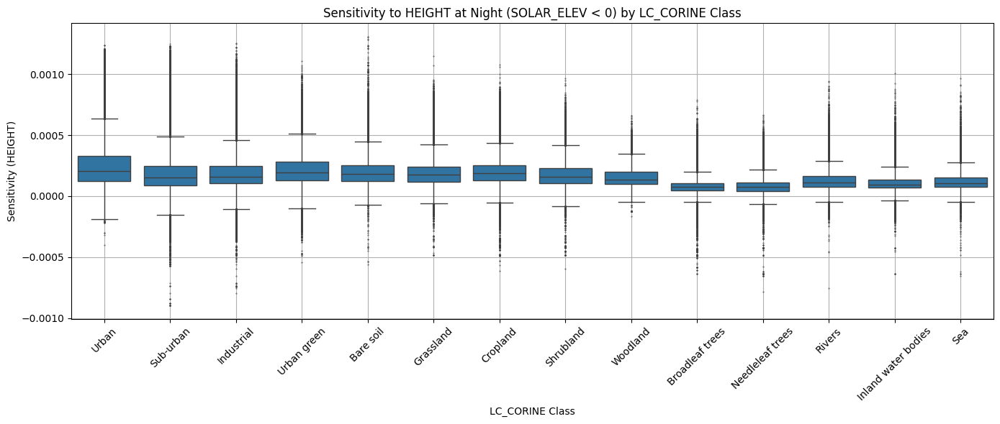

In [5]:

data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
# Dictionary to collect sensitivities per LC_CORINE class at night
lc_sensitivities = {}

# Second pass to collect sensitivities grouped by LC_CORINE during nighttime
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['SOLAR_ELEV', 'LC_CORINE'], chunksize=batch_size)

    print(f"\nCollecting sensitivities by LC_CORINE for {part}...")

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Nighttime mask
        mask_night = cities_chunk['SOLAR_ELEV'] < 0
        if not np.any(mask_night):
            continue

        sensitivities = dds_chunk.loc[mask_night, sensitivity_column].values
        lc_classes = cities_chunk.loc[mask_night, 'LC_CORINE'].values

        for lc_class, sens in zip(lc_classes, sensitivities):
            if lc_class not in lc_sensitivities:
                lc_sensitivities[lc_class] = []
            lc_sensitivities[lc_class].append(sens)

boxplot_data = pd.DataFrame([
    {'LC_CORINE': lc, 'Sensitivity': s}
    for lc, sens_list in lc_sensitivities.items()
    for s in sens_list
])

# Set the correct class labels (without class 5.0)
lc_labels = [
    "Urban", "Sub-urban", "Industrial", "Urban green",     # 1.0–4.0
    "Bare soil", "Grassland", "Cropland", "Shrubland",      # 6.0–9.0
    "Woodland", "Broadleaf trees", "Needleleaf trees",       # 10.0–12.0
    "Rivers", "Inland water bodies", "Sea"                  # 13.0–15.0
]

# Corresponding class numbers (excluding 5.0)
lc_class_numbers = [1.0, 2.0, 3.0, 4.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0]

# Build label mapping
label_mapping = {k: v for k, v in zip(lc_class_numbers, lc_labels)}
boxplot_data['LC_CORINE_LABEL'] = boxplot_data['LC_CORINE'].map(label_mapping)

# Set categorical order
boxplot_data['LC_CORINE_LABEL'] = pd.Categorical(
    boxplot_data['LC_CORINE_LABEL'],
    categories=lc_labels,
    ordered=True
)

# Plot with fixed order
plt.figure(figsize=(14, 6))
sns.boxplot(
    data=boxplot_data,
    x='LC_CORINE_LABEL',
    y='Sensitivity',
    showfliers=True,
    fliersize = 0.4
)
plt.title(f'Sensitivity to {sensitivity_column} at Night (SOLAR_ELEV < 0) by LC_CORINE Class')
plt.xlabel('LC_CORINE Class')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True)
plt.show()



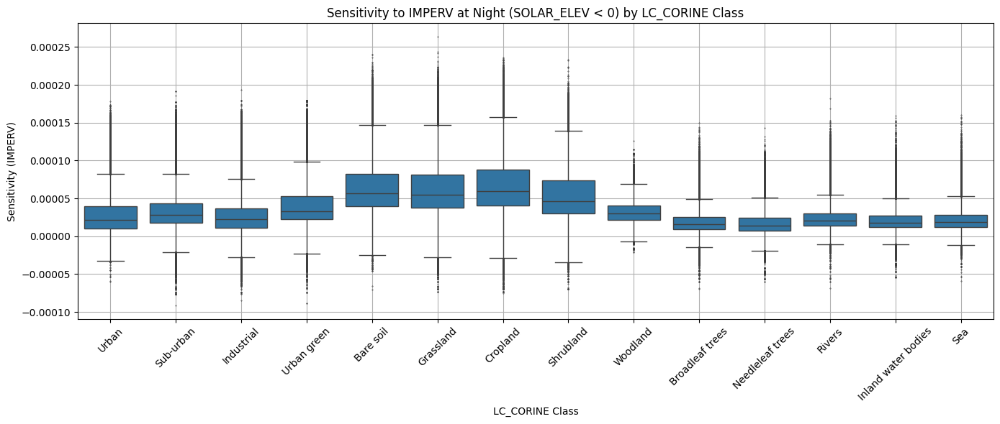

In [6]:

data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
# Dictionary to collect sensitivities per LC_CORINE class at night
lc_sensitivities = {}

# Second pass to collect sensitivities grouped by LC_CORINE during nighttime
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['SOLAR_ELEV', 'LC_CORINE'], chunksize=batch_size)

    print(f"\nCollecting sensitivities by LC_CORINE for {part}...")

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Nighttime mask
        mask_night = cities_chunk['SOLAR_ELEV'] < 0
        if not np.any(mask_night):
            continue

        sensitivities = dds_chunk.loc[mask_night, sensitivity_column].values
        lc_classes = cities_chunk.loc[mask_night, 'LC_CORINE'].values

        for lc_class, sens in zip(lc_classes, sensitivities):
            if lc_class not in lc_sensitivities:
                lc_sensitivities[lc_class] = []
            lc_sensitivities[lc_class].append(sens)

boxplot_data = pd.DataFrame([
    {'LC_CORINE': lc, 'Sensitivity': s}
    for lc, sens_list in lc_sensitivities.items()
    for s in sens_list
])

# Set the correct class labels (without class 5.0)
lc_labels = [
    "Urban", "Sub-urban", "Industrial", "Urban green",     # 1.0–4.0
    "Bare soil", "Grassland", "Cropland", "Shrubland",      # 6.0–9.0
    "Woodland", "Broadleaf trees", "Needleleaf trees",       # 10.0–12.0
    "Rivers", "Inland water bodies", "Sea"                  # 13.0–15.0
]

# Corresponding class numbers (excluding 5.0)
lc_class_numbers = [1.0, 2.0, 3.0, 4.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0]

# Build label mapping
label_mapping = {k: v for k, v in zip(lc_class_numbers, lc_labels)}
boxplot_data['LC_CORINE_LABEL'] = boxplot_data['LC_CORINE'].map(label_mapping)

# Set categorical order
boxplot_data['LC_CORINE_LABEL'] = pd.Categorical(
    boxplot_data['LC_CORINE_LABEL'],
    categories=lc_labels,
    ordered=True
)

# Plot with fixed order
plt.figure(figsize=(14, 6))
sns.boxplot(
    data=boxplot_data,
    x='LC_CORINE_LABEL',
    y='Sensitivity',
    showfliers=True,
    fliersize = 0.4
)
plt.title(f'Sensitivity to {sensitivity_column} at Night (SOLAR_ELEV < 0) by LC_CORINE Class')
plt.xlabel('LC_CORINE Class')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True)
plt.show()



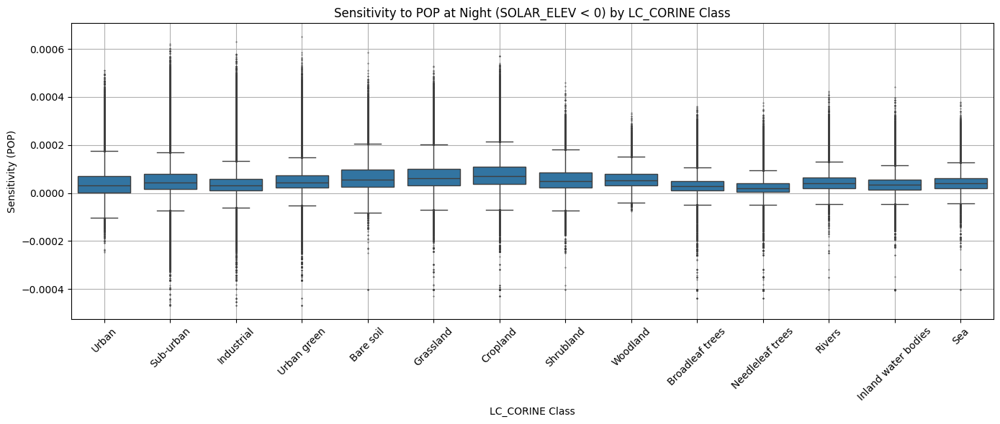

In [4]:

data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
# Dictionary to collect sensitivities per LC_CORINE class at night
lc_sensitivities = {}

# Second pass to collect sensitivities grouped by LC_CORINE during nighttime
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['SOLAR_ELEV', 'LC_CORINE'], chunksize=batch_size)

    print(f"\nCollecting sensitivities by LC_CORINE for {part}...")

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Nighttime mask
        mask_night = cities_chunk['SOLAR_ELEV'] < 0
        if not np.any(mask_night):
            continue

        sensitivities = dds_chunk.loc[mask_night, sensitivity_column].values
        lc_classes = cities_chunk.loc[mask_night, 'LC_CORINE'].values

        for lc_class, sens in zip(lc_classes, sensitivities):
            if lc_class not in lc_sensitivities:
                lc_sensitivities[lc_class] = []
            lc_sensitivities[lc_class].append(sens)

boxplot_data = pd.DataFrame([
    {'LC_CORINE': lc, 'Sensitivity': s}
    for lc, sens_list in lc_sensitivities.items()
    for s in sens_list
])

# Set the correct class labels (without class 5.0)
lc_labels = [
    "Urban", "Sub-urban", "Industrial", "Urban green",     # 1.0–4.0
    "Bare soil", "Grassland", "Cropland", "Shrubland",      # 6.0–9.0
    "Woodland", "Broadleaf trees", "Needleleaf trees",       # 10.0–12.0
    "Rivers", "Inland water bodies", "Sea"                  # 13.0–15.0
]

# Corresponding class numbers (excluding 5.0)
lc_class_numbers = [1.0, 2.0, 3.0, 4.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0]

# Build label mapping
label_mapping = {k: v for k, v in zip(lc_class_numbers, lc_labels)}
boxplot_data['LC_CORINE_LABEL'] = boxplot_data['LC_CORINE'].map(label_mapping)

# Set categorical order
boxplot_data['LC_CORINE_LABEL'] = pd.Categorical(
    boxplot_data['LC_CORINE_LABEL'],
    categories=lc_labels,
    ordered=True
)

# Plot with fixed order
plt.figure(figsize=(14, 6))
sns.boxplot(
    data=boxplot_data,
    x='LC_CORINE_LABEL',
    y='Sensitivity',
    showfliers=True,
    fliersize = 0.4
)
plt.title(f'Sensitivity to {sensitivity_column} at Night (SOLAR_ELEV < 0) by LC_CORINE Class')
plt.xlabel('LC_CORINE Class')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True)
plt.show()




Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 4.02 seconds.
Processed TRAIN chunk 2 in 4.59 seconds.
Processed TRAIN chunk 3 in 4.44 seconds.
Processed TRAIN chunk 4 in 4.34 seconds.
Processed TRAIN chunk 5 in 4.60 seconds.
Processed TRAIN chunk 6 in 4.48 seconds.
Processed TRAIN chunk 7 in 4.45 seconds.
Processed TRAIN chunk 8 in 4.26 seconds.
Processed TRAIN chunk 9 in 4.15 seconds.
Processed TRAIN chunk 10 in 4.36 seconds.
Processed TRAIN chunk 11 in 4.41 seconds.
Processed TRAIN chunk 12 in 4.17 seconds.
Processed TRAIN chunk 13 in 4.42 seconds.
Processed TRAIN chunk 14 in 4.29 seconds.
Processed TRAIN chunk 15 in 4.34 seconds.
Processed TRAIN chunk 16 in 4.20 seconds.
Processed TRAIN chunk 17 in 4.15 seconds.
Processed TRAIN chunk 18 in 4.13 seconds.
Processed TRAIN chunk 19 in 4.29 seconds.
Processed TRAIN chunk 20 in 4.54 seconds.
Processed TRAIN chunk 21 in 4.19 seconds.
Processed TRAIN chunk 22 in 4.15 seconds.
Processed TRAIN chunk 23 in 4.16 seconds.
P

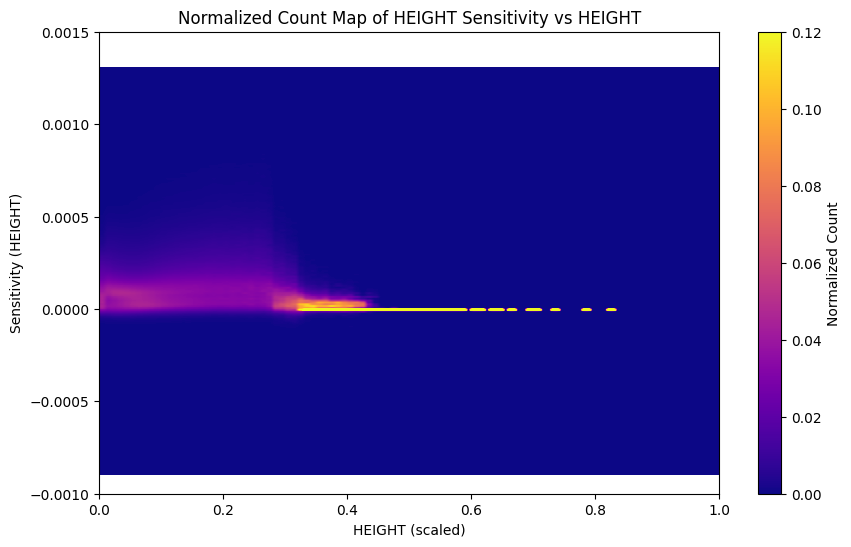

In [56]:
# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[0, 'min']
height_max = min_max_df.loc[0, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.00001

height_bins = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity across all batches
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins now that we know min/max
sens_bins = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators
heatmap_count = np.zeros((len(height_bins) - 1, len(sens_bins) - 1))
height_bin_counts = np.zeros(len(height_bins) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['HEIGHT'], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time() 
    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        chunk_counter += 1
        
        
        # Align the batches
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk['HEIGHT'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)  # Ensure within [0, 1]

        # 2D histogram accumulation
        hmap, _, _ = np.histogram2d(height_scaled, sensitivities, bins=[height_bins, sens_bins])
        hcount, _ = np.histogram(height_scaled, bins=height_bins)

        # Update accumulators
        heatmap_count += hmap
        height_bin_counts += hcount

        # Calculate time taken for this chunk
        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize
for i in range(len(height_bin_counts)):
    if height_bin_counts[i] > 0:
        heatmap_count[i, :] /= height_bin_counts[i]

# Plotting
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel('HEIGHT (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Normalized Count Map of {sensitivity_column} Sensitivity vs HEIGHT')
plt.grid(False)
plt.show()


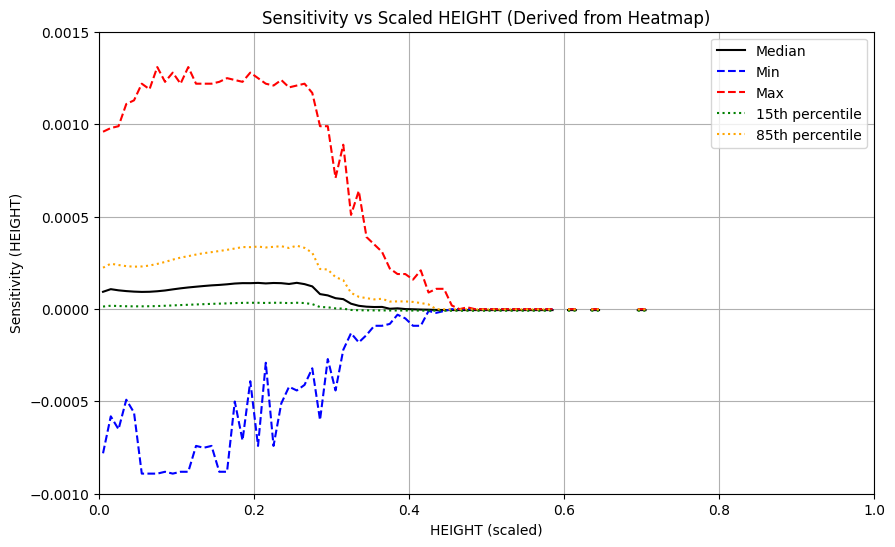

In [57]:
# Compute bin centers for HEIGHT and sensitivity
bin_centers_height = (height_bins[:-1] + height_bins[1:]) / 2
bin_centers_sens = (sens_bins[:-1] + sens_bins[1:]) / 2

# Prepare lists to store computed statistics
median_sens = []
min_sens = []
max_sens = []
p15_sens = []
p85_sens = []

# Compute statistics from the normalized histograms
for i in range(heatmap_count.shape[0]):
    counts = heatmap_count[i, :]
    
    if counts.sum() == 0:
        median_sens.append(np.nan)
        min_sens.append(np.nan)
        max_sens.append(np.nan)
        p15_sens.append(np.nan)
        p85_sens.append(np.nan)
        continue

    cdf = np.cumsum(counts)
    cdf = cdf / cdf[-1]  # Normalize to [0, 1]
    
    # Get interpolated values at desired percentiles
    median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
    p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
    p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

    # Min/max from non-zero counts
    nonzero_idx = np.where(counts > 0)[0]
    min_sens.append(bin_centers_sens[nonzero_idx[0]])
    max_sens.append(bin_centers_sens[nonzero_idx[-1]])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_sens, label='Median', color='black')
plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0,1)
plt.ylim(-0.001, 0.0015)
plt.xlabel('HEIGHT (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs Scaled HEIGHT (Derived from Heatmap)')
plt.legend()
plt.grid(True)
plt.show()


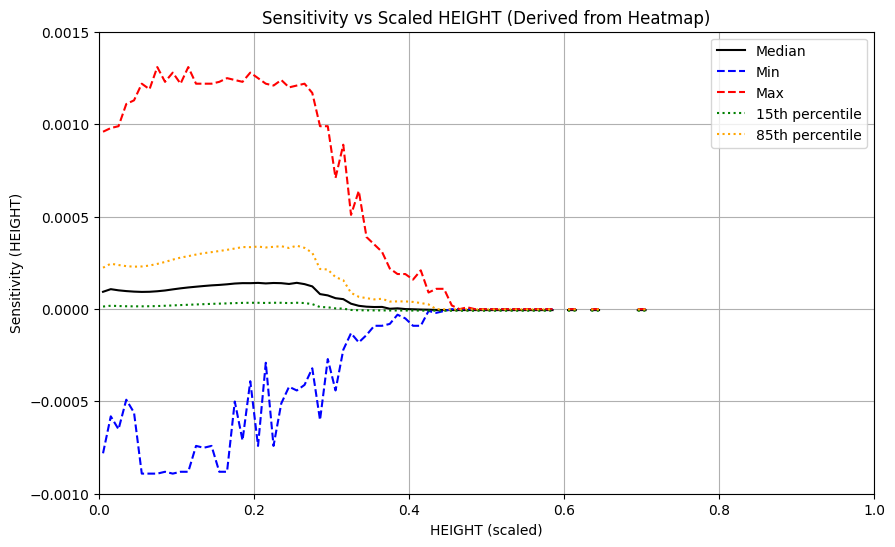

In [7]:
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_sens, label='Median', color='black')
plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0,1)
plt.ylim(-0.001, 0.0015)
plt.xlabel('HEIGHT (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs Scaled HEIGHT (Derived from Heatmap)')
plt.legend()
plt.grid(True)
plt.show()


Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 7.62 seconds.
Processed TRAIN chunk 2 in 7.67 seconds.
Processed TRAIN chunk 3 in 7.62 seconds.
Processed TRAIN chunk 4 in 7.71 seconds.
Processed TRAIN chunk 5 in 7.61 seconds.
Processed TRAIN chunk 6 in 7.48 seconds.
Processed TRAIN chunk 7 in 7.78 seconds.
Processed TRAIN chunk 8 in 8.22 seconds.
Processed TRAIN chunk 9 in 7.65 seconds.
Processed TRAIN chunk 10 in 7.50 seconds.
Processed TRAIN chunk 11 in 7.42 seconds.
Processed TRAIN chunk 12 in 7.57 seconds.
Processed TRAIN chunk 13 in 8.14 seconds.
Processed TRAIN chunk 14 in 7.81 seconds.
Processed TRAIN chunk 15 in 7.87 seconds.
Processed TRAIN chunk 16 in 8.18 seconds.
Processed TRAIN chunk 17 in 8.38 seconds.
Processed TRAIN chunk 18 in 7.78 seconds.
Processed TRAIN chunk 19 in 7.95 seconds.
Processed TRAIN chunk 20 in 7.84 seconds.
Processed TRAIN chunk 21 in 9.67 seconds.
Processed TRAIN chunk 22 in 9.82 seconds.
Processed TRAIN chunk 23 in 9.77 seconds.
P

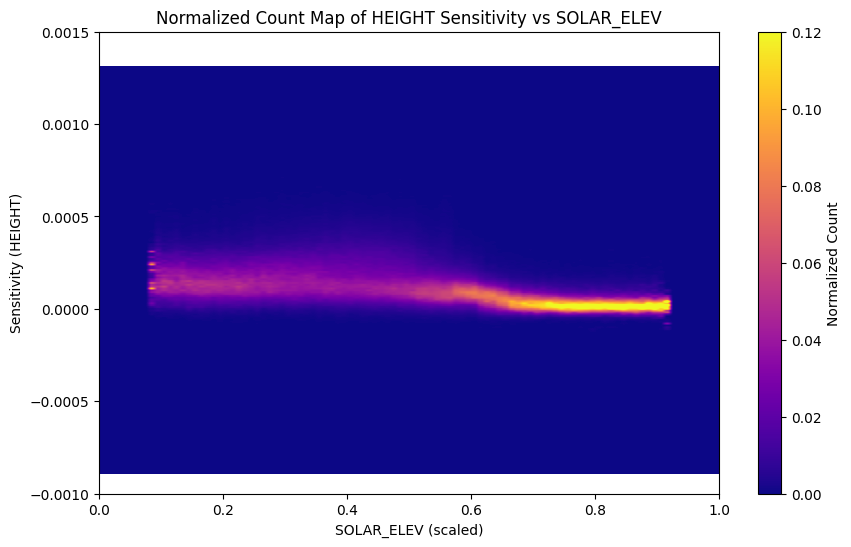

In [3]:
## Height vs SOLAR_ELEV ##
# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'SOLAR_ELEV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[13, 'min']
height_max = min_max_df.loc[13, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.00001

height_bins_13 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity across all batches
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins now that we know min/max
sens_bins_13 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators
heatmap_count_13 = np.zeros((len(height_bins_13) - 1, len(sens_bins_13) - 1))
height_bin_counts_13 = np.zeros(len(height_bins_13) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time() 
    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        chunk_counter += 1
        
        
        # Align the batches
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)  # Ensure within [0, 1]

        # 2D histogram accumulation
        hmap, _, _ = np.histogram2d(height_scaled, sensitivities, bins=[height_bins_13, sens_bins_13])
        hcount, _ = np.histogram(height_scaled, bins=height_bins_13)

        # Update accumulators
        heatmap_count_13 += hmap
        height_bin_counts_13 += hcount

        # Calculate time taken for this chunk
        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize
for i in range(len(height_bin_counts_13)):
    if height_bin_counts_13[i] > 0:
        heatmap_count_13[i, :] /= height_bin_counts_13[i]

# Plotting
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_13.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Normalized Count Map of {sensitivity_column} Sensitivity vs {corr_column}')
plt.grid(False)
plt.show()


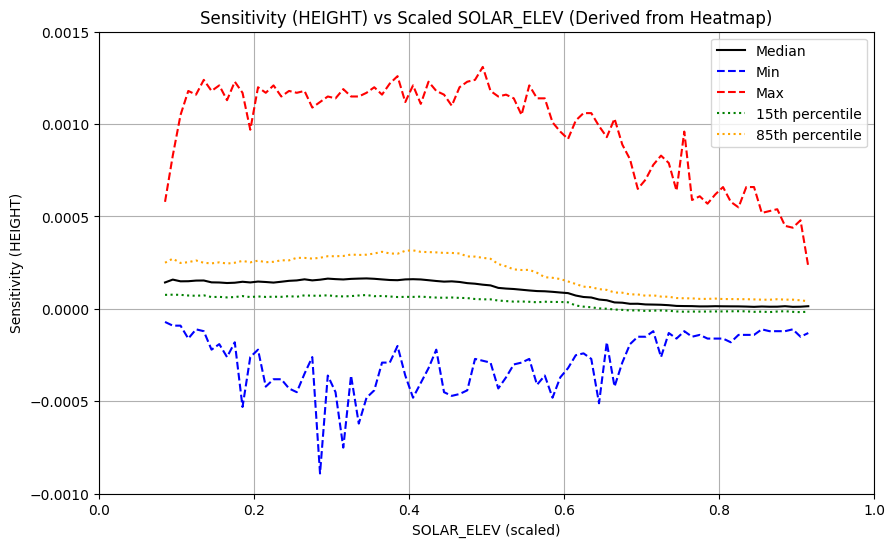

In [4]:

# Compute bin centers for HEIGHT and sensitivity
bin_centers_height = (height_bins_13[:-1] + height_bins_13[1:]) / 2
bin_centers_sens = (sens_bins_13[:-1] + sens_bins_13[1:]) / 2

# Prepare lists to store computed statistics
median_sens = []
min_sens = []
max_sens = []
p15_sens = []
p85_sens = []

# Compute statistics from the normalized histograms
for i in range(heatmap_count_13.shape[0]):
    counts = heatmap_count_13[i, :]
    
    if counts.sum() == 0:
        median_sens.append(np.nan)
        min_sens.append(np.nan)
        max_sens.append(np.nan)
        p15_sens.append(np.nan)
        p85_sens.append(np.nan)
        continue

    cdf = np.cumsum(counts)
    cdf = cdf / cdf[-1]  # Normalize to [0, 1]
    
    # Get interpolated values at desired percentiles
    median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
    p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
    p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

    # Min/max from non-zero counts
    nonzero_idx = np.where(counts > 0)[0]
    min_sens.append(bin_centers_sens[nonzero_idx[0]])
    max_sens.append(bin_centers_sens[nonzero_idx[-1]])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_sens, label='Median', color='black')
plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0,1)
plt.ylim(-0.001, 0.0015)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} (Derived from Heatmap)')
plt.legend()
plt.grid(True)
plt.show()


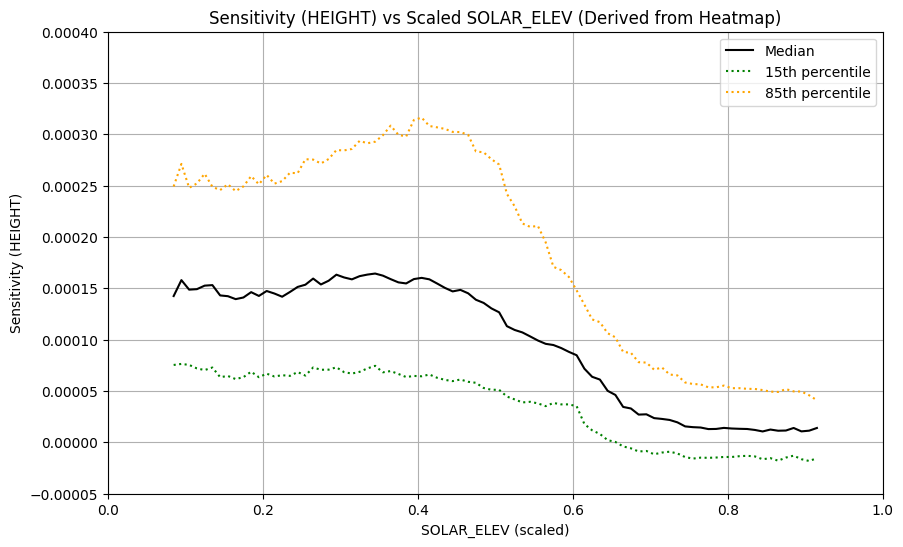

In [6]:
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_sens, label='Median', color='black')
#plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
#plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0,1)
plt.ylim(-0.00005, 0.0004)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} (Derived from Heatmap)')
plt.legend()
plt.grid(True)
plt.show()


Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


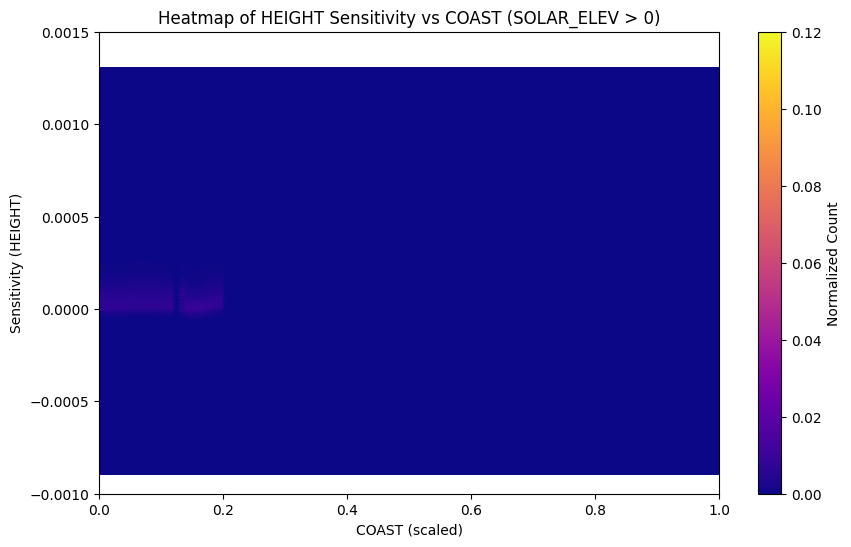

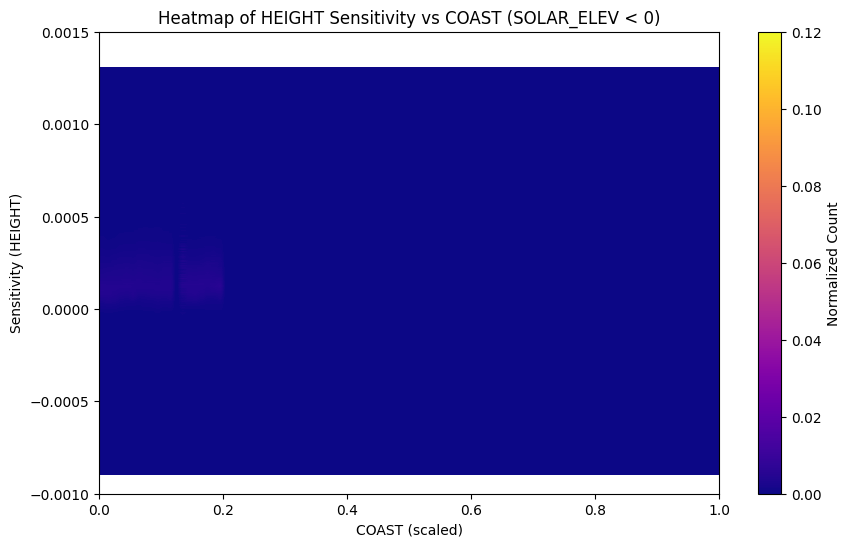

In [13]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'COAST'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[1, 'min']
height_max = min_max_df.loc[1, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


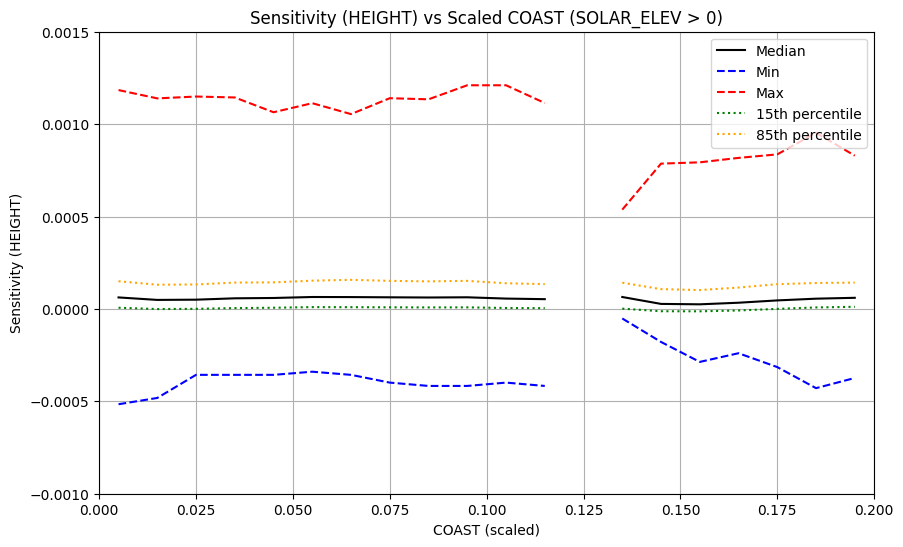

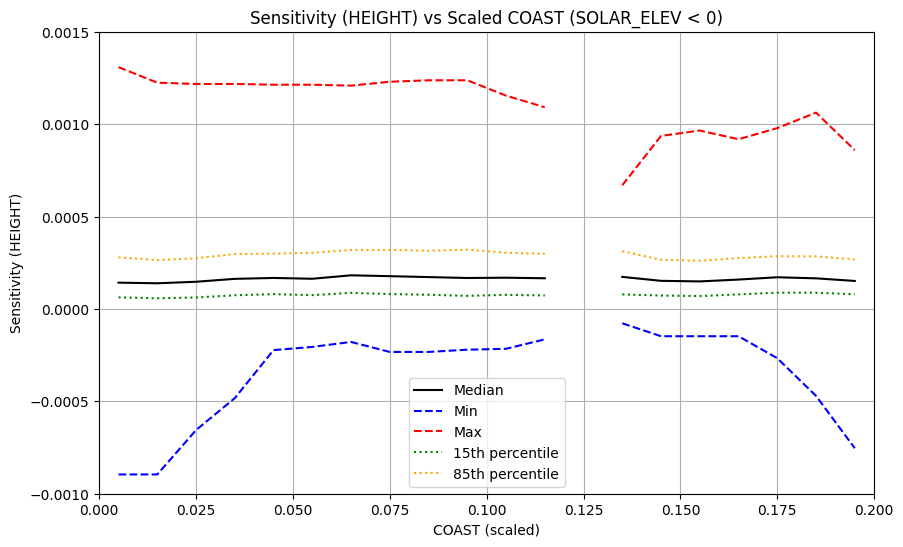

In [14]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 0.2)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


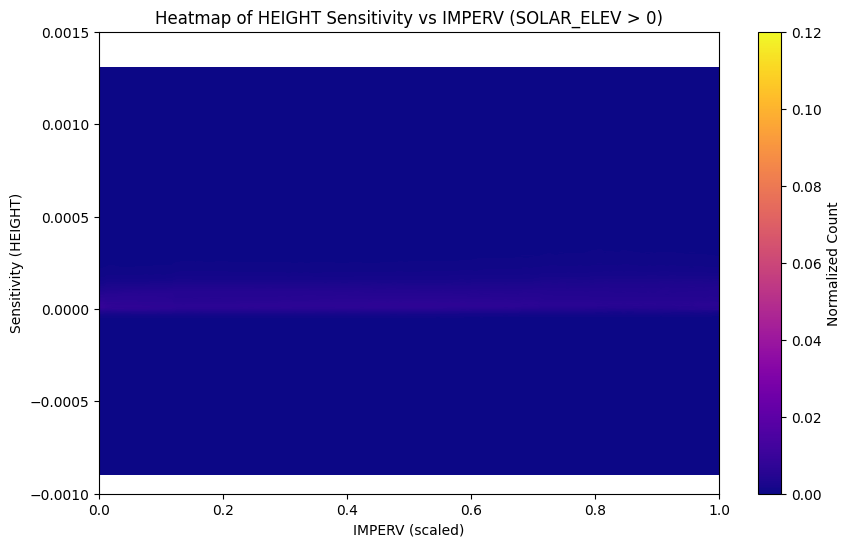

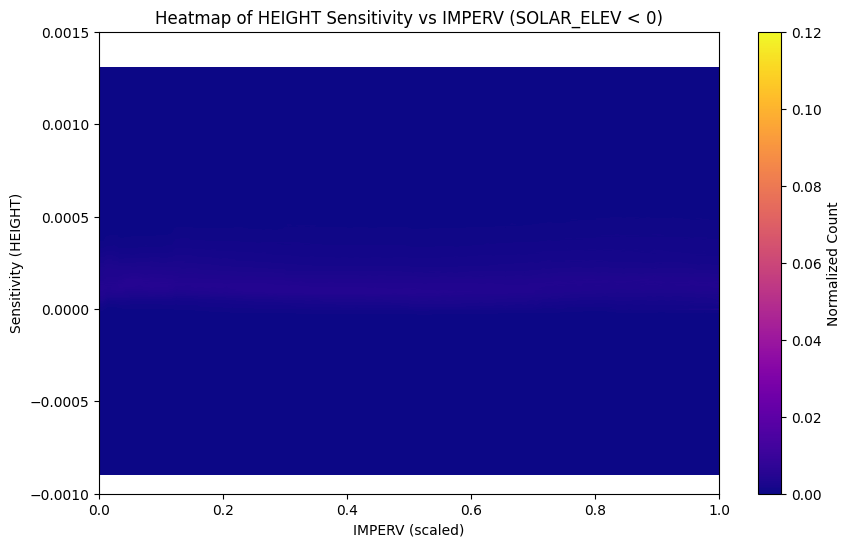

In [15]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'IMPERV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[2, 'min']
height_max = min_max_df.loc[2, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


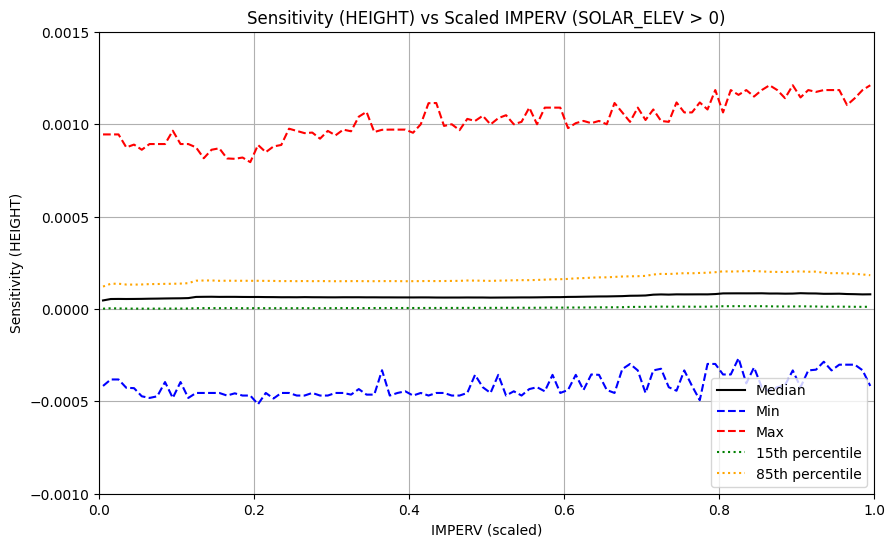

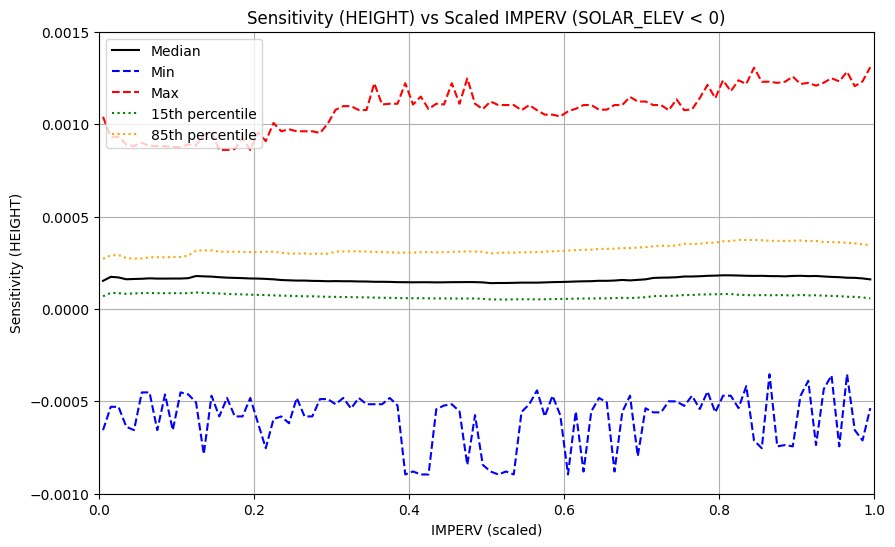

In [16]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


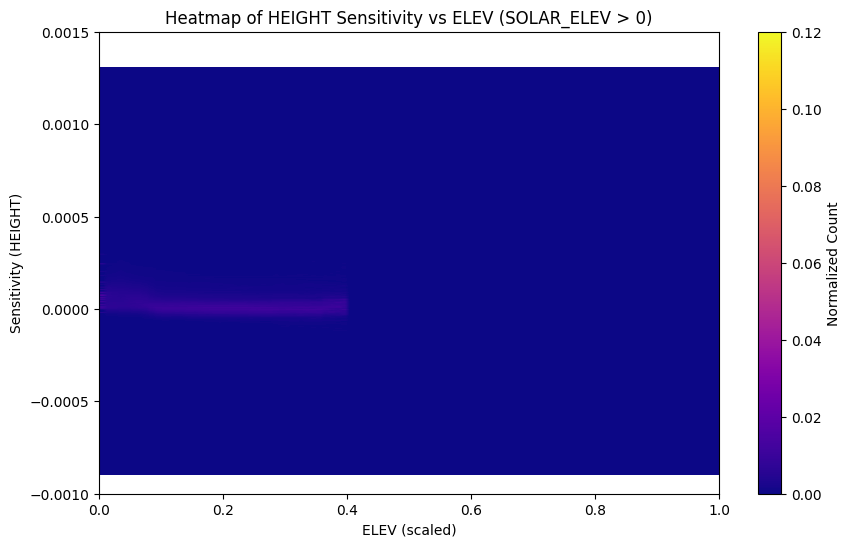

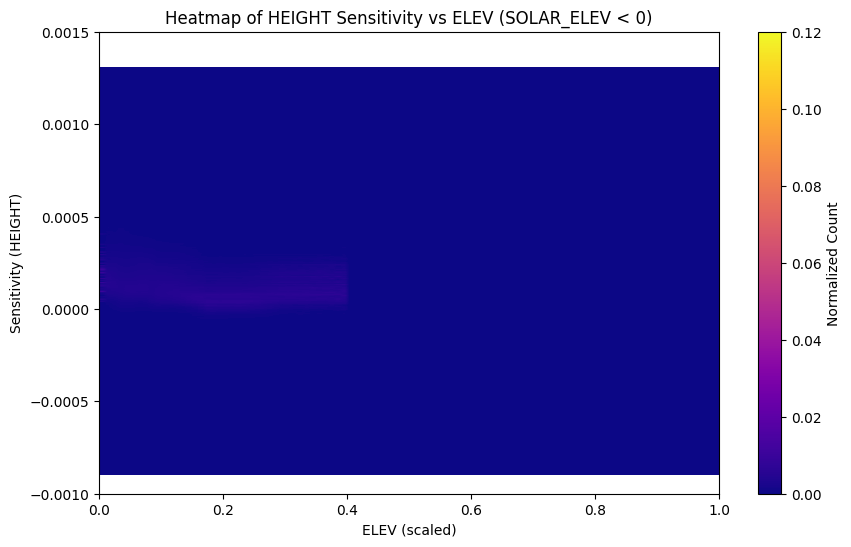

In [17]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'ELEV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[3, 'min']
height_max = min_max_df.loc[3, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


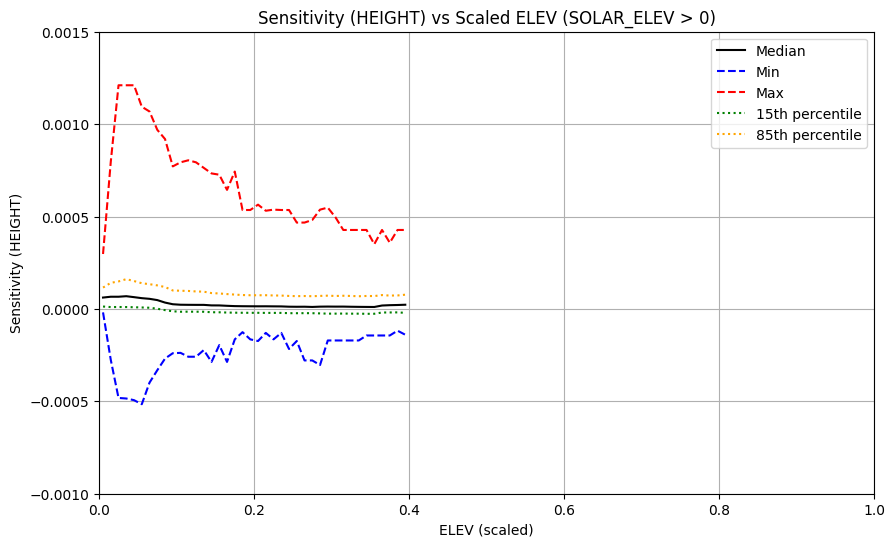

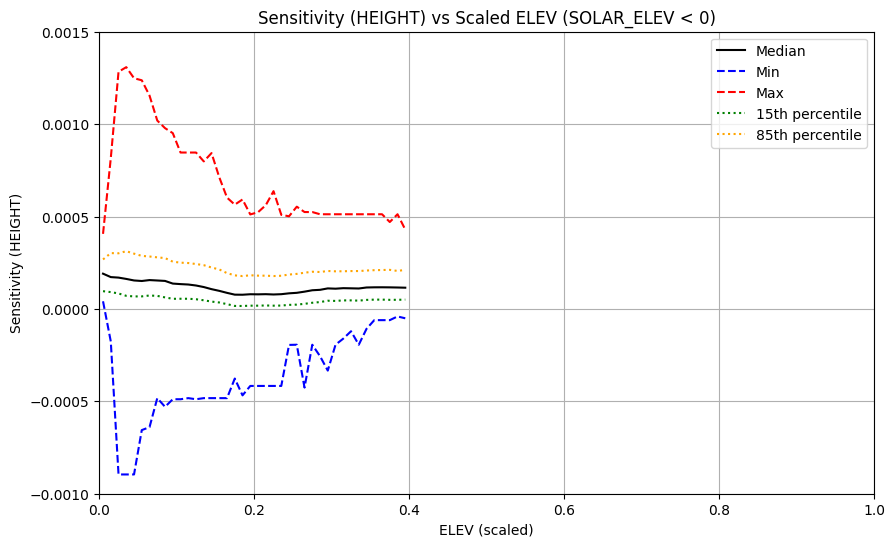

In [18]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


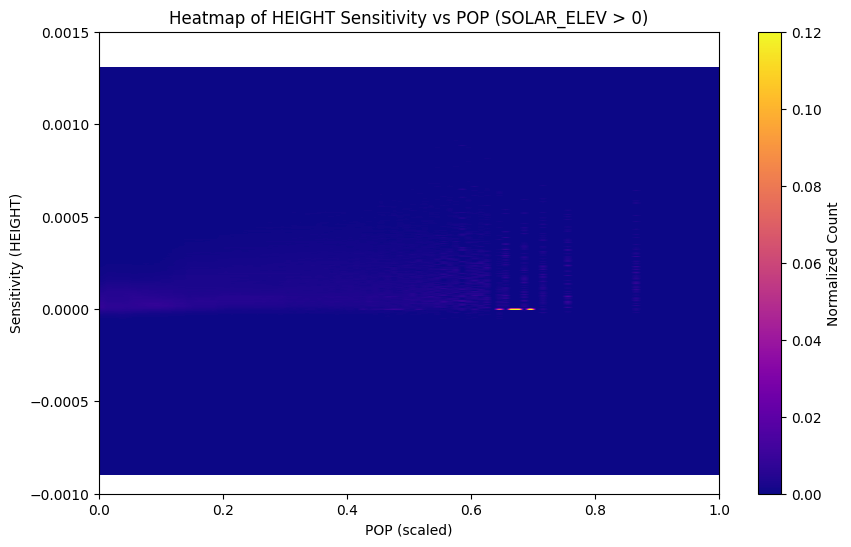

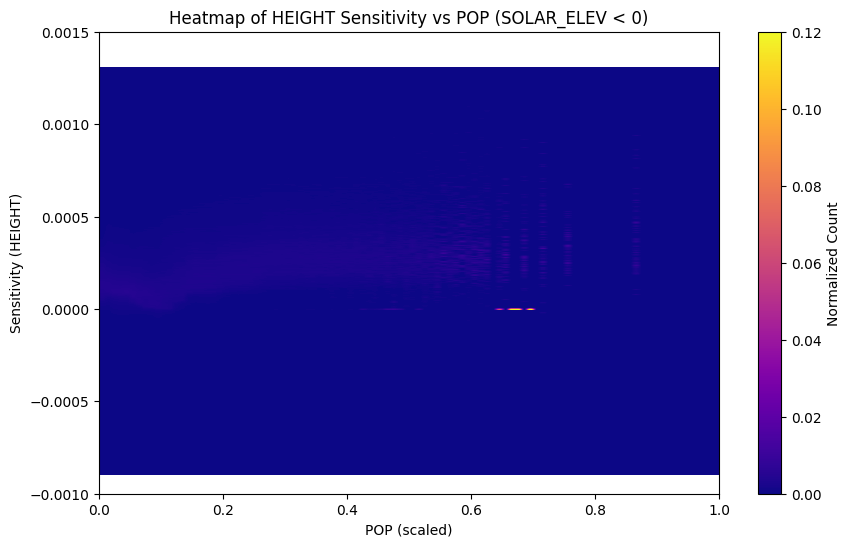

In [19]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'POP'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[4, 'min']
height_max = min_max_df.loc[4, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


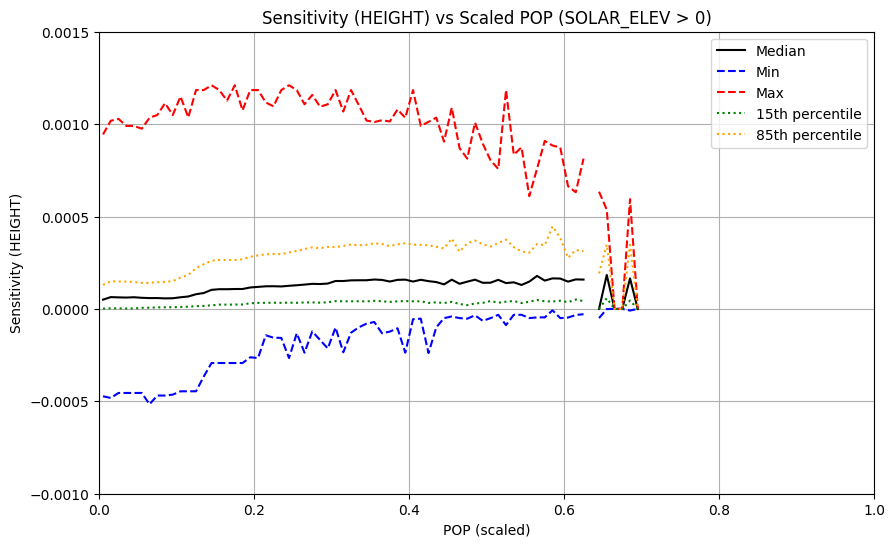

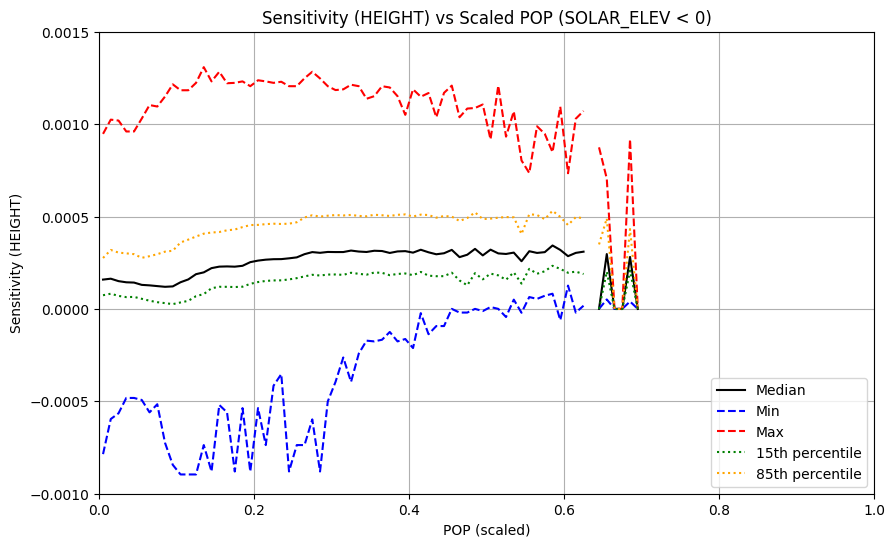

In [20]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 3.42 seconds.
Processed TRAIN chunk 2 in 3.44 seconds.
Processed TRAIN chunk 3 in 3.44 seconds.
Processed TRAIN chunk 4 in 3.41 seconds.
Processed TRAIN chunk 5 in 3.46 seconds.
Processed TRAIN chunk 6 in 3.40 seconds.
Processed TRAIN chunk 7 in 3.41 seconds.
Processed TRAIN chunk 8 in 3.39 seconds.
Processed TRAIN chunk 9 in 3.42 seconds.
Processed TRAIN chunk 10 in 3.38 seconds.
Processed TRAIN chunk 11 in 3.38 seconds.
Processed TRAIN chunk 12 in 3.38 seconds.
Processed TRAIN chunk 13 in 3.43 seconds.
Processed TRAIN chunk 14 in 3.44 seconds.
Processed TRAIN chunk 15 in 3.48 seconds.
Processed TRAIN chunk 16 in 3.43 seconds.
Processed TRAIN chunk 17 in 3.42 seconds.
Processed TRAIN chunk 18 in 3.40 seconds.
Processed TRAIN chunk 19 in 3.48 seconds.
Processed TRAIN chunk 20 in 3.43 seconds.
Processed TRAIN chunk 21 in 3.40 seconds.
Processed TRAIN chunk 22 in 3.43 seconds.
Processed TRAIN chunk 23 in 3.44 seconds.
P

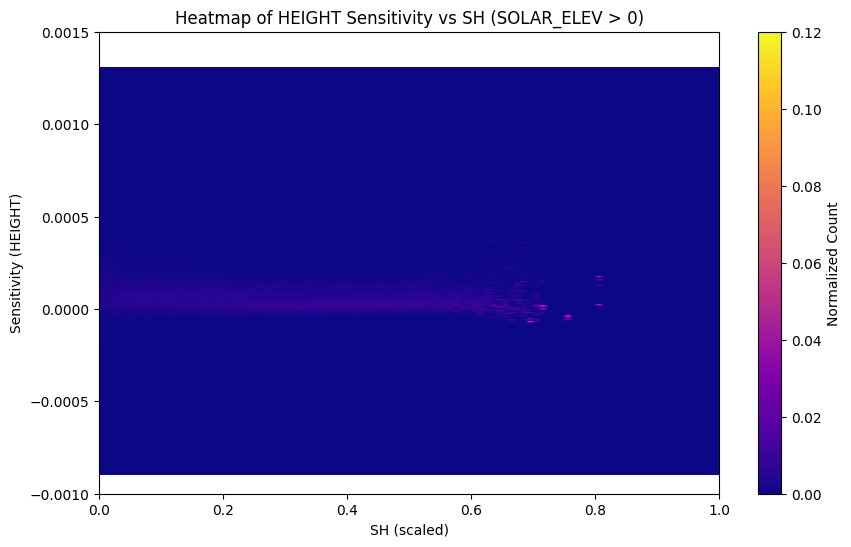

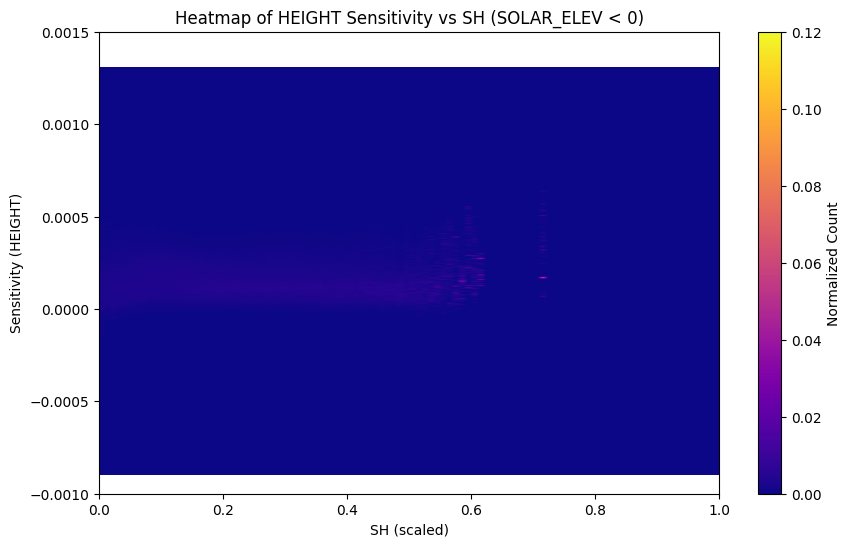

In [22]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'SH'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = 0.0007270362004324
height_max = 0.0232567166249862

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    SH_file = f'data/CLUSTER3_{part}_SH.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    SH_iter = pd.read_csv(SH_file, usecols=[corr_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['SOLAR_ELEV'], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time()
    for dds_chunk, cities_chunk, SH_chunk in zip(dds_iter, cities_iter, SH_iter):
        chunk_counter += 1

        # Extract columns
        sensitivities = dds_chunk[sensitivity_column].values
        pops = SH_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values


        # Apply masks for day and night
        mask_pos = (solar_elev > 0) 
        mask_neg = (solar_elev < 0) 

        for mask, heatmap_count, height_bin_counts in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0)
        ]:
            if not np.any(mask):
                continue  # Skip if no data in this condition

            sens_filtered = sensitivities[mask]
            pop_filtered = pops[mask]

            # Scale POP
            pop_scaled = (pop_filtered - height_min) / (height_max - height_min)
            pop_scaled = np.clip(pop_scaled, 0, 1)

            # 2D histogram accumulation
            hmap, _, _ = np.histogram2d(pop_scaled, sens_filtered, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(pop_scaled, bins=height_bins_pop_0)

            heatmap_count += hmap
            height_bin_counts += hcount

        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


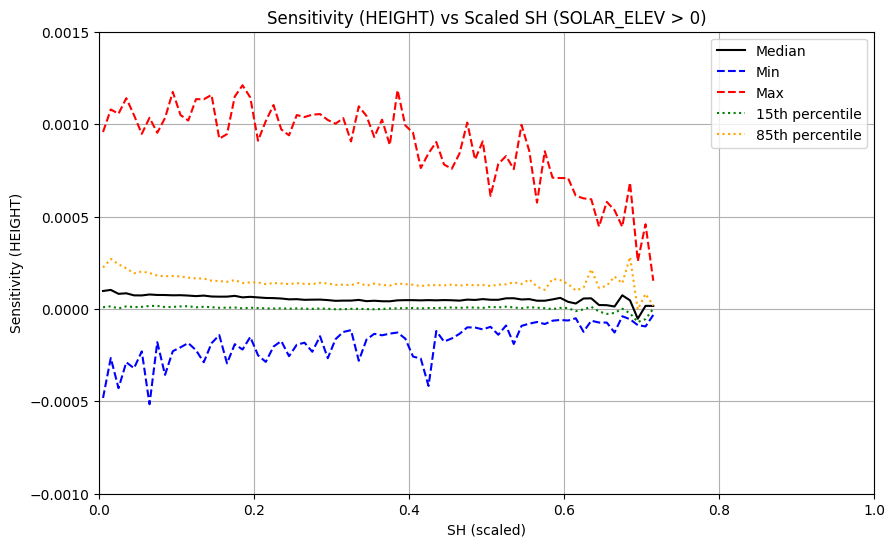

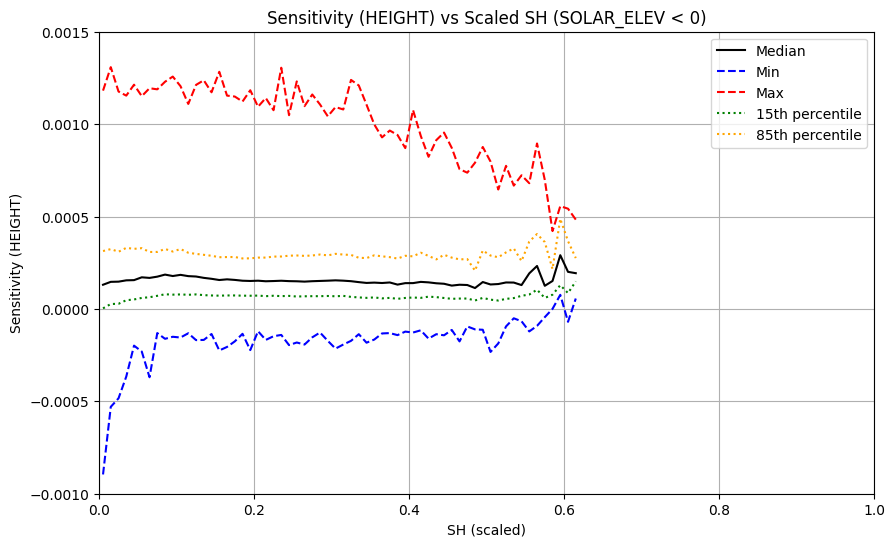

In [23]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


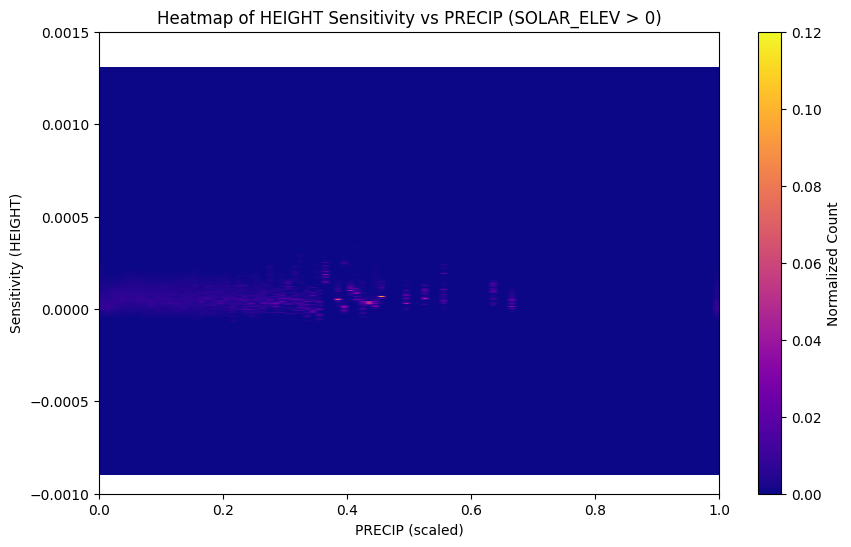

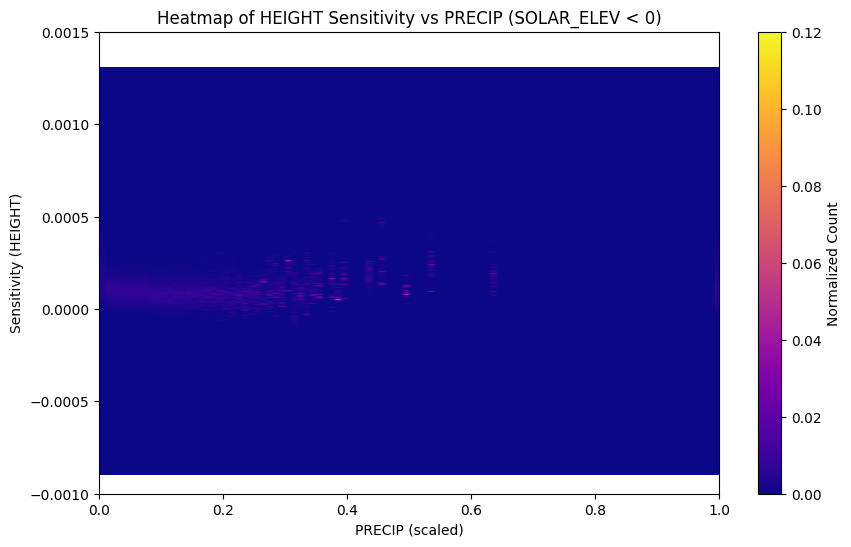

In [24]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'PRECIP'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[7, 'min']
height_max = min_max_df.loc[7, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


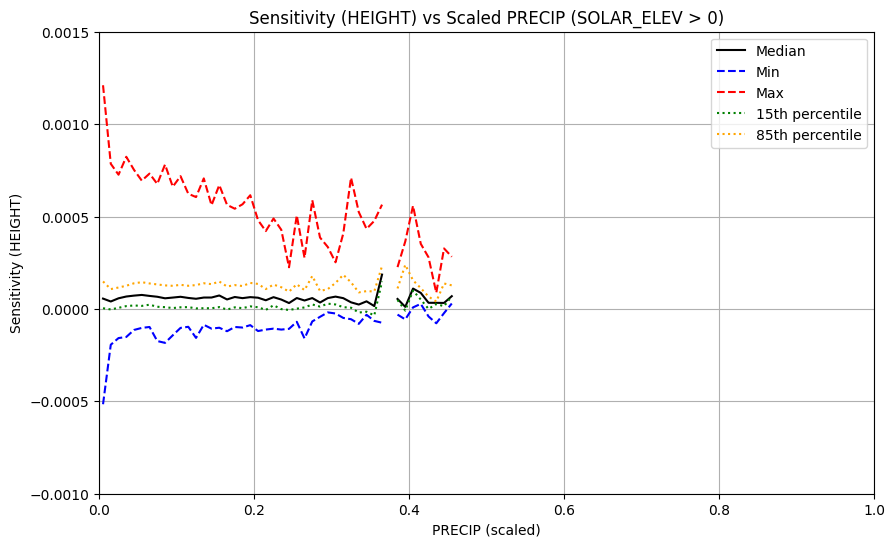

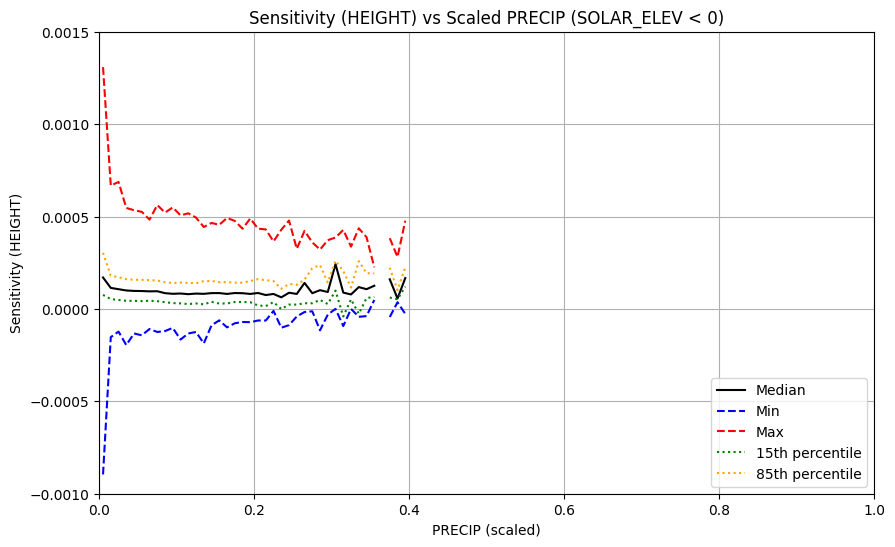

In [25]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


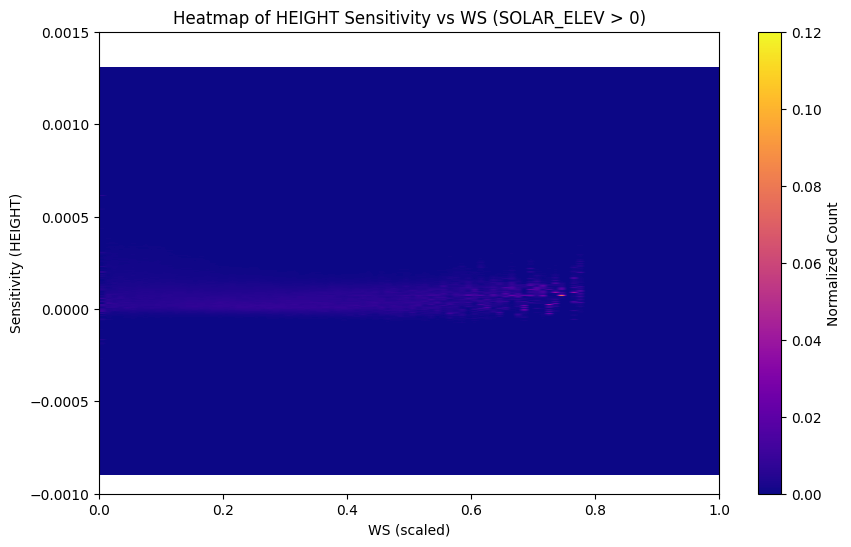

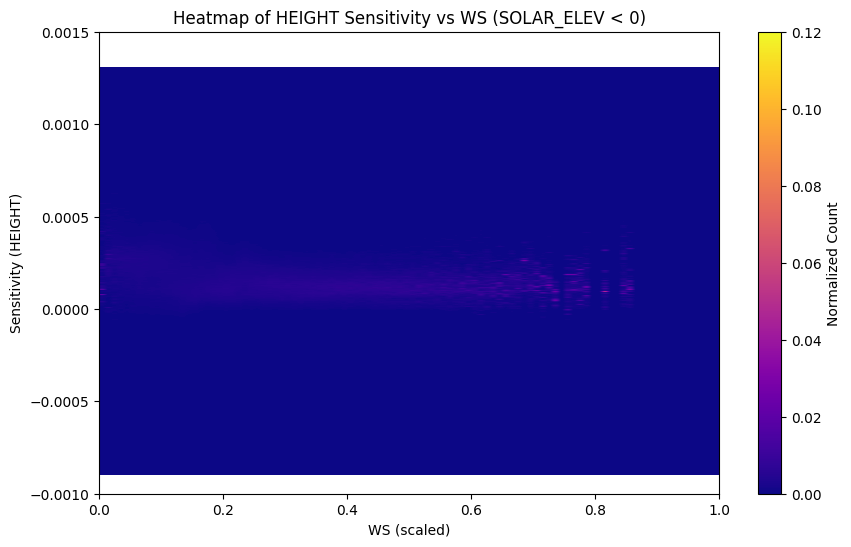

In [26]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'WS'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[8, 'min']
height_max = min_max_df.loc[8, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


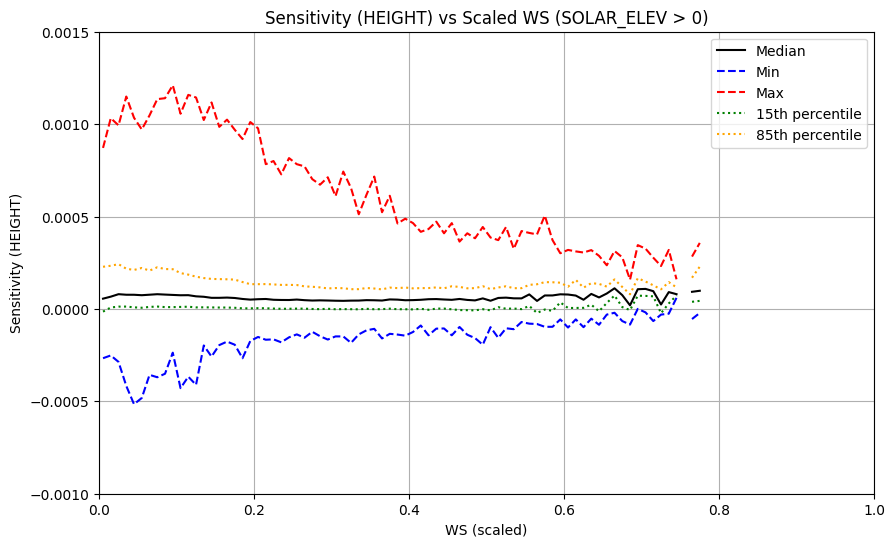

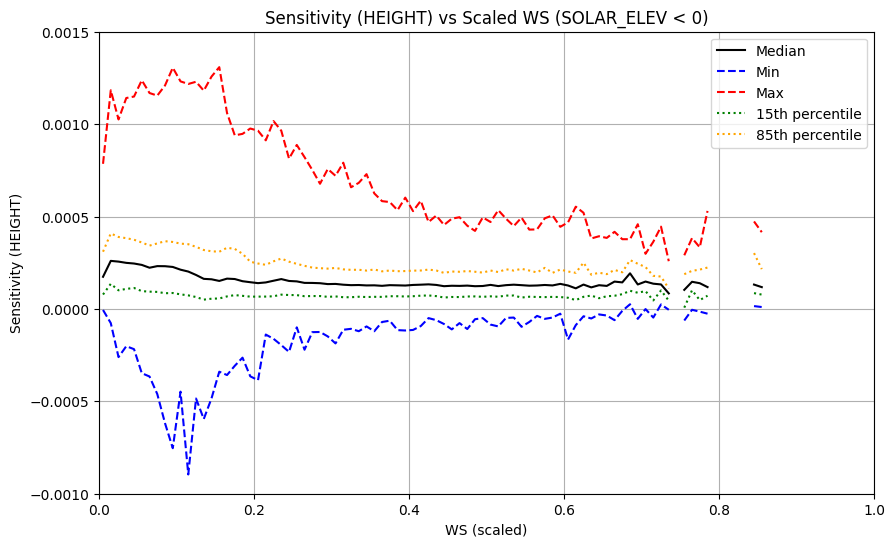

In [27]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


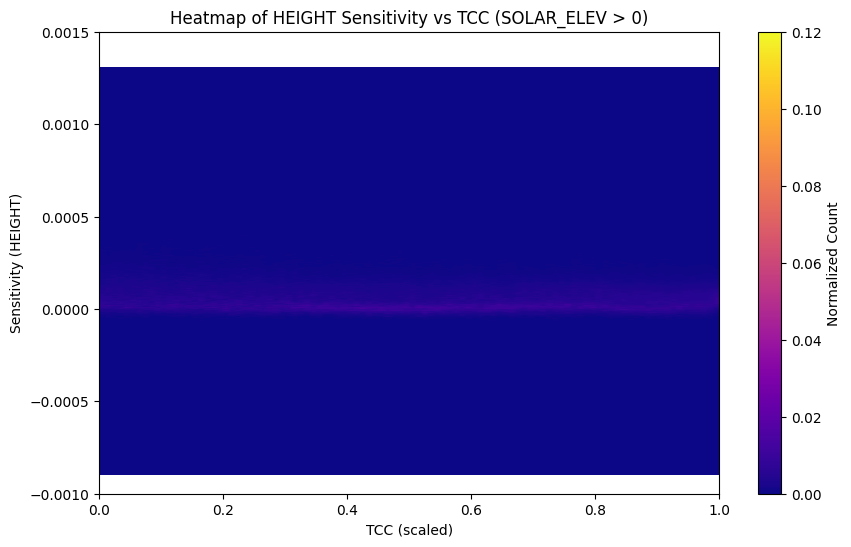

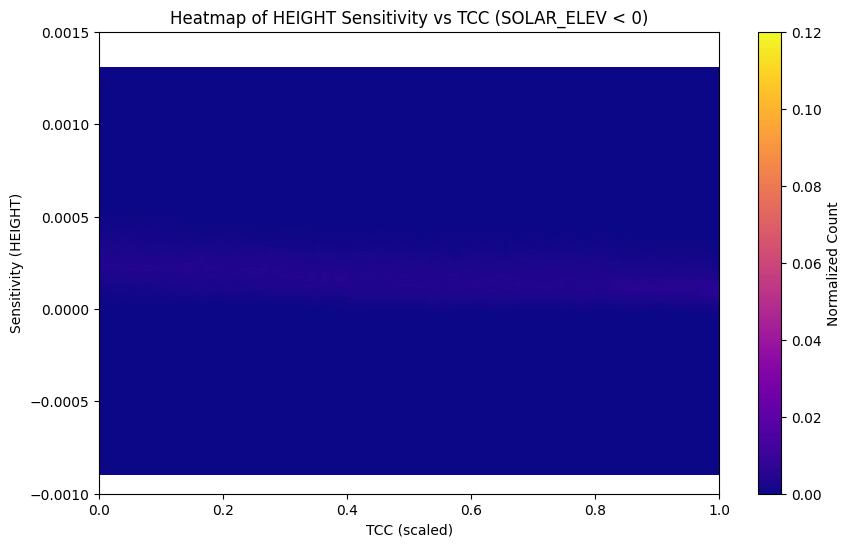

In [28]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'TCC'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[10, 'min']
height_max = min_max_df.loc[10, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


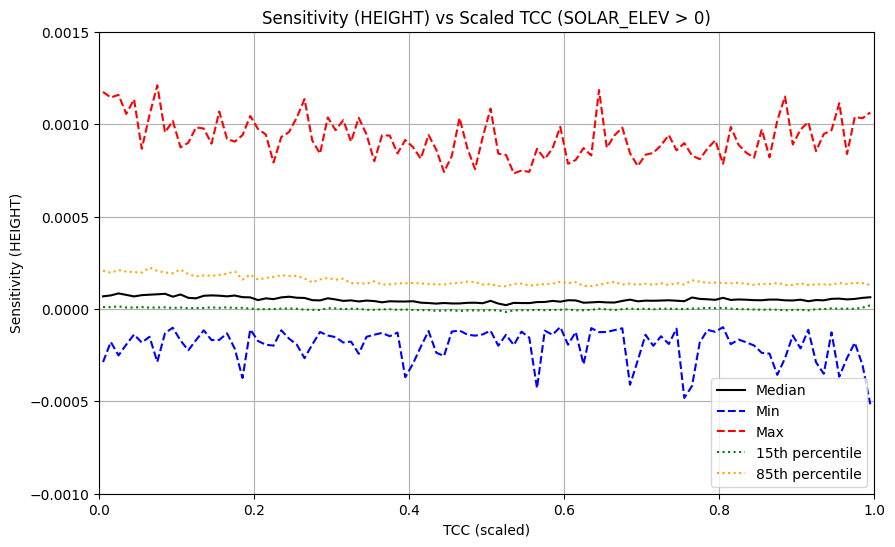

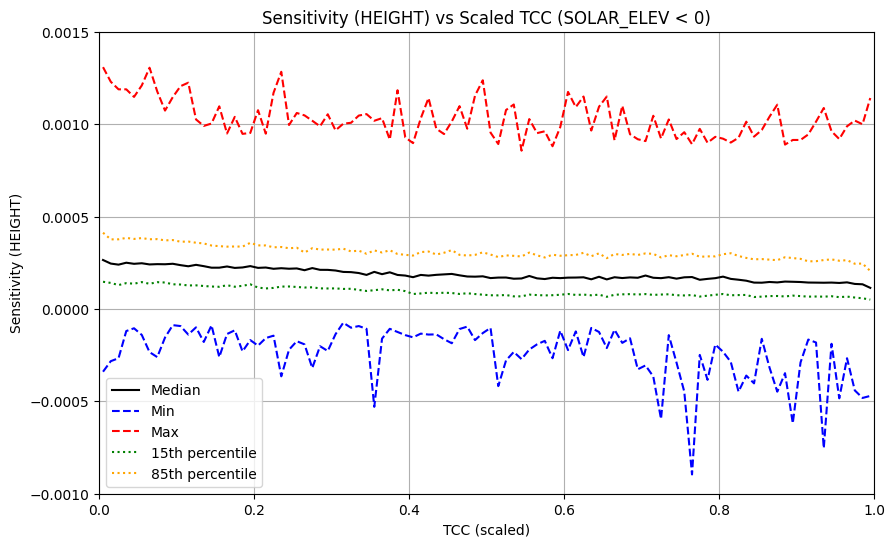

In [29]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


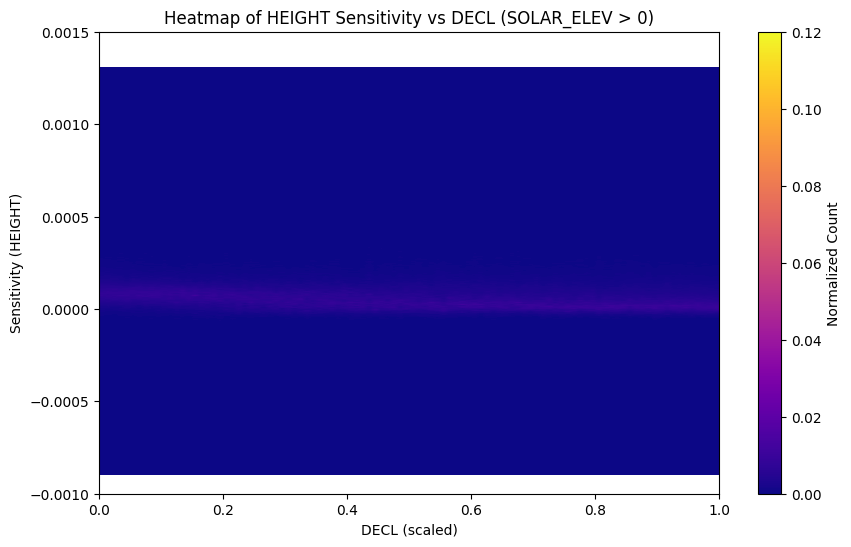

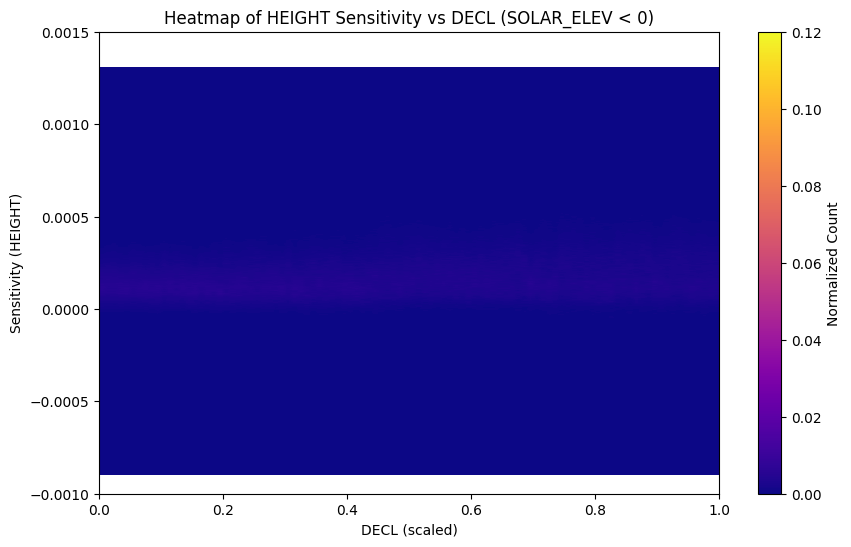

In [30]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'DECL'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[14, 'min']
height_max = min_max_df.loc[14, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


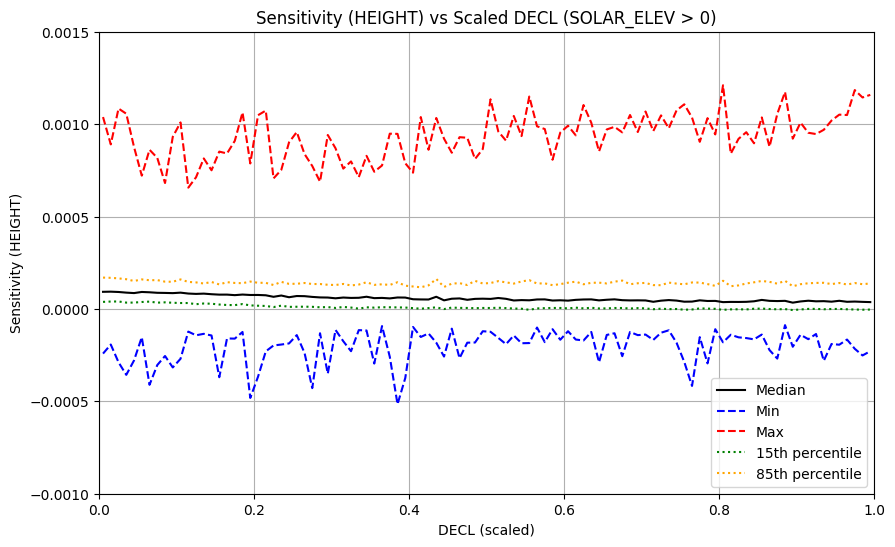

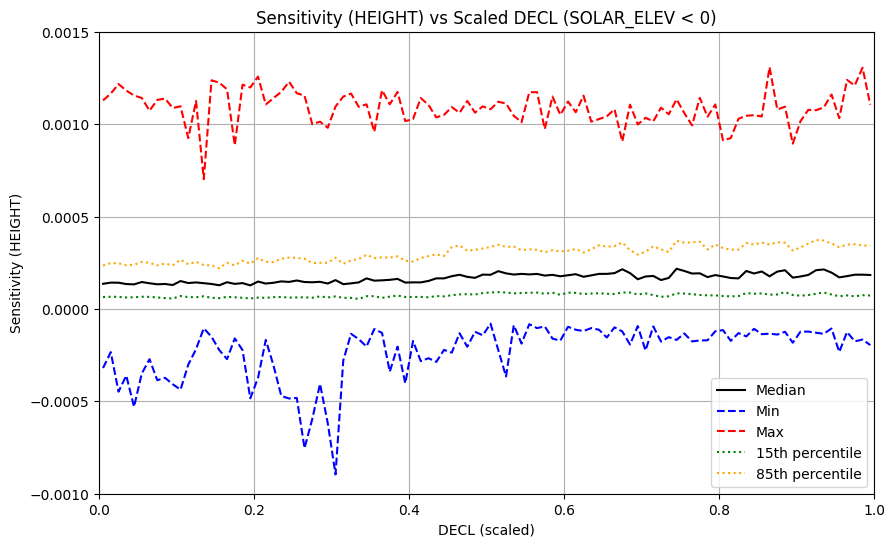

In [31]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 3.14 seconds.
Processed TRAIN chunk 2 in 3.20 seconds.
Processed TRAIN chunk 3 in 3.56 seconds.
Processed TRAIN chunk 4 in 3.48 seconds.
Processed TRAIN chunk 5 in 3.32 seconds.
Processed TRAIN chunk 6 in 3.59 seconds.
Processed TRAIN chunk 7 in 3.31 seconds.
Processed TRAIN chunk 8 in 3.38 seconds.
Processed TRAIN chunk 9 in 3.40 seconds.
Processed TRAIN chunk 10 in 3.30 seconds.
Processed TRAIN chunk 11 in 3.32 seconds.
Processed TRAIN chunk 12 in 3.46 seconds.
Processed TRAIN chunk 13 in 3.50 seconds.
Processed TRAIN chunk 14 in 3.35 seconds.
Processed TRAIN chunk 15 in 3.22 seconds.
Processed TRAIN chunk 16 in 3.26 seconds.
Processed TRAIN chunk 17 in 3.23 seconds.
Processed TRAIN chunk 18 in 3.41 seconds.
Processed TRAIN chunk 19 in 3.49 seconds.
Processed TRAIN chunk 20 in 3.44 seconds.
Processed TRAIN chunk 21 in 3.62 seconds.
Processed TRAIN chunk 22 in 3.32 seconds.
Processed TRAIN chunk 23 in 3.51 seconds.
P

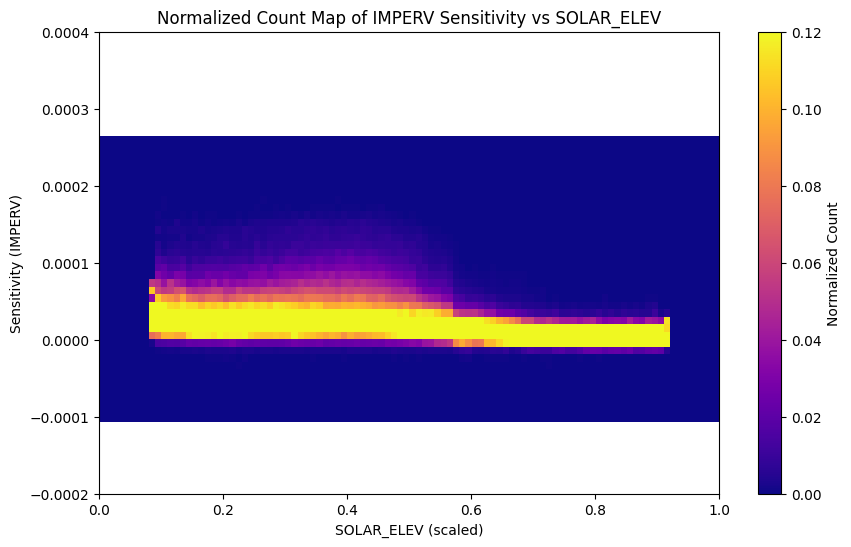

In [32]:
## Height vs SOLAR_ELEV ##
# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'SOLAR_ELEV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[13, 'min']
height_max = min_max_df.loc[13, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.00001

height_bins_13 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity across all batches
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins now that we know min/max
sens_bins_13 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators
heatmap_count_13 = np.zeros((len(height_bins_13) - 1, len(sens_bins_13) - 1))
height_bin_counts_13 = np.zeros(len(height_bins_13) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time() 
    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        chunk_counter += 1
        
        
        # Align the batches
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)  # Ensure within [0, 1]

        # 2D histogram accumulation
        hmap, _, _ = np.histogram2d(height_scaled, sensitivities, bins=[height_bins_13, sens_bins_13])
        hcount, _ = np.histogram(height_scaled, bins=height_bins_13)

        # Update accumulators
        heatmap_count_13 += hmap
        height_bin_counts_13 += hcount

        # Calculate time taken for this chunk
        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize
for i in range(len(height_bin_counts_13)):
    if height_bin_counts_13[i] > 0:
        heatmap_count_13[i, :] /= height_bin_counts_13[i]

# Plotting
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_13.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Normalized Count Map of {sensitivity_column} Sensitivity vs {corr_column}')
plt.grid(False)
plt.show()


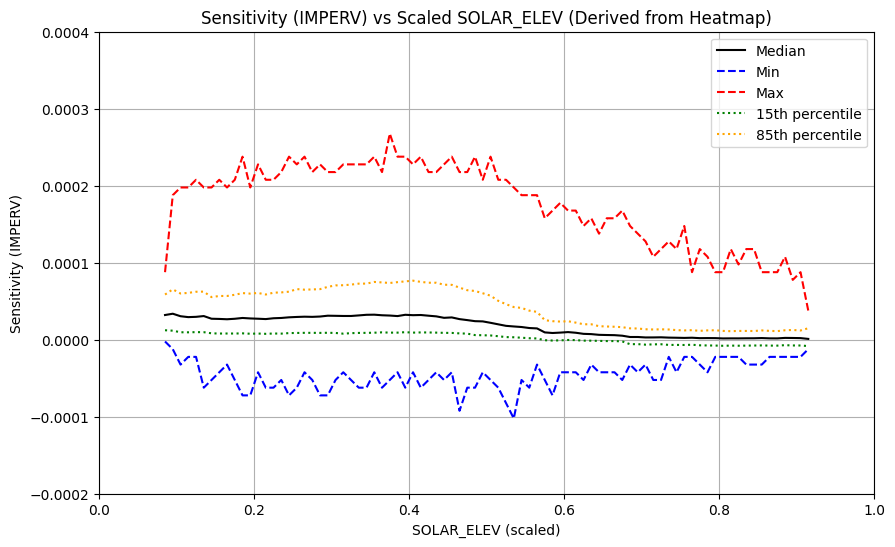

In [33]:

# Compute bin centers for HEIGHT and sensitivity
bin_centers_height = (height_bins_13[:-1] + height_bins_13[1:]) / 2
bin_centers_sens = (sens_bins_13[:-1] + sens_bins_13[1:]) / 2

# Prepare lists to store computed statistics
median_sens = []
min_sens = []
max_sens = []
p15_sens = []
p85_sens = []

# Compute statistics from the normalized histograms
for i in range(heatmap_count_13.shape[0]):
    counts = heatmap_count_13[i, :]
    
    if counts.sum() == 0:
        median_sens.append(np.nan)
        min_sens.append(np.nan)
        max_sens.append(np.nan)
        p15_sens.append(np.nan)
        p85_sens.append(np.nan)
        continue

    cdf = np.cumsum(counts)
    cdf = cdf / cdf[-1]  # Normalize to [0, 1]
    
    # Get interpolated values at desired percentiles
    median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
    p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
    p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

    # Min/max from non-zero counts
    nonzero_idx = np.where(counts > 0)[0]
    min_sens.append(bin_centers_sens[nonzero_idx[0]])
    max_sens.append(bin_centers_sens[nonzero_idx[-1]])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_sens, label='Median', color='black')
plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0,1)
plt.ylim(-0.0002, 0.0004)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} (Derived from Heatmap)')
plt.legend()
plt.grid(True)
plt.show()



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


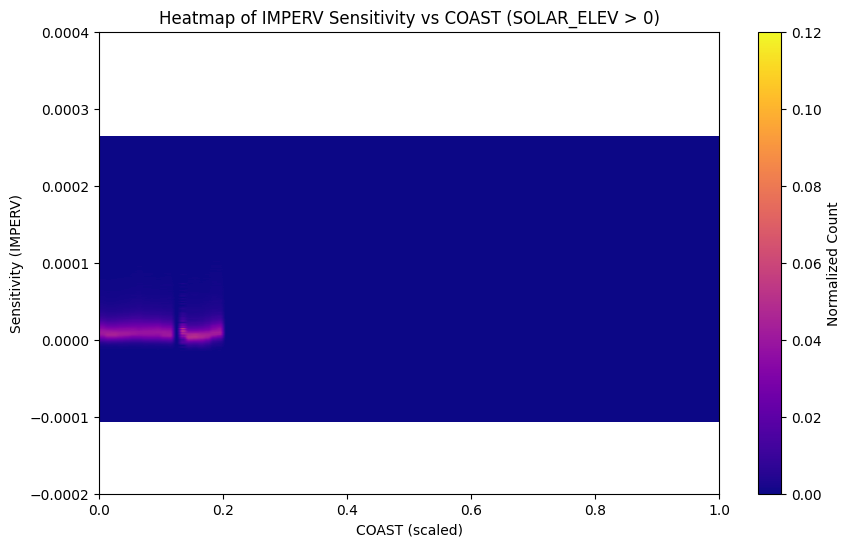

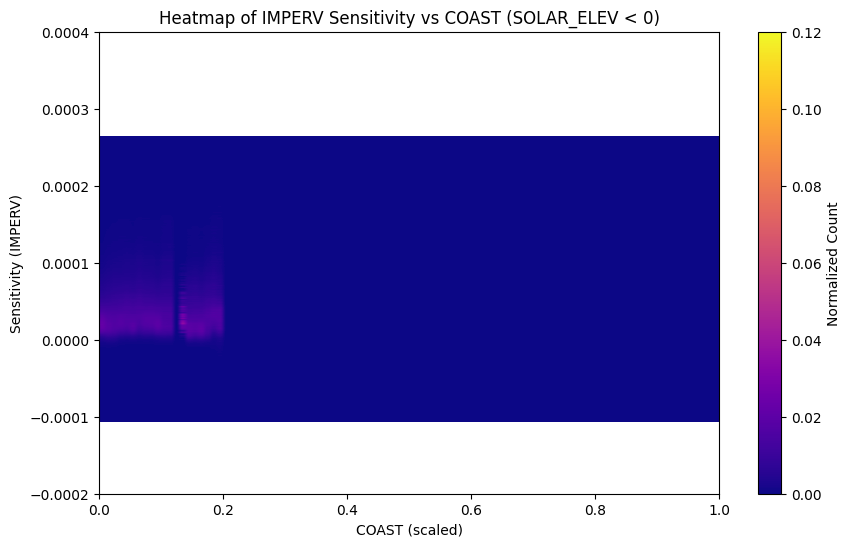

In [34]:
## IMPERV vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'COAST'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[1, 'min']
height_max = min_max_df.loc[1, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


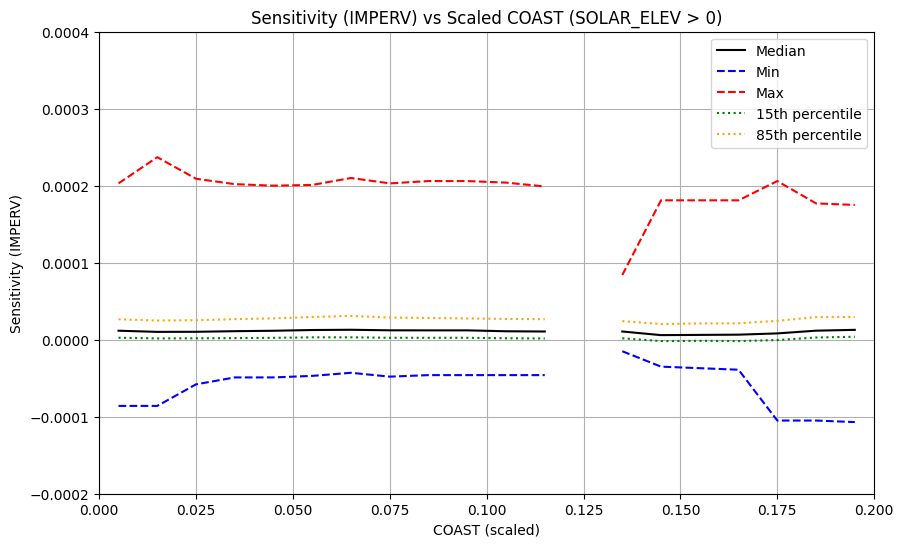

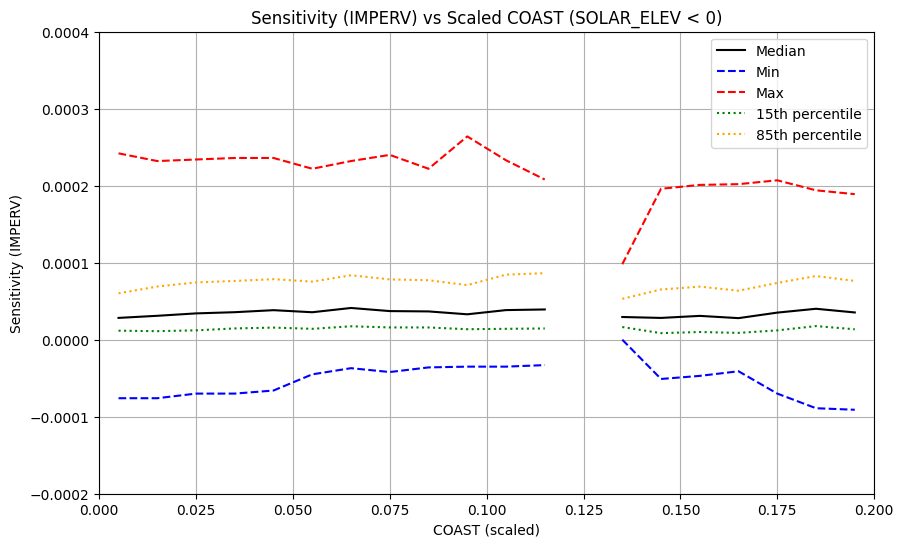

In [35]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 0.2)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


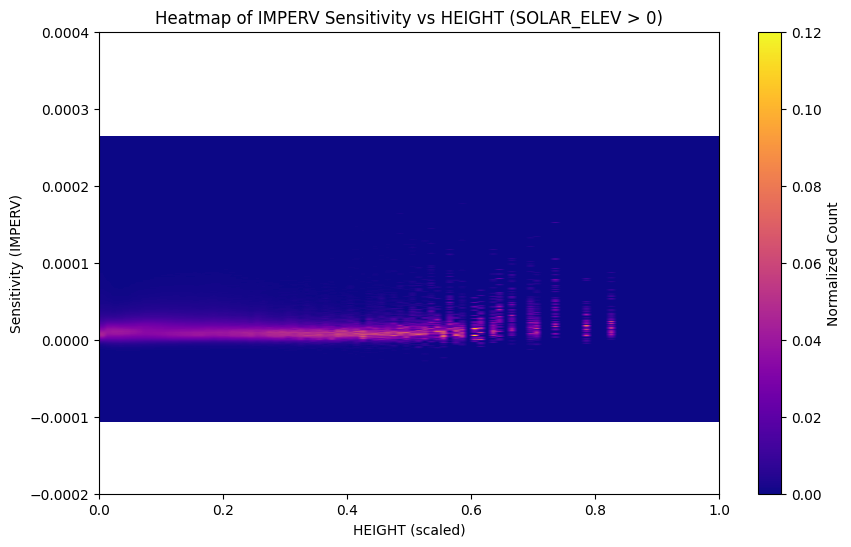

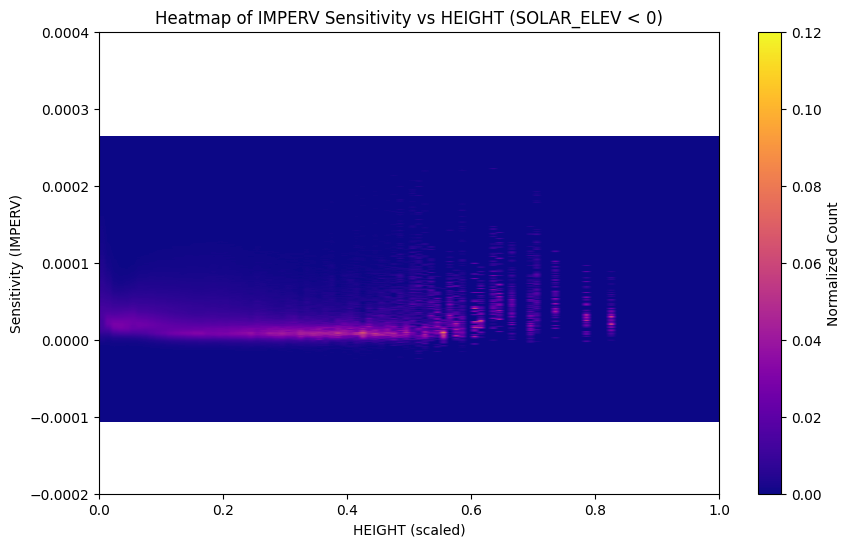

In [36]:
## IMPERV vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'HEIGHT'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[0, 'min']
height_max = min_max_df.loc[0, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


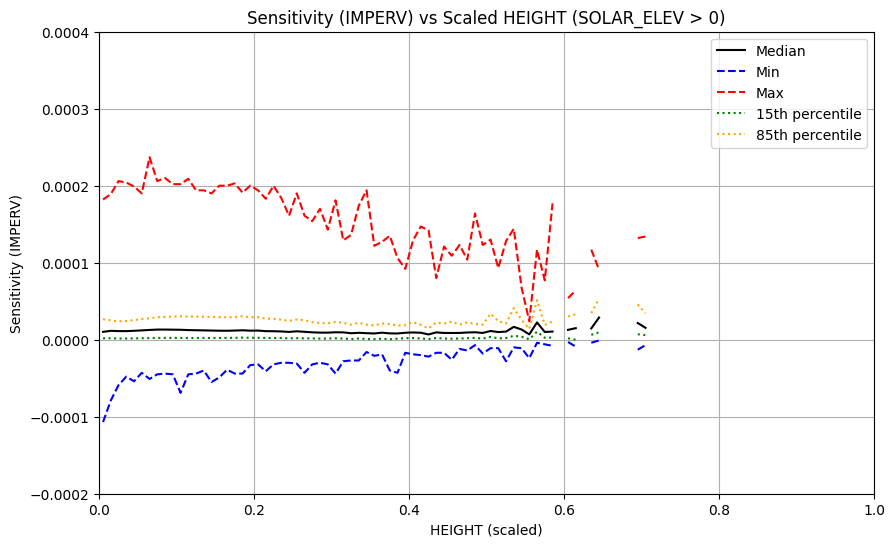

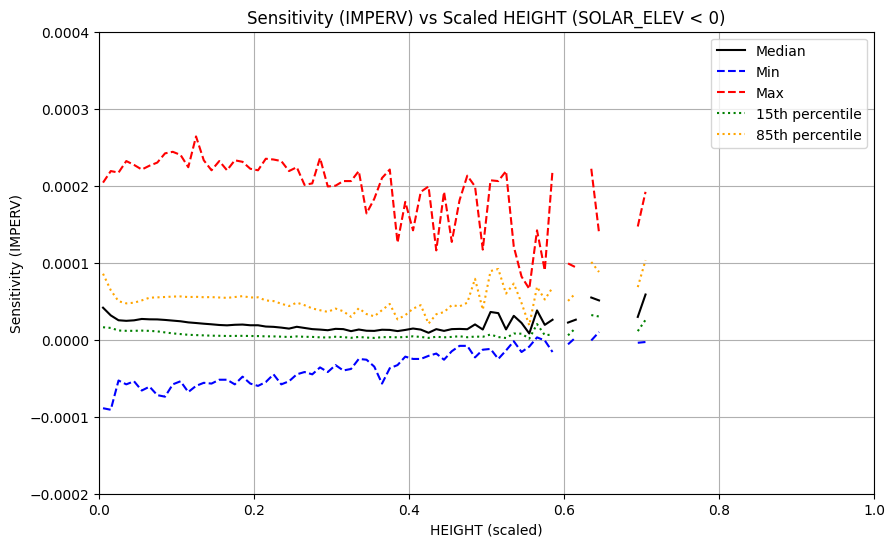

In [37]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


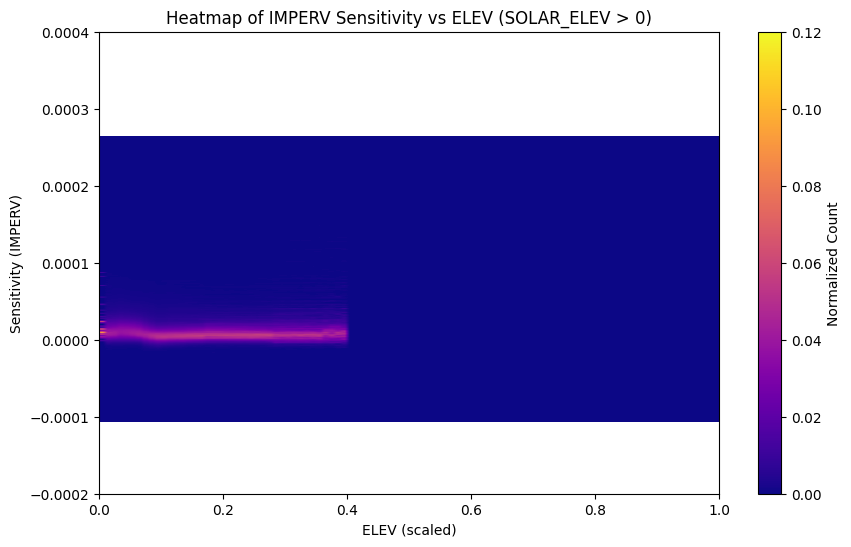

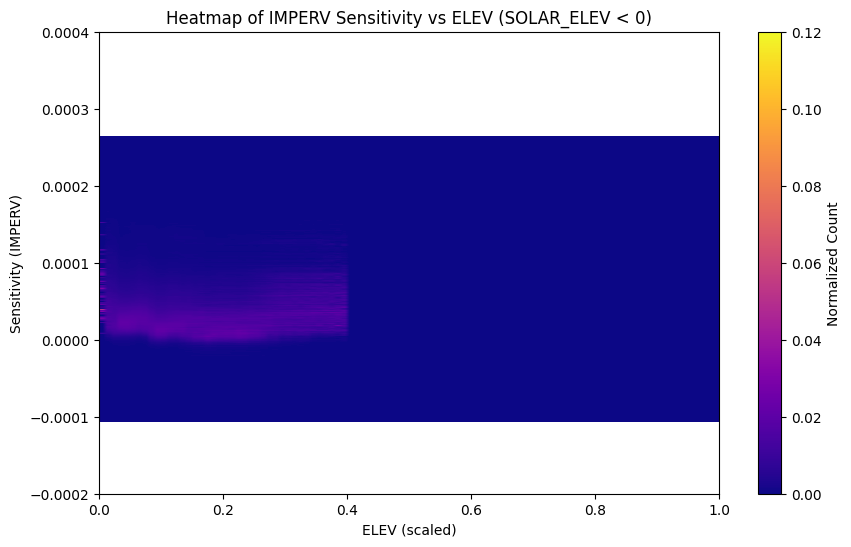

In [38]:
## IMPERV vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'ELEV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[3, 'min']
height_max = min_max_df.loc[3, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


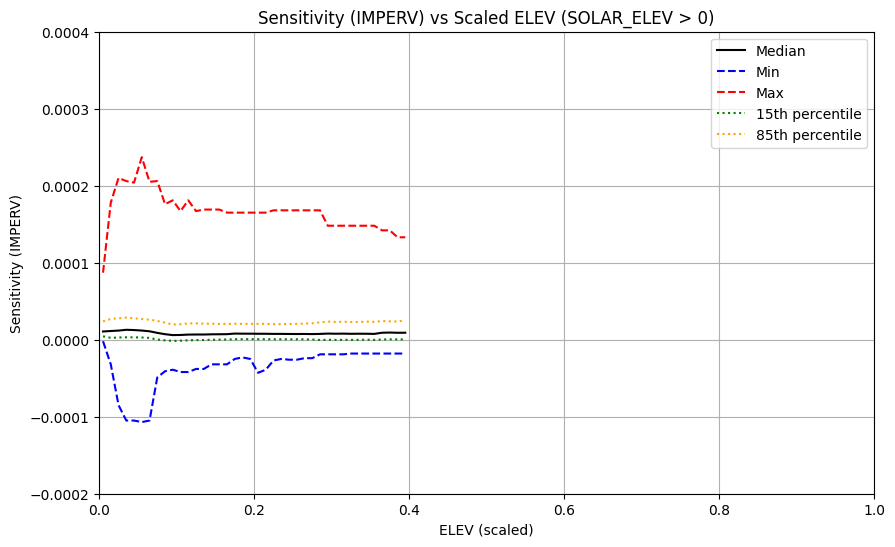

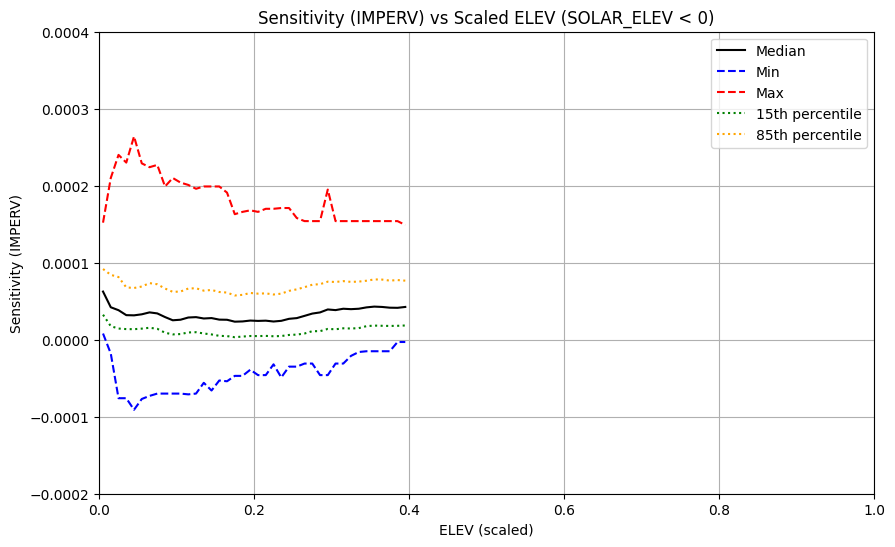

In [39]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


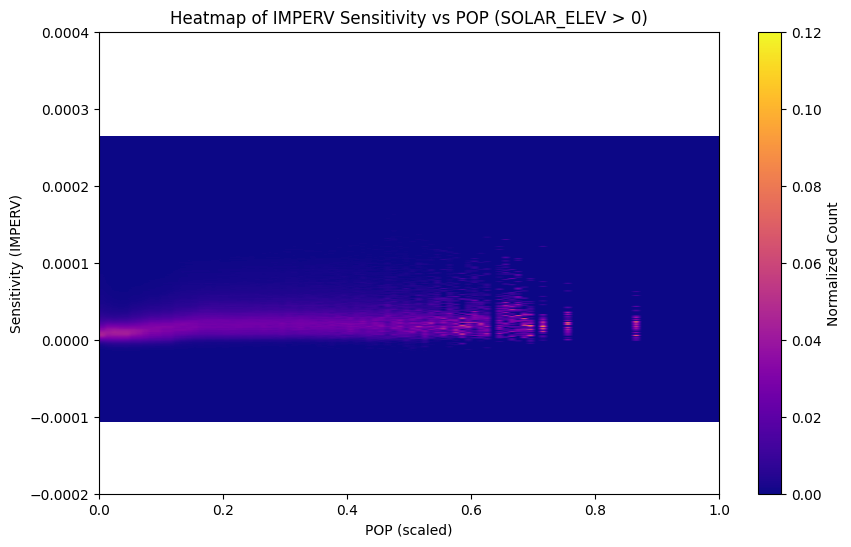

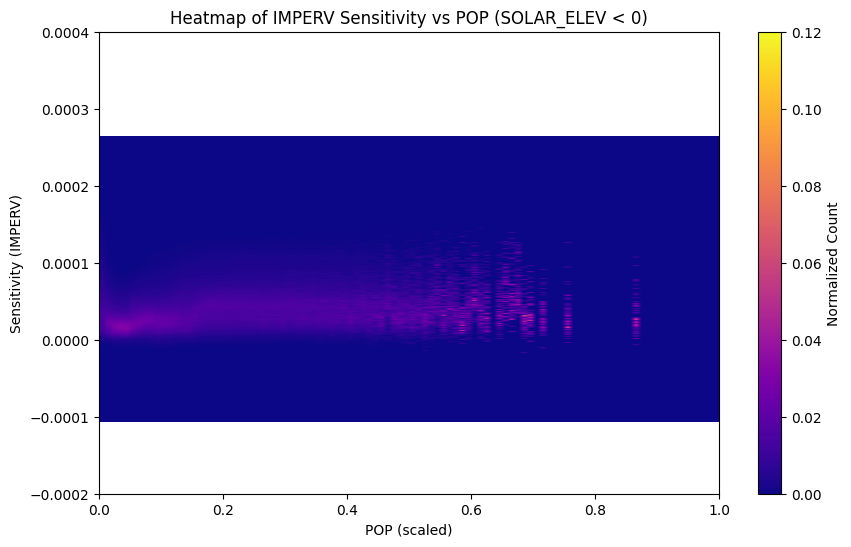

In [40]:
## IMPERV vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'POP'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[4, 'min']
height_max = min_max_df.loc[4, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


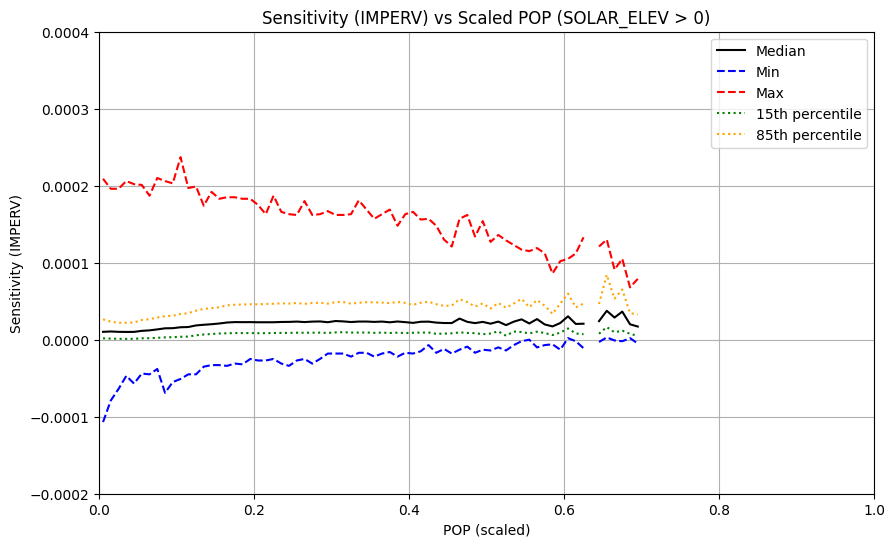

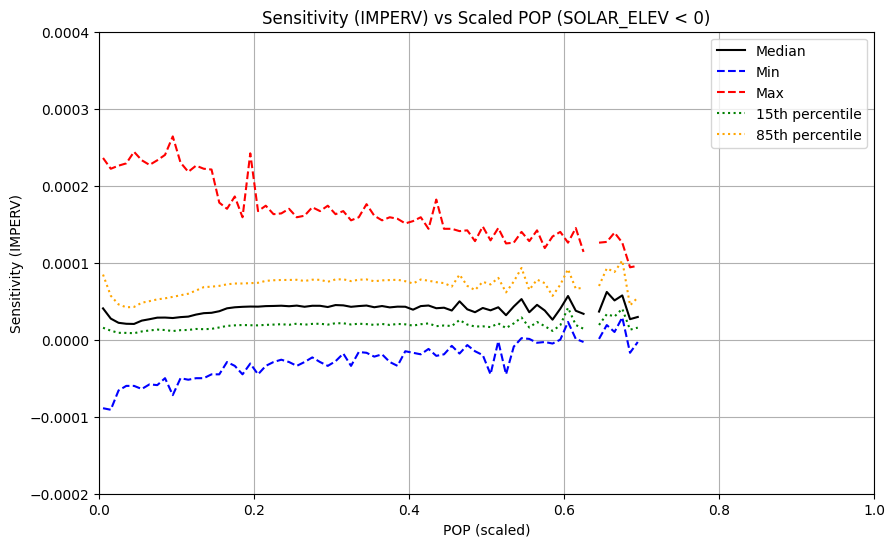

In [41]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 3.73 seconds.
Processed TRAIN chunk 2 in 4.38 seconds.
Processed TRAIN chunk 3 in 4.25 seconds.
Processed TRAIN chunk 4 in 3.66 seconds.
Processed TRAIN chunk 5 in 3.60 seconds.
Processed TRAIN chunk 6 in 3.57 seconds.
Processed TRAIN chunk 7 in 3.87 seconds.
Processed TRAIN chunk 8 in 3.59 seconds.
Processed TRAIN chunk 9 in 3.43 seconds.
Processed TRAIN chunk 10 in 3.70 seconds.
Processed TRAIN chunk 11 in 3.70 seconds.
Processed TRAIN chunk 12 in 3.43 seconds.
Processed TRAIN chunk 13 in 3.48 seconds.
Processed TRAIN chunk 14 in 3.48 seconds.
Processed TRAIN chunk 15 in 3.47 seconds.
Processed TRAIN chunk 16 in 3.43 seconds.
Processed TRAIN chunk 17 in 3.50 seconds.
Processed TRAIN chunk 18 in 4.18 seconds.
Processed TRAIN chunk 19 in 4.40 seconds.
Processed TRAIN chunk 20 in 3.80 seconds.
Processed TRAIN chunk 21 in 3.62 seconds.
Processed TRAIN chunk 22 in 4.15 seconds.
Processed TRAIN chunk 23 in 3.58 seconds.
P

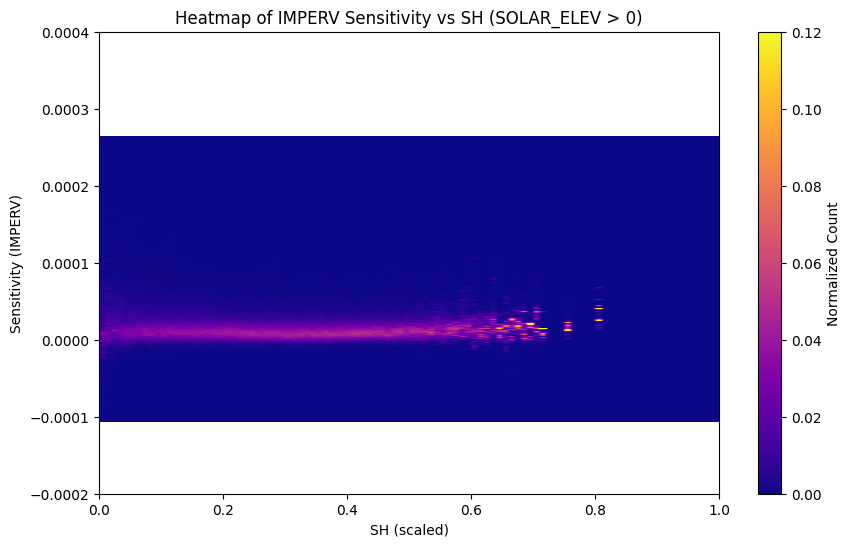

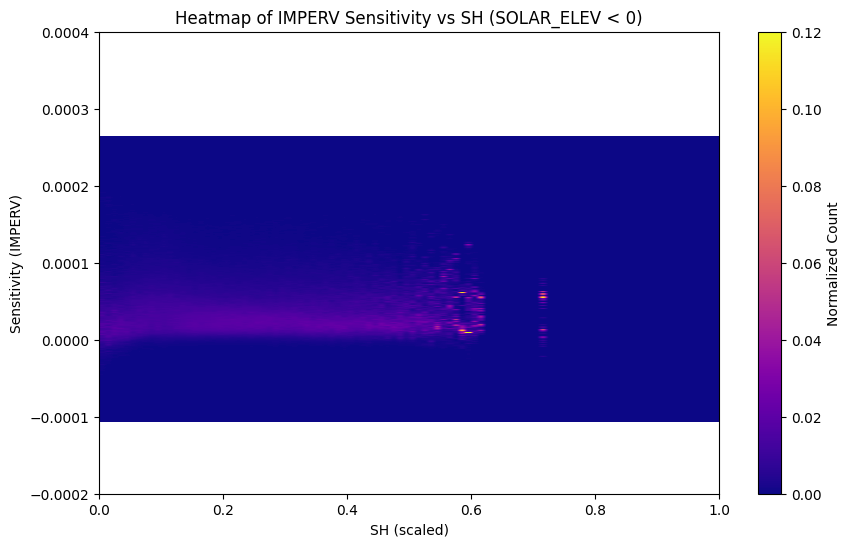

In [42]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'SH'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = 0.0007270362004324
height_max = 0.0232567166249862

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    SH_file = f'data/CLUSTER3_{part}_SH.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    SH_iter = pd.read_csv(SH_file, usecols=[corr_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['SOLAR_ELEV'], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time()
    for dds_chunk, cities_chunk, SH_chunk in zip(dds_iter, cities_iter, SH_iter):
        chunk_counter += 1

        # Extract columns
        sensitivities = dds_chunk[sensitivity_column].values
        pops = SH_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values


        # Apply masks for day and night
        mask_pos = (solar_elev > 0) 
        mask_neg = (solar_elev < 0) 

        for mask, heatmap_count, height_bin_counts in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0)
        ]:
            if not np.any(mask):
                continue  # Skip if no data in this condition

            sens_filtered = sensitivities[mask]
            pop_filtered = pops[mask]

            # Scale POP
            pop_scaled = (pop_filtered - height_min) / (height_max - height_min)
            pop_scaled = np.clip(pop_scaled, 0, 1)

            # 2D histogram accumulation
            hmap, _, _ = np.histogram2d(pop_scaled, sens_filtered, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(pop_scaled, bins=height_bins_pop_0)

            heatmap_count += hmap
            height_bin_counts += hcount

        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


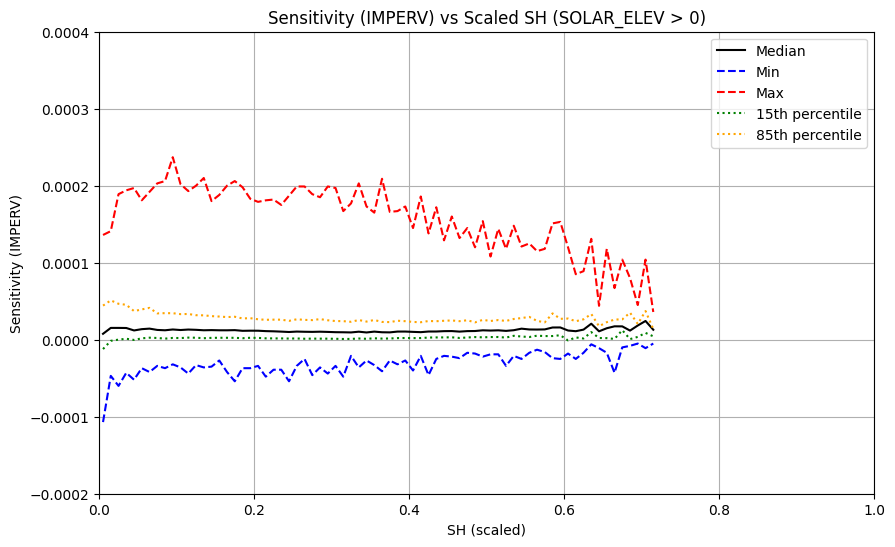

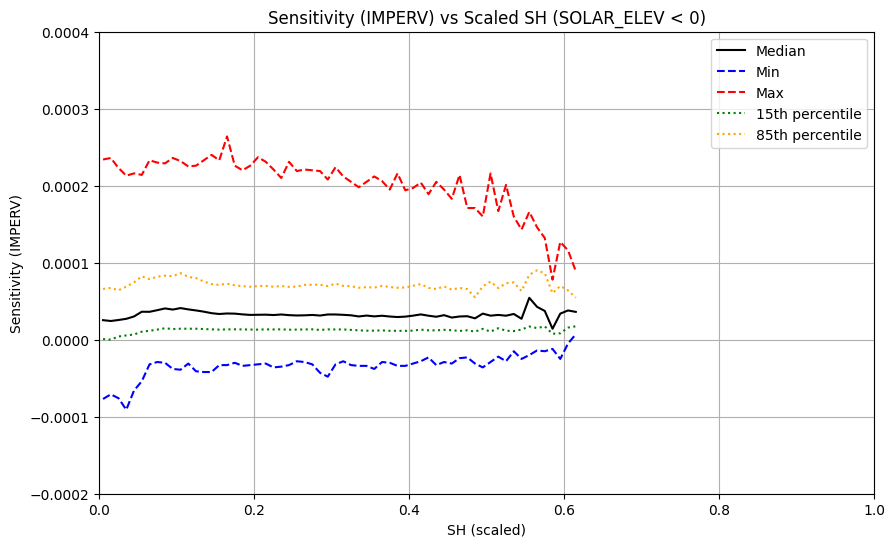

In [43]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


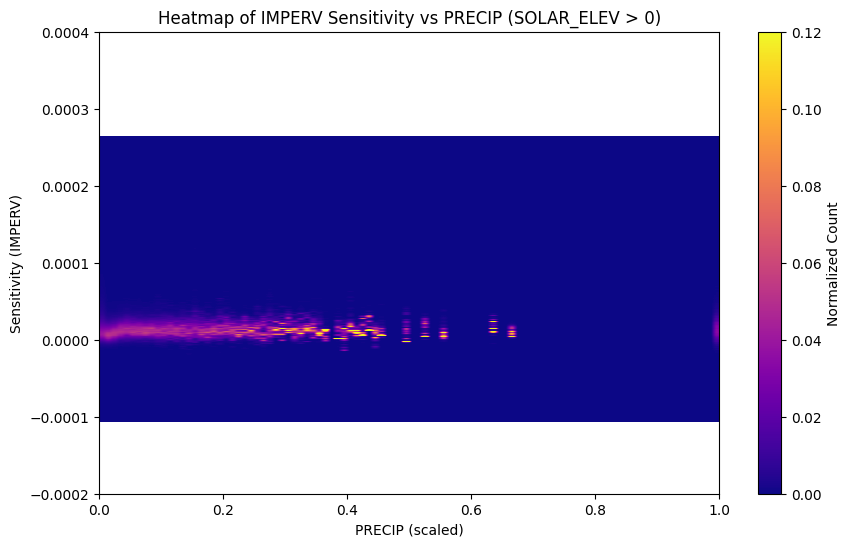

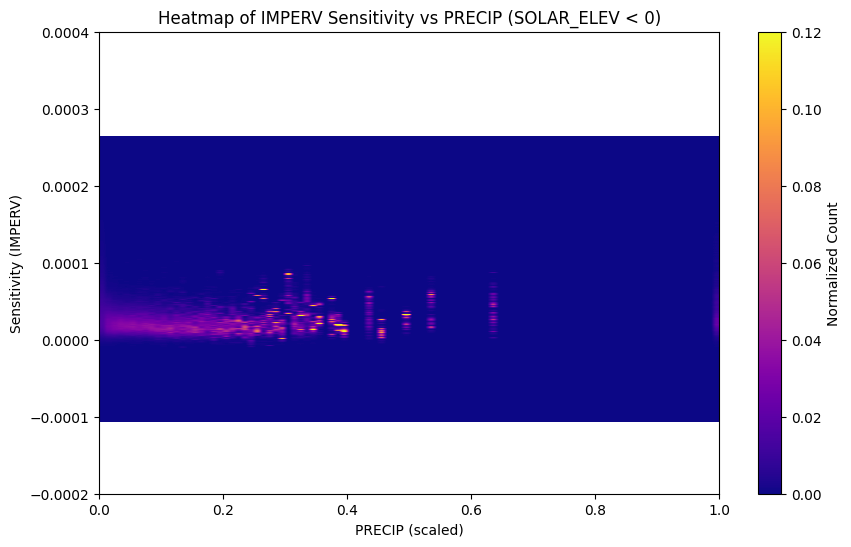

In [44]:
## IMPERV vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'PRECIP'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[7, 'min']
height_max = min_max_df.loc[7, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


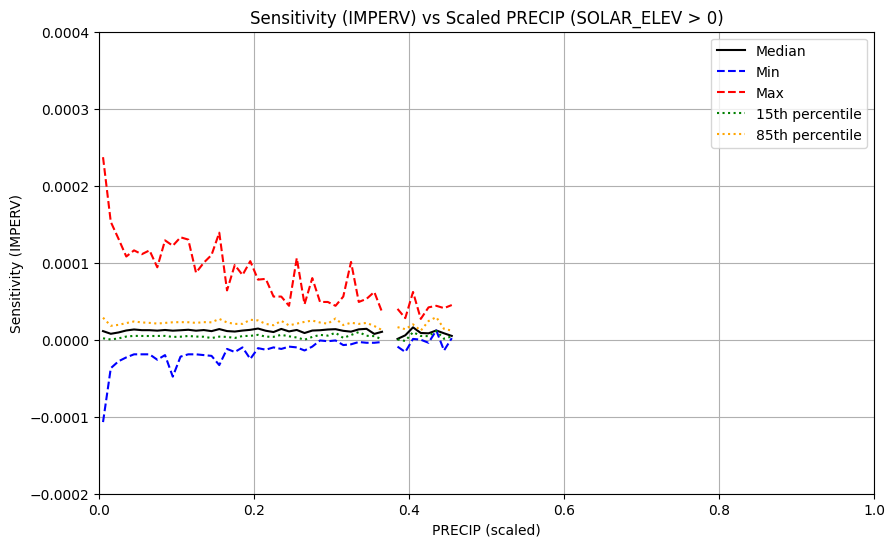

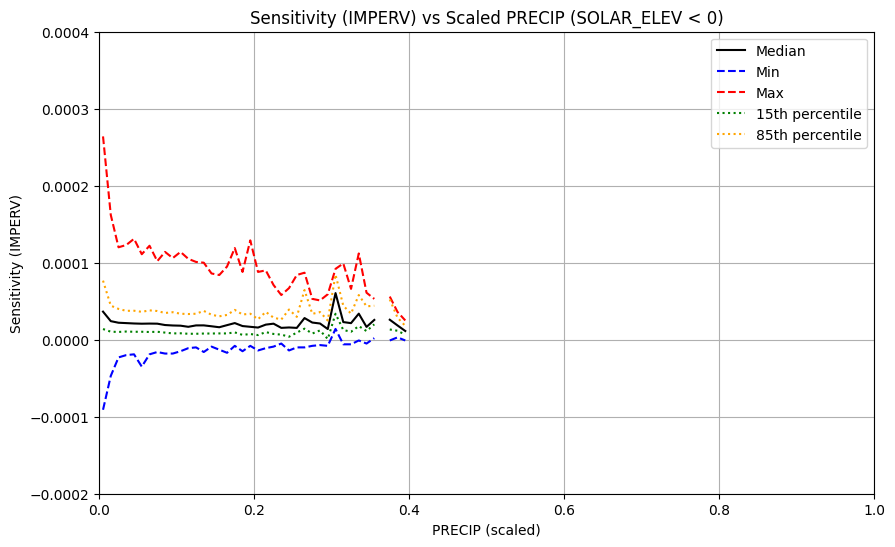

In [45]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


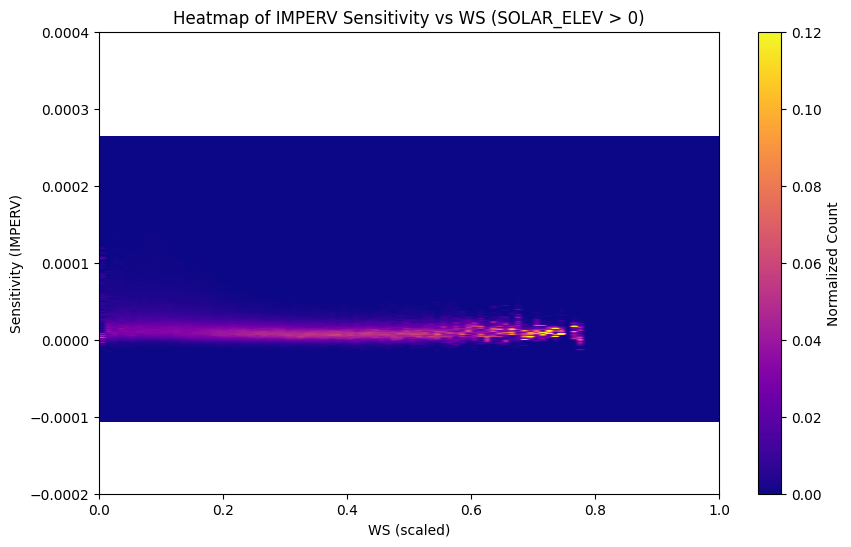

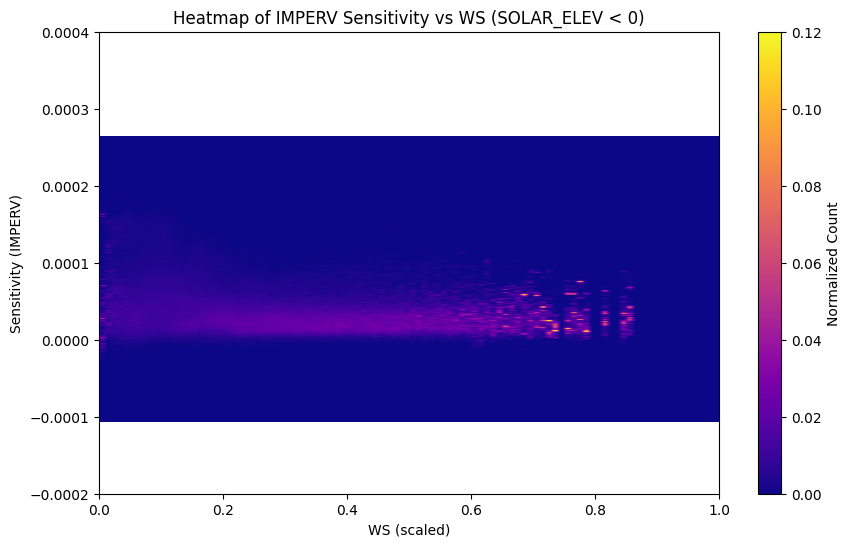

In [46]:
## IMPERV vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'WS'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[8, 'min']
height_max = min_max_df.loc[8, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


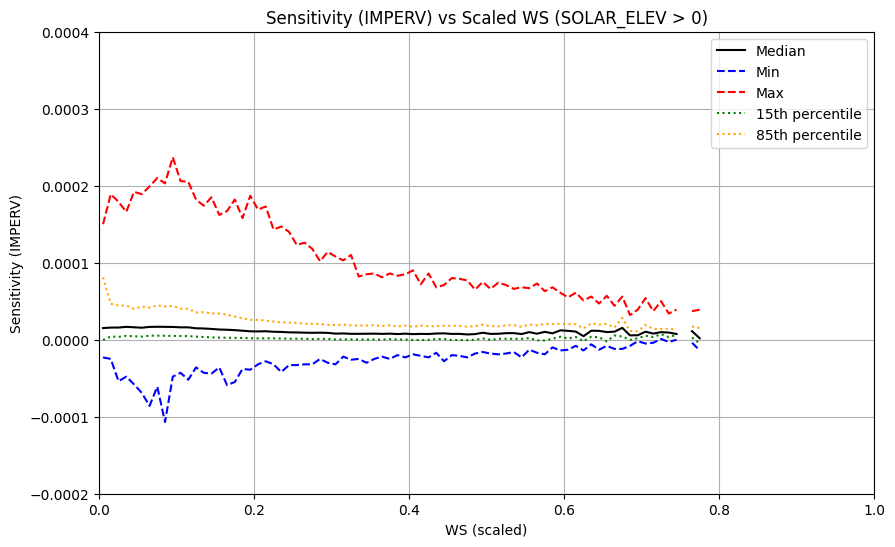

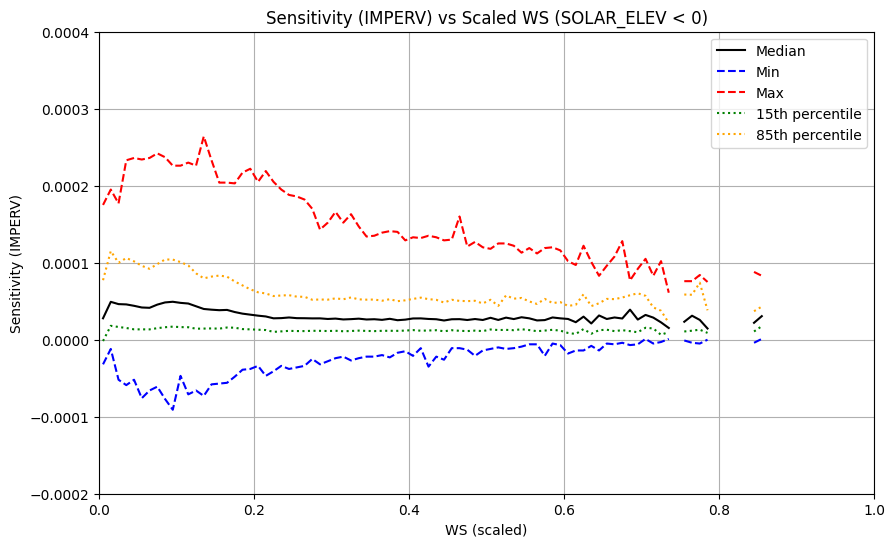

In [47]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


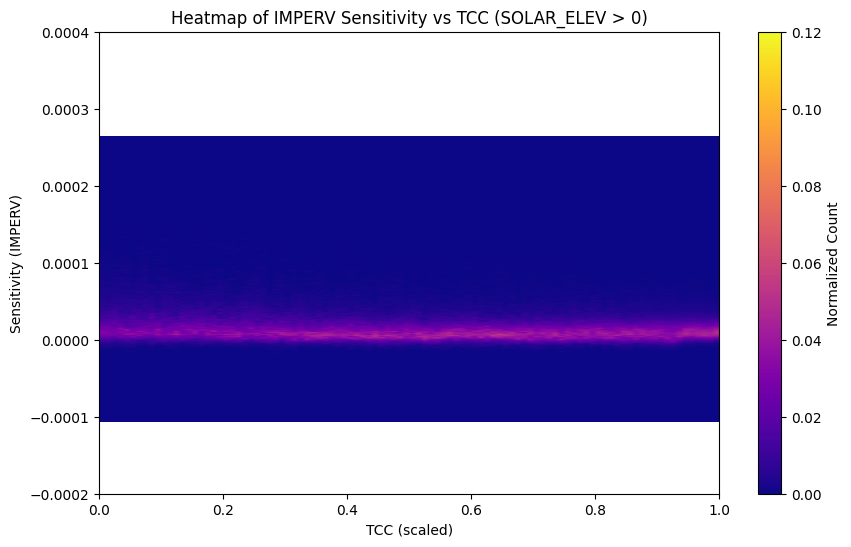

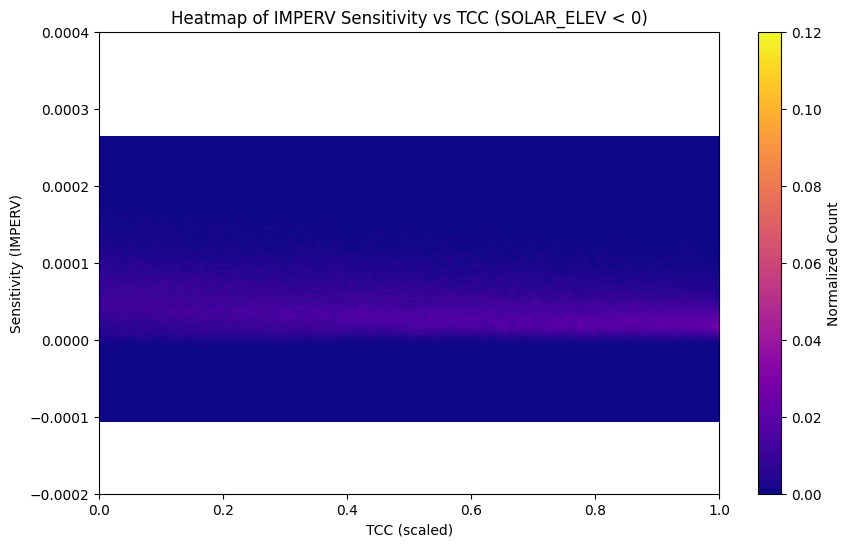

In [48]:
## IMPERV vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'TCC'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[10, 'min']
height_max = min_max_df.loc[10, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


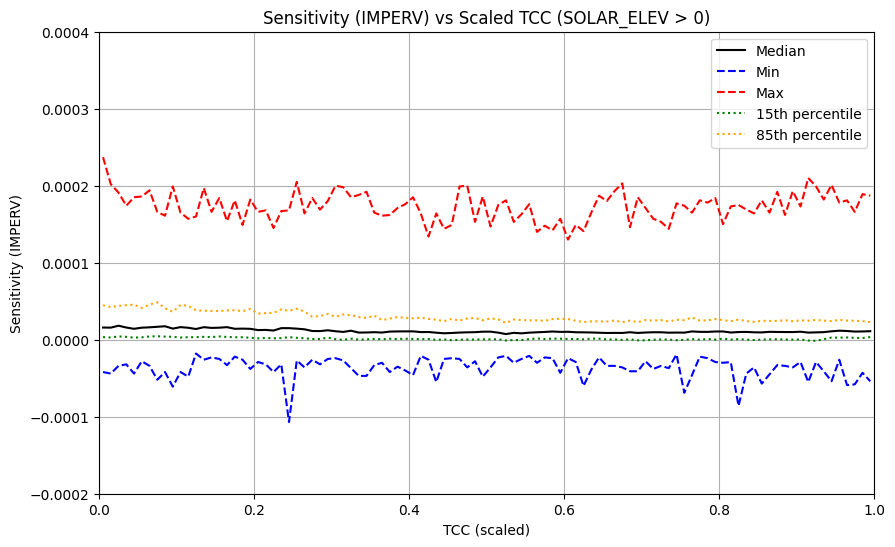

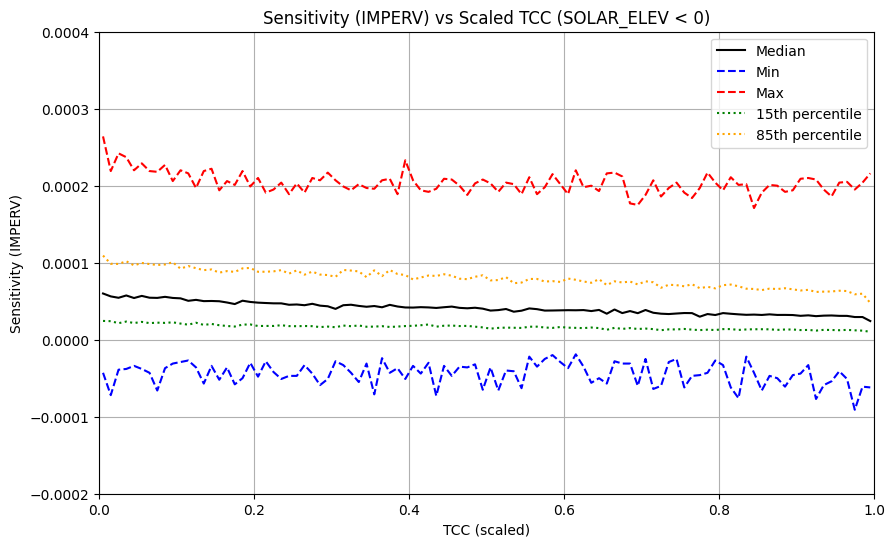

In [49]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


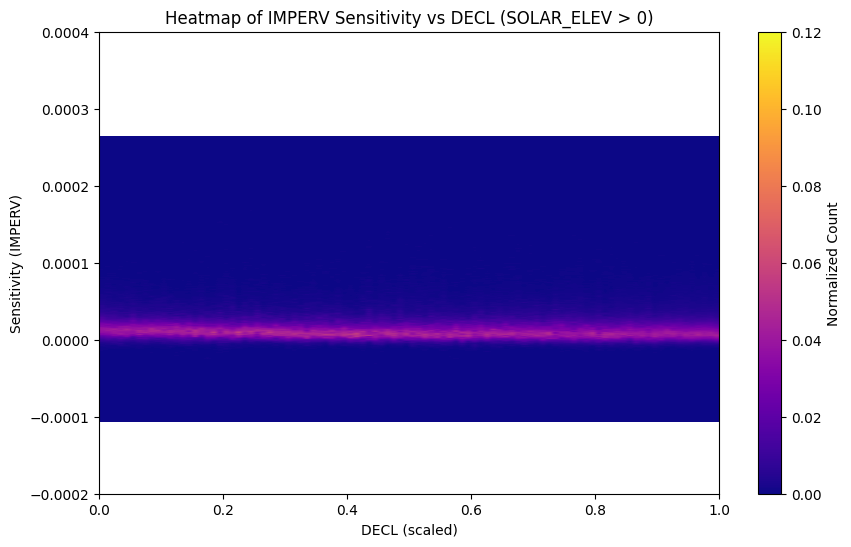

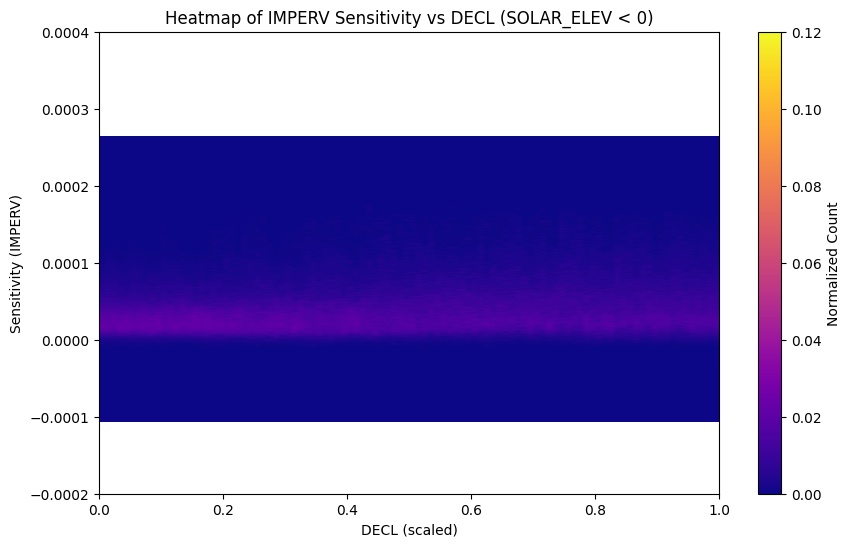

In [50]:
## IMPERV vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'DECL'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[14, 'min']
height_max = min_max_df.loc[14, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


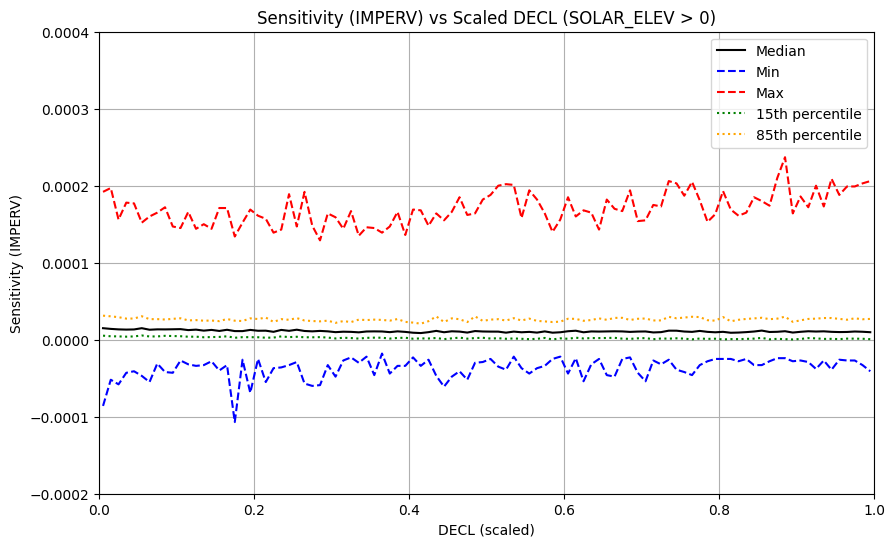

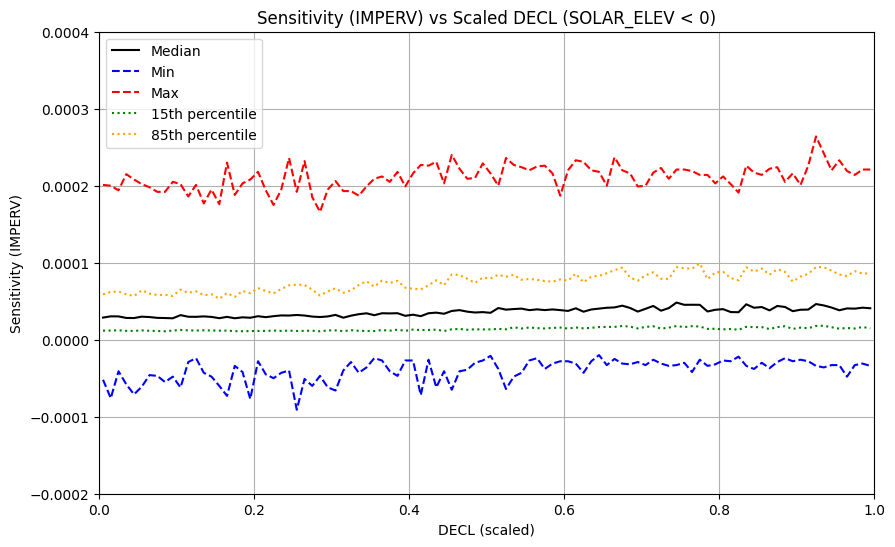

In [51]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 3.13 seconds.
Processed TRAIN chunk 2 in 3.14 seconds.
Processed TRAIN chunk 3 in 3.16 seconds.
Processed TRAIN chunk 4 in 3.11 seconds.
Processed TRAIN chunk 5 in 3.12 seconds.
Processed TRAIN chunk 6 in 3.18 seconds.
Processed TRAIN chunk 7 in 3.17 seconds.
Processed TRAIN chunk 8 in 3.08 seconds.
Processed TRAIN chunk 9 in 3.08 seconds.
Processed TRAIN chunk 10 in 3.06 seconds.
Processed TRAIN chunk 11 in 3.08 seconds.
Processed TRAIN chunk 12 in 3.09 seconds.
Processed TRAIN chunk 13 in 3.10 seconds.
Processed TRAIN chunk 14 in 3.09 seconds.
Processed TRAIN chunk 15 in 3.27 seconds.
Processed TRAIN chunk 16 in 3.17 seconds.
Processed TRAIN chunk 17 in 3.10 seconds.
Processed TRAIN chunk 18 in 3.10 seconds.
Processed TRAIN chunk 19 in 3.10 seconds.
Processed TRAIN chunk 20 in 3.14 seconds.
Processed TRAIN chunk 21 in 3.32 seconds.
Processed TRAIN chunk 22 in 3.14 seconds.
Processed TRAIN chunk 23 in 3.15 seconds.
P

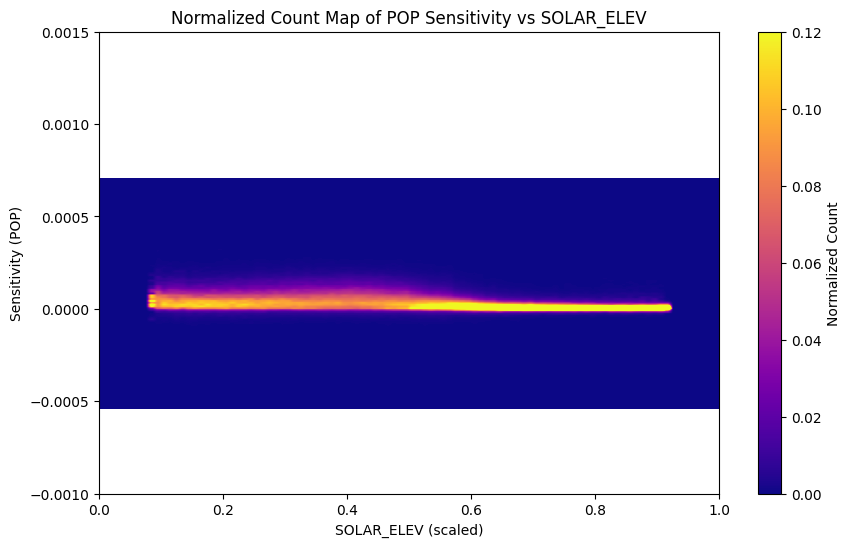

In [5]:
## Height vs SOLAR_ELEV ##
# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'SOLAR_ELEV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[13, 'min']
height_max = min_max_df.loc[13, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.00001

height_bins_13 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity across all batches
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins now that we know min/max
sens_bins_13 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators
heatmap_count_13 = np.zeros((len(height_bins_13) - 1, len(sens_bins_13) - 1))
height_bin_counts_13 = np.zeros(len(height_bins_13) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time() 
    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        chunk_counter += 1
        
        
        # Align the batches
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)  # Ensure within [0, 1]

        # 2D histogram accumulation
        hmap, _, _ = np.histogram2d(height_scaled, sensitivities, bins=[height_bins_13, sens_bins_13])
        hcount, _ = np.histogram(height_scaled, bins=height_bins_13)

        # Update accumulators
        heatmap_count_13 += hmap
        height_bin_counts_13 += hcount

        # Calculate time taken for this chunk
        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize
for i in range(len(height_bin_counts_13)):
    if height_bin_counts_13[i] > 0:
        heatmap_count_13[i, :] /= height_bin_counts_13[i]

# Plotting
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_13.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Normalized Count Map of {sensitivity_column} Sensitivity vs {corr_column}')
plt.grid(False)
plt.show()


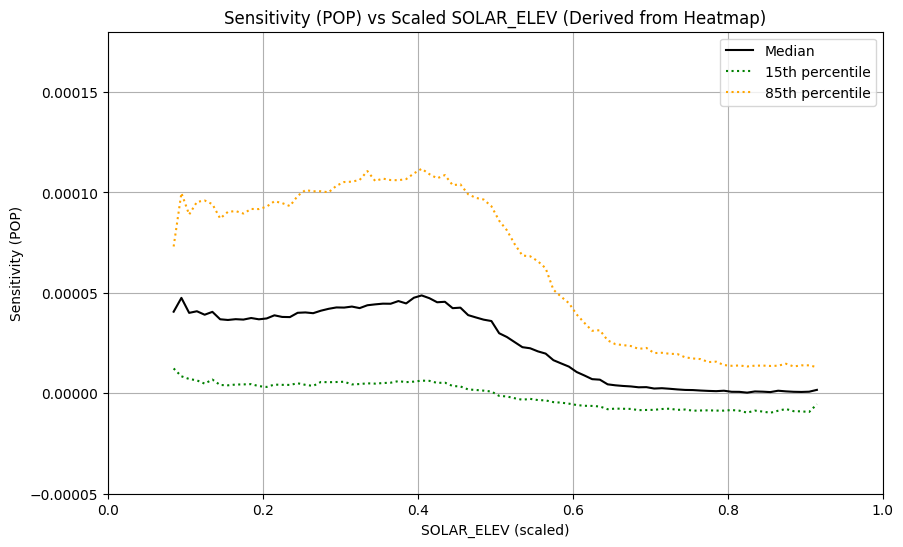

In [7]:

# Compute bin centers for HEIGHT and sensitivity
bin_centers_height = (height_bins_13[:-1] + height_bins_13[1:]) / 2
bin_centers_sens = (sens_bins_13[:-1] + sens_bins_13[1:]) / 2

# Prepare lists to store computed statistics
median_sens = []
min_sens = []
max_sens = []
p15_sens = []
p85_sens = []

# Compute statistics from the normalized histograms
for i in range(heatmap_count_13.shape[0]):
    counts = heatmap_count_13[i, :]
    
    if counts.sum() == 0:
        median_sens.append(np.nan)
        min_sens.append(np.nan)
        max_sens.append(np.nan)
        p15_sens.append(np.nan)
        p85_sens.append(np.nan)
        continue

    cdf = np.cumsum(counts)
    cdf = cdf / cdf[-1]  # Normalize to [0, 1]
    
    # Get interpolated values at desired percentiles
    median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
    p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
    p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

    # Min/max from non-zero counts
    nonzero_idx = np.where(counts > 0)[0]
    min_sens.append(bin_centers_sens[nonzero_idx[0]])
    max_sens.append(bin_centers_sens[nonzero_idx[-1]])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_sens, label='Median', color='black')
#plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
#plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0,1)
plt.ylim(-0.00005, 0.00018)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} (Derived from Heatmap)')
plt.legend()
plt.grid(True)
plt.show()



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


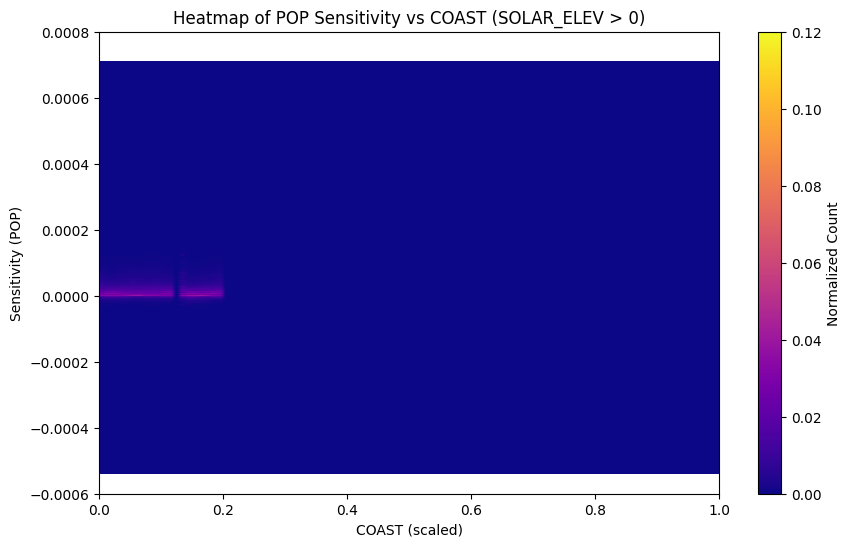

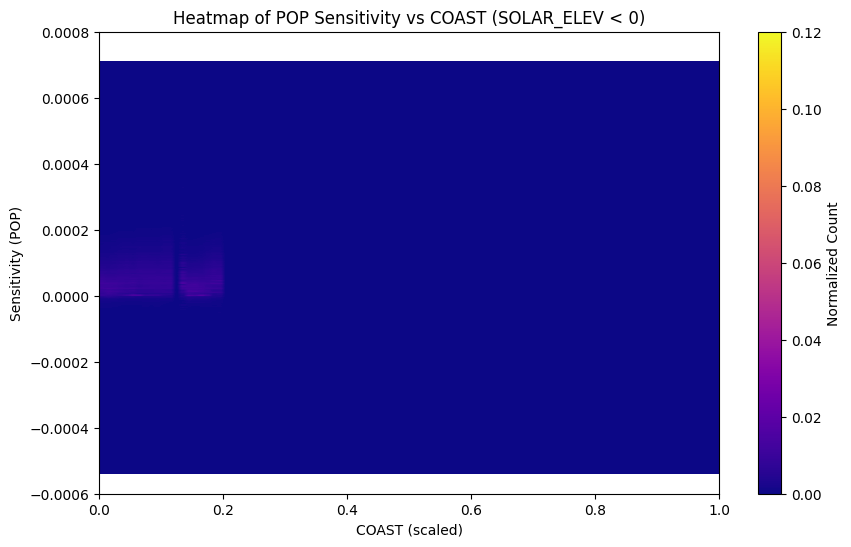

In [52]:
## POP vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'COAST'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[1, 'min']
height_max = min_max_df.loc[1, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


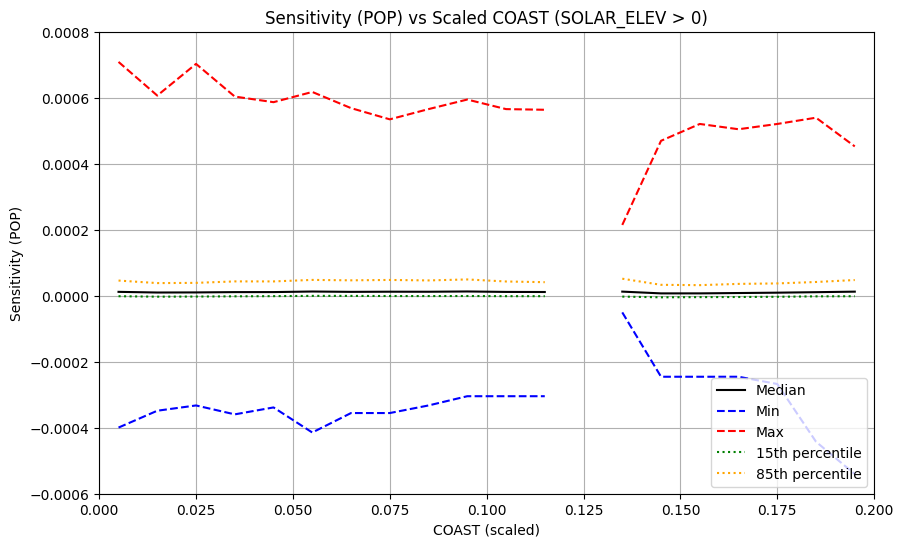

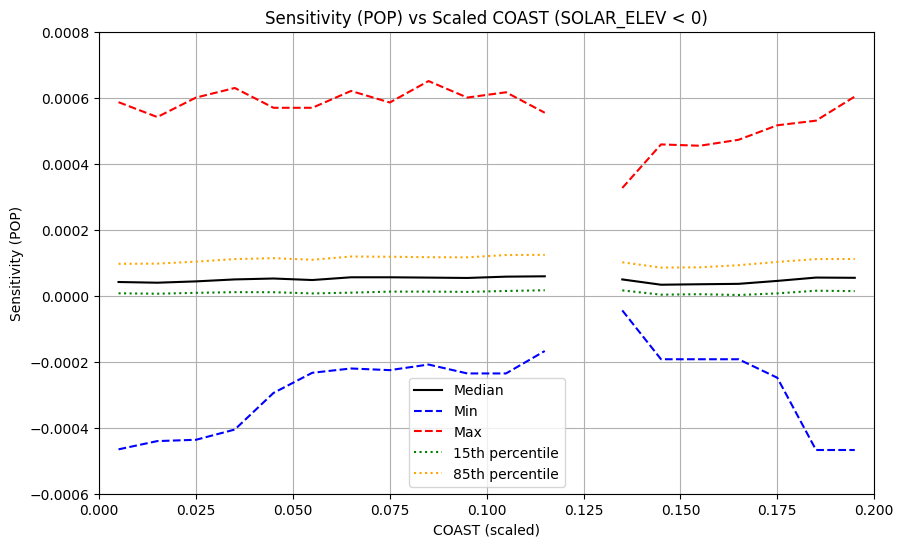

In [53]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 0.2)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


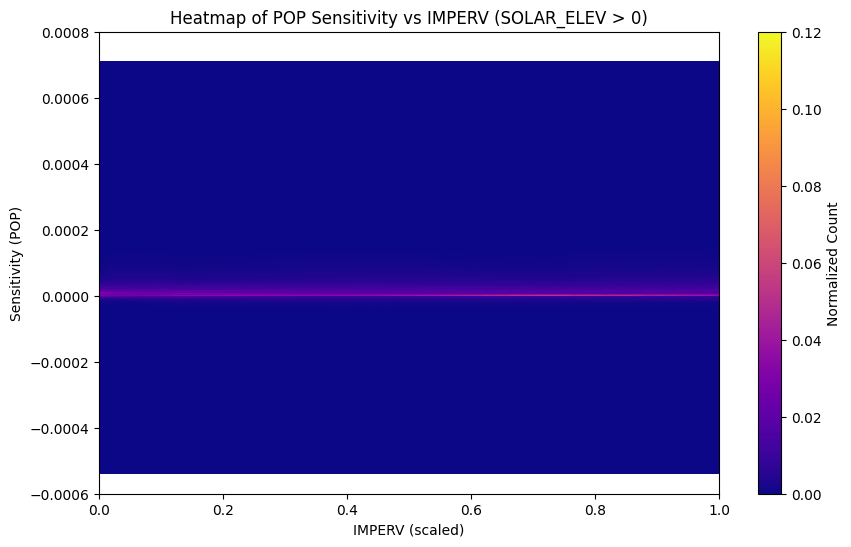

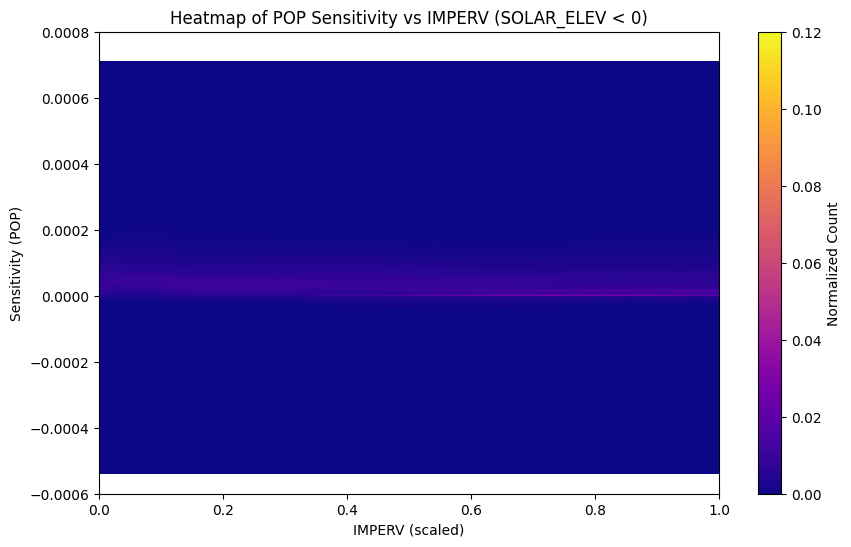

In [54]:
## POP vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'IMPERV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[2, 'min']
height_max = min_max_df.loc[2, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


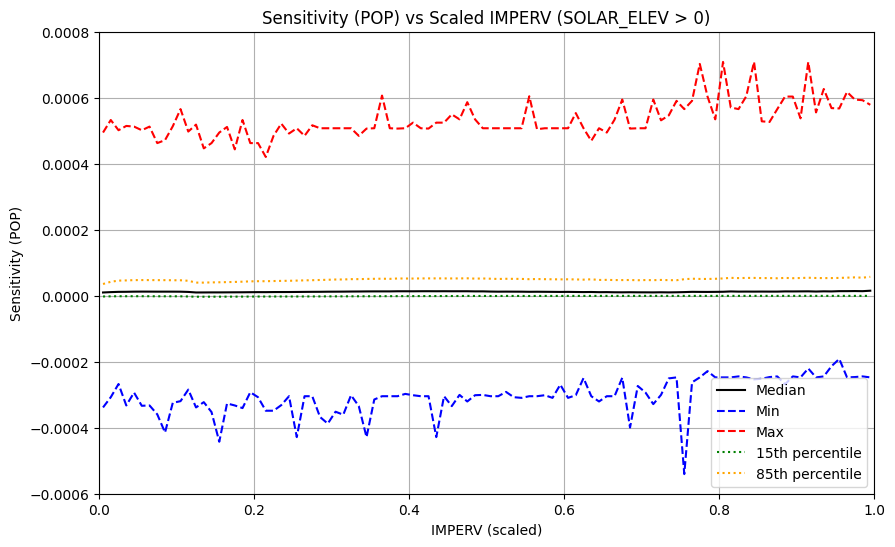

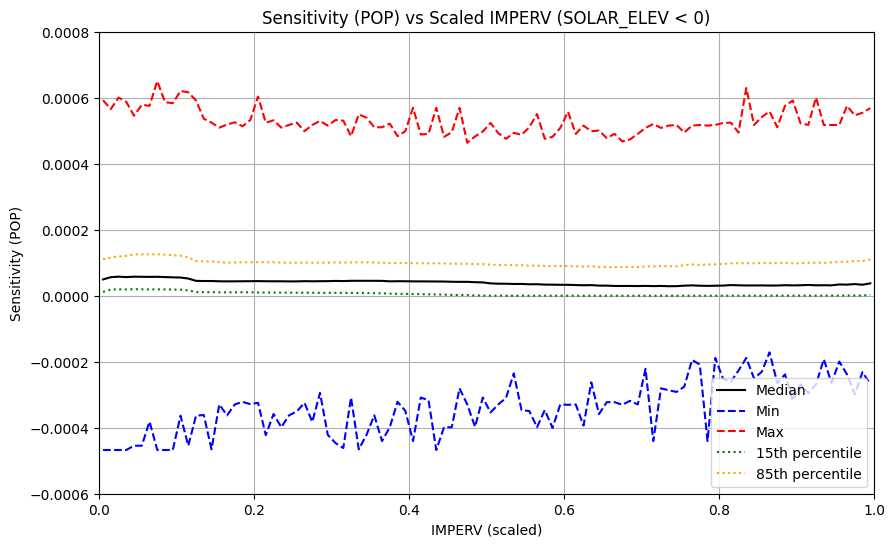

In [55]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


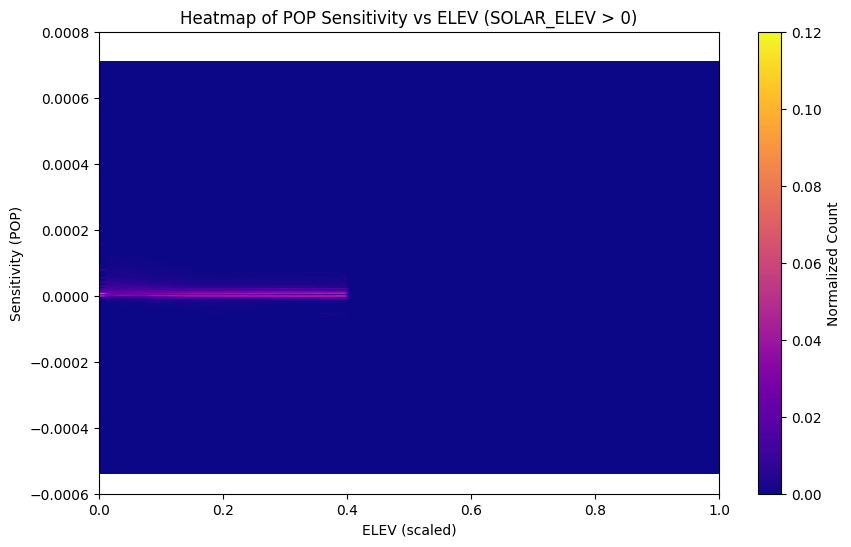

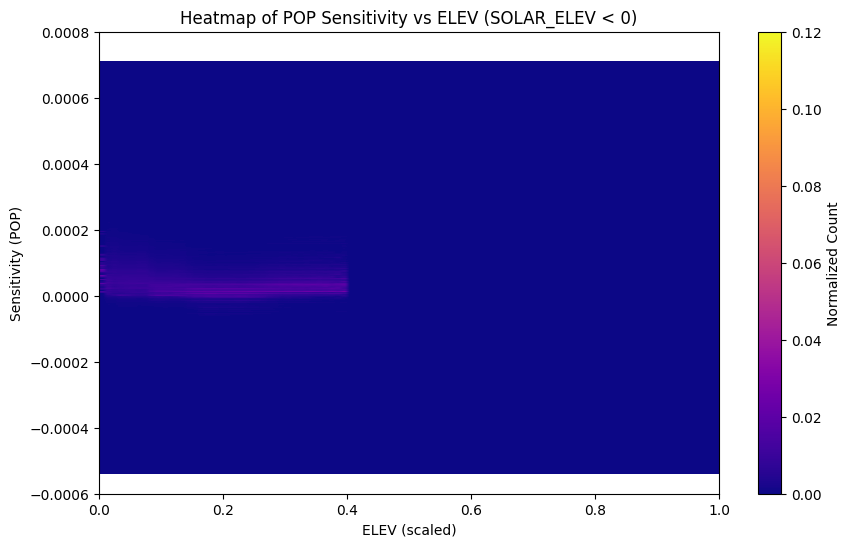

In [56]:
## POP vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'ELEV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[3, 'min']
height_max = min_max_df.loc[3, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


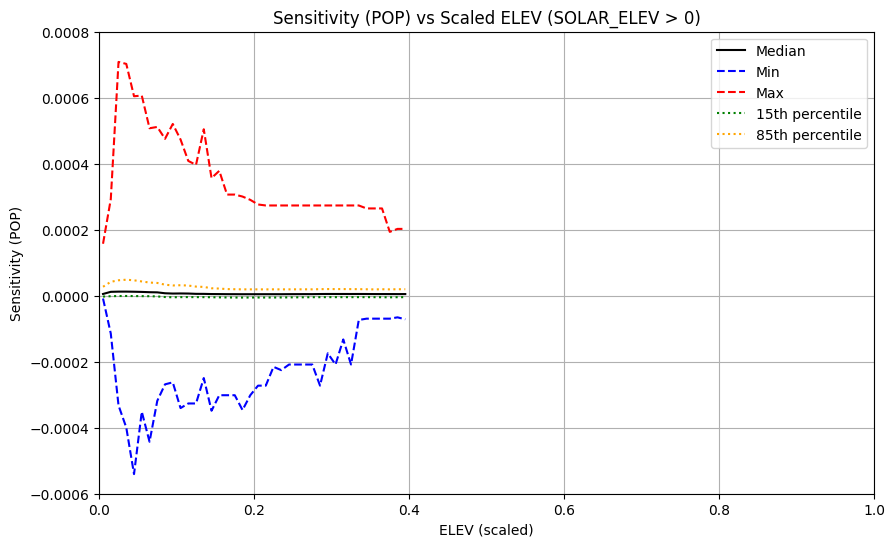

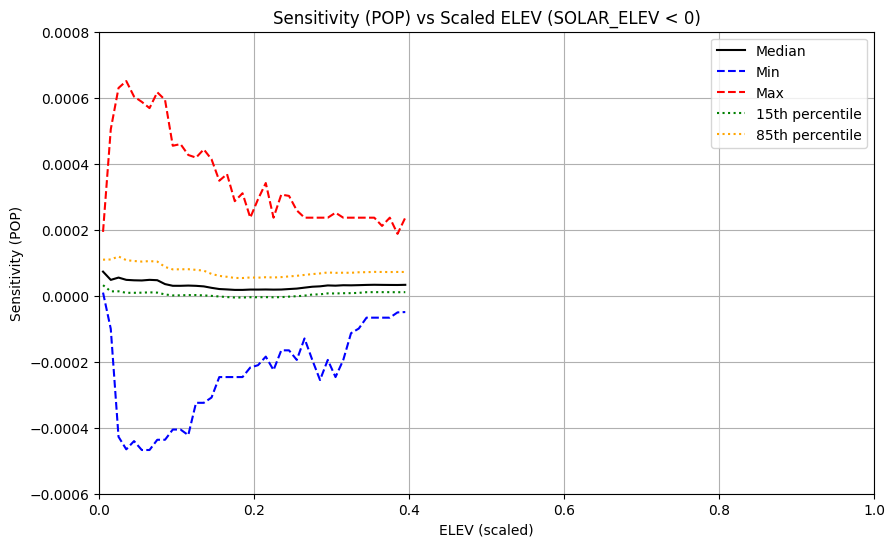

In [57]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 8.12 seconds.
Processed TRAIN chunk 2 in 8.01 seconds.
Processed TRAIN chunk 3 in 8.84 seconds.
Processed TRAIN chunk 4 in 8.15 seconds.
Processed TRAIN chunk 5 in 8.46 seconds.
Processed TRAIN chunk 6 in 8.12 seconds.
Processed TRAIN chunk 7 in 8.05 seconds.
Processed TRAIN chunk 8 in 8.54 seconds.
Processed TRAIN chunk 9 in 8.05 seconds.
Processed TRAIN chunk 10 in 8.00 seconds.
Processed TRAIN chunk 11 in 8.58 seconds.
Processed TRAIN chunk 12 in 8.33 seconds.
Processed TRAIN chunk 13 in 8.08 seconds.
Processed TRAIN chunk 14 in 8.18 seconds.
Processed TRAIN chunk 15 in 8.42 seconds.
Processed TRAIN chunk 16 in 7.99 seconds.
Processed TRAIN chunk 17 in 8.02 seconds.
Processed TRAIN chunk 18 in 8.25 seconds.
Processed TRAIN chunk 19 in 8.11 seconds.
Processed TRAIN chunk 20 in 8.32 seconds.
Processed TRAIN chunk 21 in 8.44 seconds.
Processed TRAIN chunk 22 in 8.19 seconds.
Processed TRAIN chunk 23 in 8.10 seconds.
P

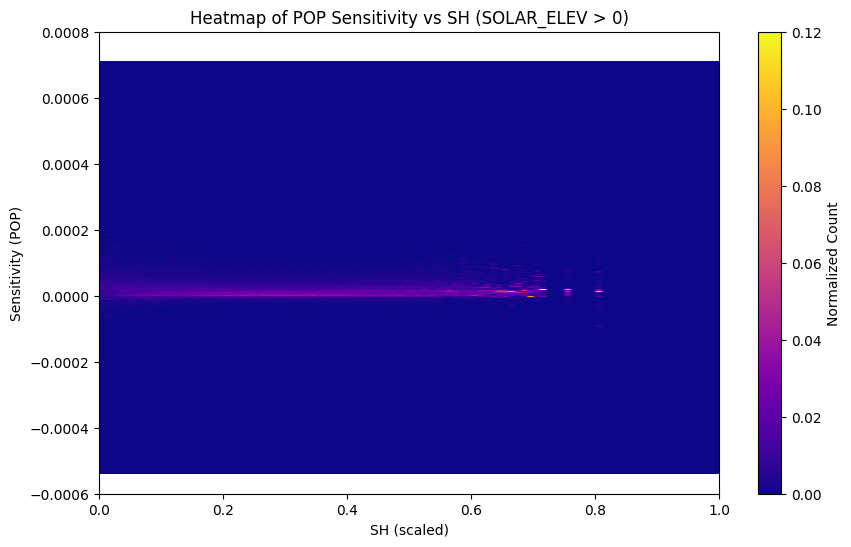

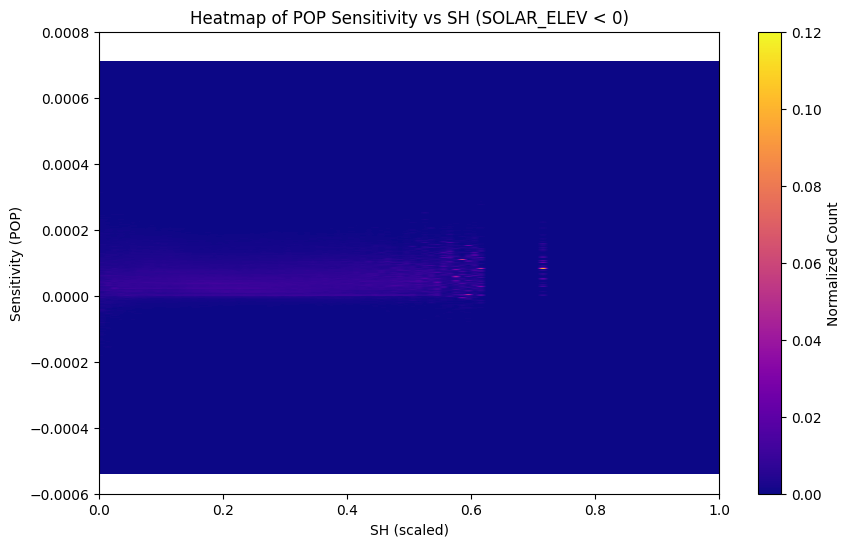

In [58]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'SH'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = 0.0007270362004324
height_max = 0.0232567166249862

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    SH_file = f'data/CLUSTER3_{part}_SH.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    SH_iter = pd.read_csv(SH_file, usecols=[corr_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['SOLAR_ELEV'], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time()
    for dds_chunk, cities_chunk, SH_chunk in zip(dds_iter, cities_iter, SH_iter):
        chunk_counter += 1

        # Extract columns
        sensitivities = dds_chunk[sensitivity_column].values
        pops = SH_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values


        # Apply masks for day and night
        mask_pos = (solar_elev > 0) 
        mask_neg = (solar_elev < 0) 

        for mask, heatmap_count, height_bin_counts in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0)
        ]:
            if not np.any(mask):
                continue  # Skip if no data in this condition

            sens_filtered = sensitivities[mask]
            pop_filtered = pops[mask]

            # Scale POP
            pop_scaled = (pop_filtered - height_min) / (height_max - height_min)
            pop_scaled = np.clip(pop_scaled, 0, 1)

            # 2D histogram accumulation
            hmap, _, _ = np.histogram2d(pop_scaled, sens_filtered, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(pop_scaled, bins=height_bins_pop_0)

            heatmap_count += hmap
            height_bin_counts += hcount

        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


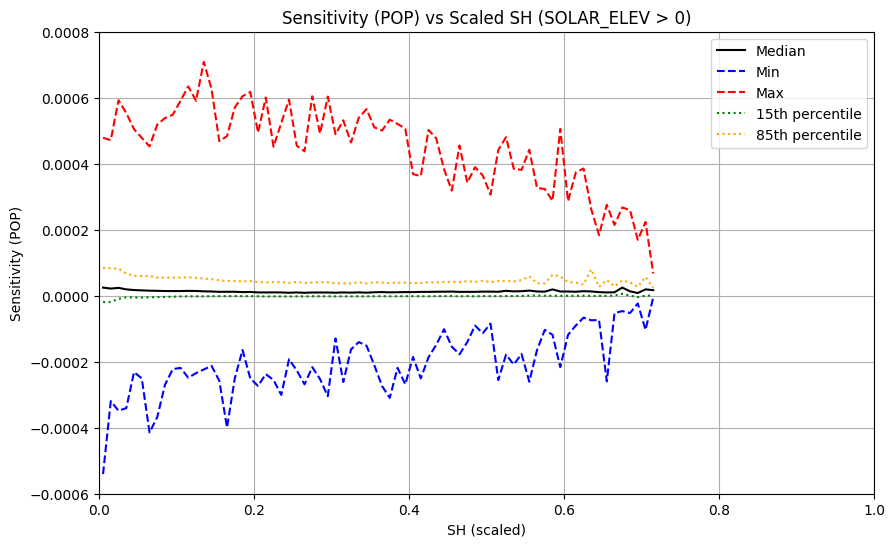

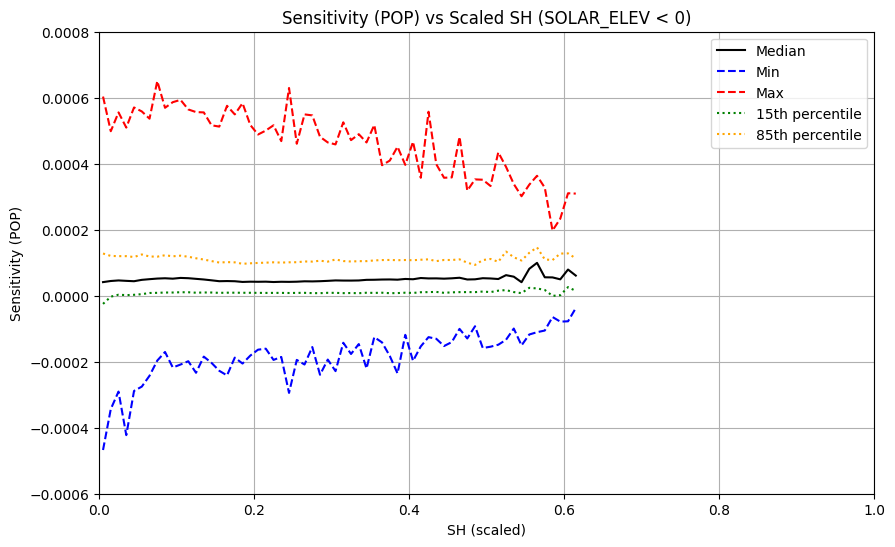

In [59]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


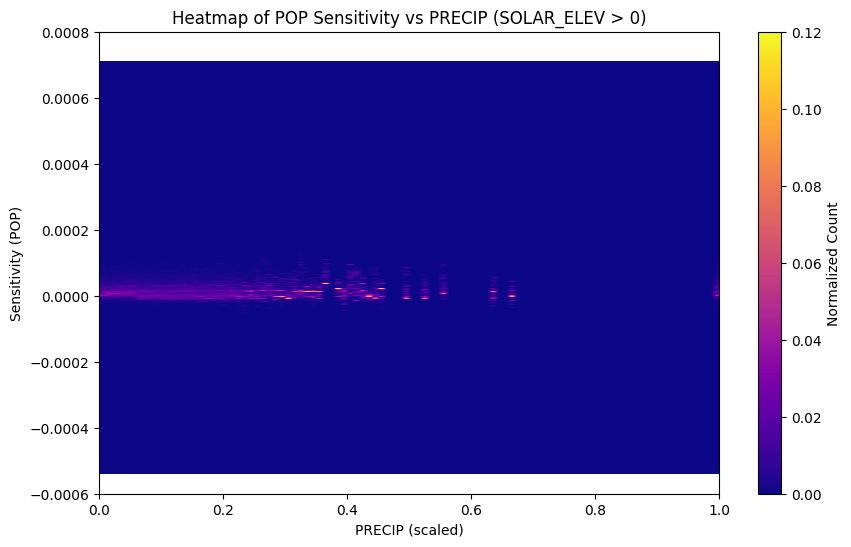

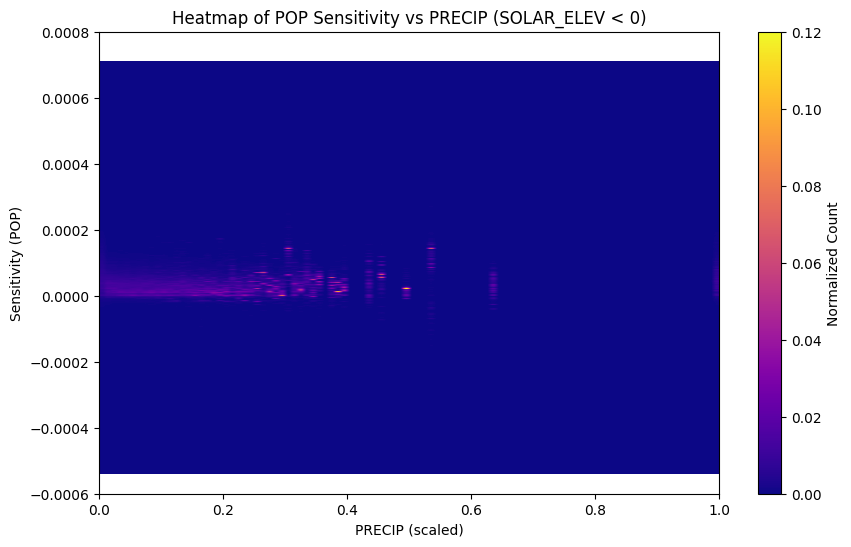

In [60]:
## POP vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'PRECIP'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[7, 'min']
height_max = min_max_df.loc[7, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


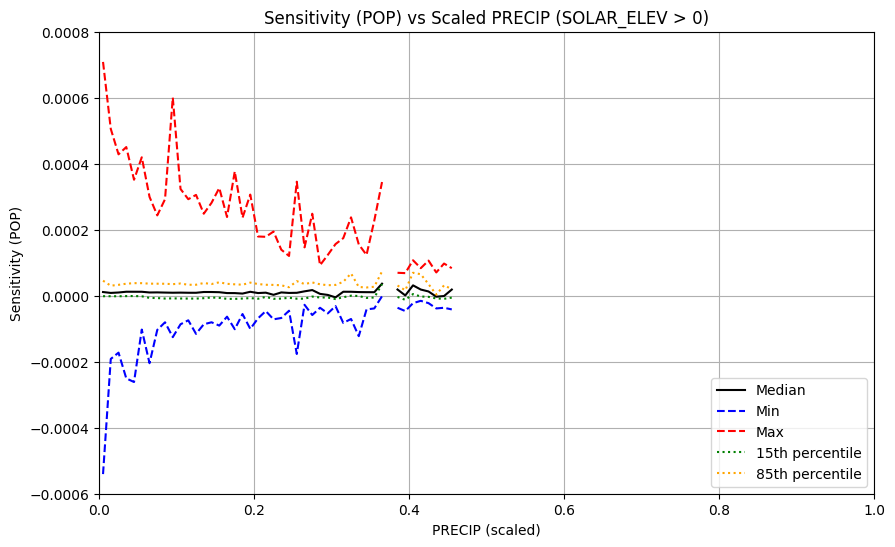

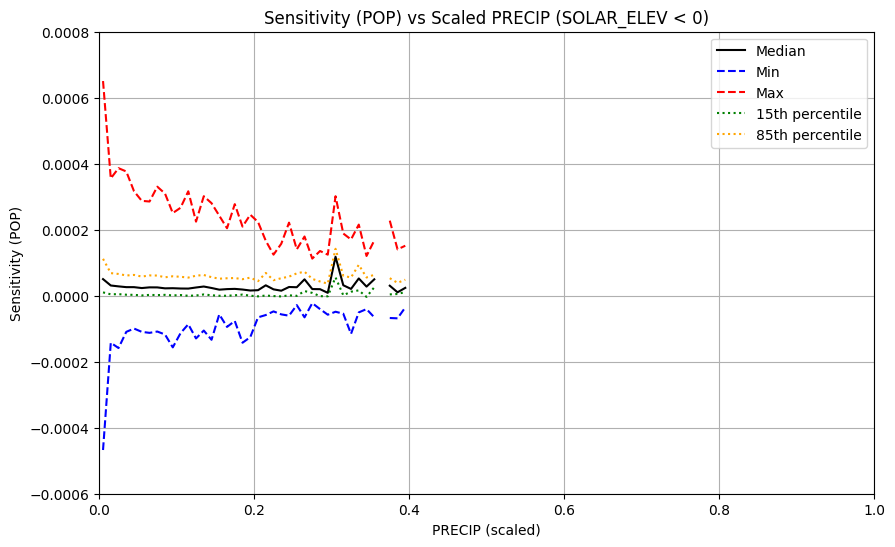

In [61]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')


In [ ]:
## POP vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'WS'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[8, 'min']
height_max = min_max_df.loc[8, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


In [ ]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')


In [ ]:
## POP vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'TCC'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[10, 'min']
height_max = min_max_df.loc[10, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


In [ ]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')


In [ ]:
## POP vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'DECL'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[14, 'min']
height_max = min_max_df.loc[14, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


In [ ]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 4.08 seconds.
Processed TRAIN chunk 2 in 4.09 seconds.
Processed TRAIN chunk 3 in 4.11 seconds.
Processed TRAIN chunk 4 in 4.04 seconds.
Processed TRAIN chunk 5 in 4.18 seconds.
Processed TRAIN chunk 6 in 4.14 seconds.
Processed TRAIN chunk 7 in 4.07 seconds.
Processed TRAIN chunk 8 in 4.03 seconds.
Processed TRAIN chunk 9 in 4.03 seconds.
Processed TRAIN chunk 10 in 3.95 seconds.
Processed TRAIN chunk 11 in 4.03 seconds.
Processed TRAIN chunk 12 in 3.97 seconds.
Processed TRAIN chunk 13 in 3.94 seconds.
Processed TRAIN chunk 14 in 4.12 seconds.
Processed TRAIN chunk 15 in 4.23 seconds.
Processed TRAIN chunk 16 in 4.03 seconds.
Processed TRAIN chunk 17 in 3.96 seconds.
Processed TRAIN chunk 18 in 3.99 seconds.
Processed TRAIN chunk 19 in 4.22 seconds.
Processed TRAIN chunk 20 in 4.06 seconds.
Processed TRAIN chunk 21 in 4.04 seconds.
Processed TRAIN chunk 22 in 3.99 seconds.
Processed TRAIN chunk 23 in 4.02 seconds.
P

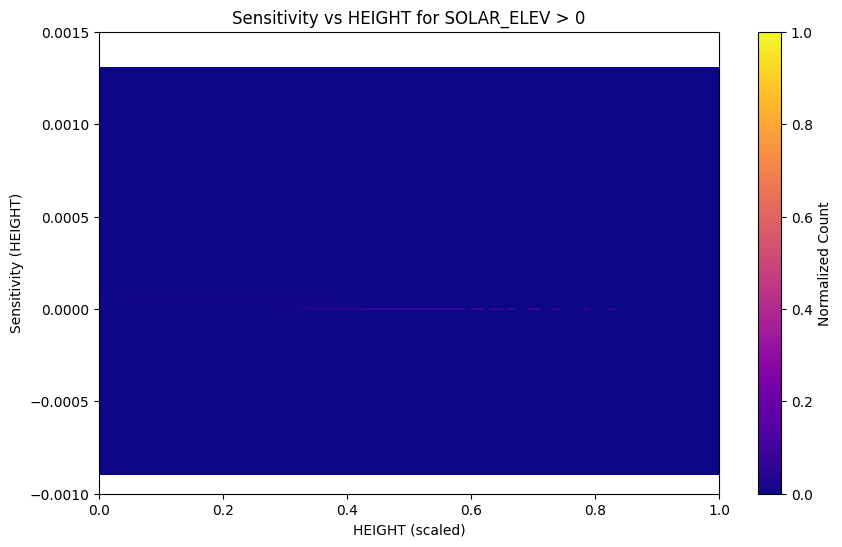

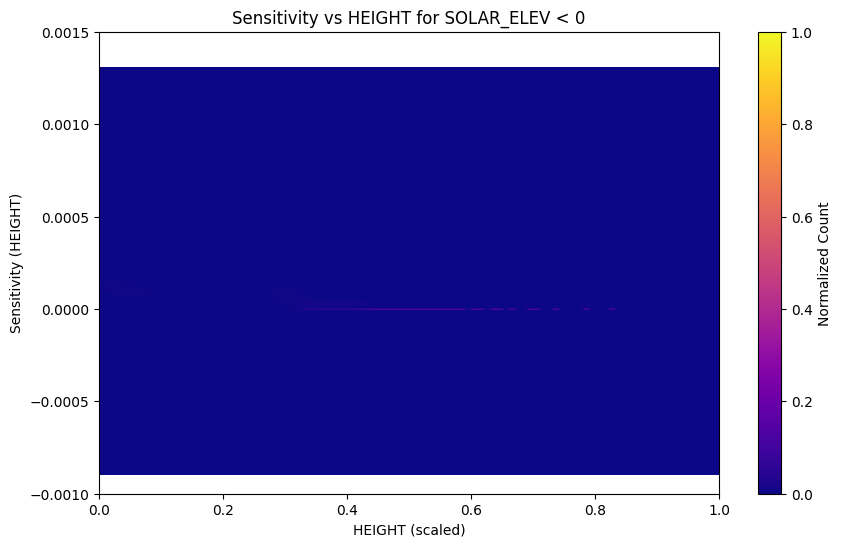

In [8]:
# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[0, 'min']
height_max = min_max_df.loc[0, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity across all batches
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins now that we know min/max
sens_bins_pop = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for two conditions
heatmap_count_pos_pop = np.zeros((len(height_bins_pop) - 1, len(sens_bins_pop) - 1))
height_bin_counts_pos = np.zeros(len(height_bins_pop) - 1)

heatmap_count_neg_pop = np.zeros((len(height_bins_pop) - 1, len(sens_bins_pop) - 1))
height_bin_counts_neg = np.zeros(len(height_bins_pop) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['HEIGHT', 'SOLAR_ELEV'], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time()
    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        chunk_counter += 1
        
        # Extract columns
        sensitivities = dds_chunk[sensitivity_column].values
        pops = cities_chunk['HEIGHT'].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap_count, height_bin_counts in [
            (mask_pos, heatmap_count_pos_pop, height_bin_counts_pos),
            (mask_neg, heatmap_count_neg_pop, height_bin_counts_neg)
        ]:
            if not np.any(mask):
                continue  # Skip if no data in this condition

            sens_filtered = sensitivities[mask]
            pop_filtered = pops[mask]

            # Scale POP
            pop_scaled = (pop_filtered - height_min) / (height_max - height_min)
            pop_scaled = np.clip(pop_scaled, 0, 1)

            # 2D histogram accumulation
            hmap, _, _ = np.histogram2d(pop_scaled, sens_filtered, bins=[height_bins_pop, sens_bins_pop])
            hcount, _ = np.histogram(pop_scaled, bins=height_bins_pop)

            heatmap_count += hmap
            height_bin_counts += hcount

        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize both heatmaps
def normalize_heatmap(heatmap, bin_counts):
    for i in range(len(bin_counts)):
        if bin_counts[i] > 0:
            heatmap[i, :] /= bin_counts[i]
    return heatmap

heatmap_count_pos_pop = normalize_heatmap(heatmap_count_pos_pop, height_bin_counts_pos)
heatmap_count_neg_pop = normalize_heatmap(heatmap_count_neg_pop, height_bin_counts_neg)

# Plotting for SOLAR_ELEV > 0
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_pos_pop.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma')
plt.colorbar(label='Normalized Count')
plt.xlabel('HEIGHT (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs HEIGHT for SOLAR_ELEV > 0')
plt.ylim(-0.001, 0.0015)
plt.grid(False)
plt.show()

# Plotting for SOLAR_ELEV < 0
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_neg_pop.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma')
plt.colorbar(label='Normalized Count')
plt.xlabel('HEIGHT (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs HEIGHT for SOLAR_ELEV < 0')
plt.ylim(-0.001, 0.0015)
plt.grid(False)
plt.show()


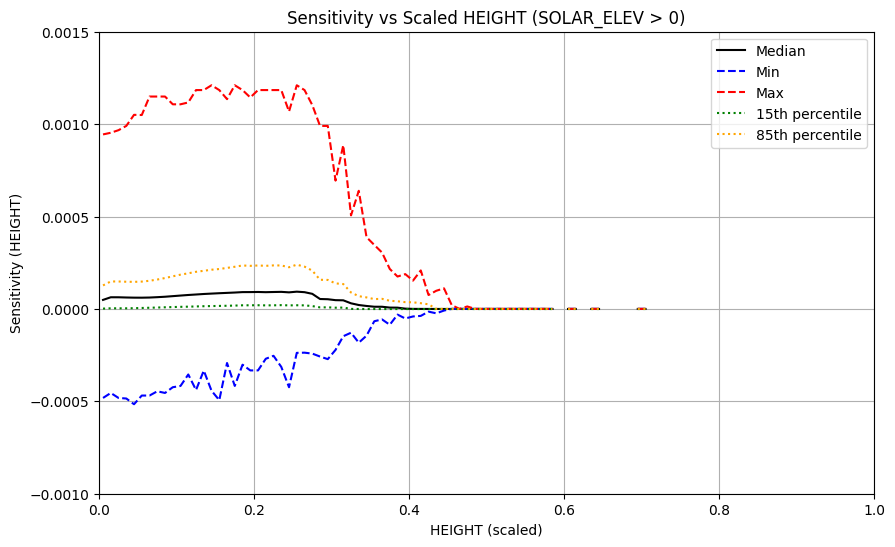

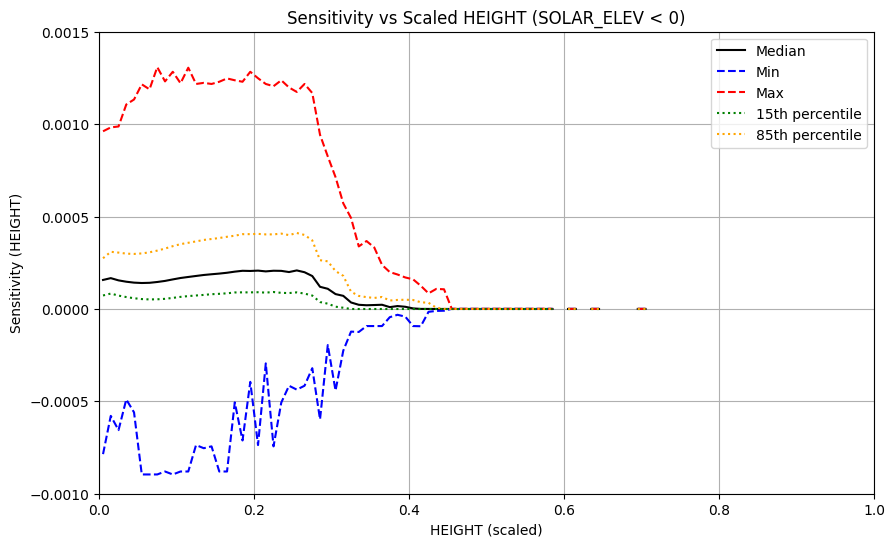

In [9]:
corr_column = "HEIGHT"
def compute_sensitivity_stats(heatmap, bin_centers_sens):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]
        
        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens


# Compute bin centers
bin_centers_height = (height_bins_pop[:-1] + height_bins_pop[1:]) / 2
bin_centers_sens = (sens_bins_pop[:-1] + sens_bins_pop[1:]) / 2

# Get statistics for SOLAR_ELEV > 0
median_pos, min_pos, max_pos, p15_pos, p85_pos = compute_sensitivity_stats(heatmap_count_pos_pop, bin_centers_sens)

# Get statistics for SOLAR_ELEV < 0
median_neg, min_neg, max_neg, p15_neg, p85_neg = compute_sensitivity_stats(heatmap_count_neg_pop, bin_centers_sens)

# Plot for SOLAR_ELEV > 0
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_pos, label='Median', color='black')
plt.plot(bin_centers_height, min_pos, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_pos, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_pos, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_pos, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0, 1)
plt.ylim(-0.001, 0.0015)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs Scaled {corr_column} (SOLAR_ELEV > 0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot for SOLAR_ELEV < 0
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_neg, label='Median', color='black')
plt.plot(bin_centers_height, min_neg, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_neg, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_neg, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_neg, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0, 1)
plt.ylim(-0.001, 0.0015)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs Scaled {corr_column} (SOLAR_ELEV < 0)')
plt.legend()
plt.grid(True)
plt.show()



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 3.66 seconds.
Processed TRAIN chunk 2 in 3.72 seconds.
Processed TRAIN chunk 3 in 3.64 seconds.
Processed TRAIN chunk 4 in 3.61 seconds.
Processed TRAIN chunk 5 in 3.63 seconds.
Processed TRAIN chunk 6 in 3.67 seconds.
Processed TRAIN chunk 7 in 3.61 seconds.
Processed TRAIN chunk 8 in 3.70 seconds.
Processed TRAIN chunk 9 in 3.67 seconds.
Processed TRAIN chunk 10 in 3.72 seconds.
Processed TRAIN chunk 11 in 3.62 seconds.
Processed TRAIN chunk 12 in 3.62 seconds.
Processed TRAIN chunk 13 in 3.61 seconds.
Processed TRAIN chunk 14 in 3.63 seconds.
Processed TRAIN chunk 15 in 3.66 seconds.
Processed TRAIN chunk 16 in 3.65 seconds.
Processed TRAIN chunk 17 in 3.65 seconds.
Processed TRAIN chunk 18 in 3.71 seconds.
Processed TRAIN chunk 19 in 3.77 seconds.
Processed TRAIN chunk 20 in 3.73 seconds.
Processed TRAIN chunk 21 in 3.63 seconds.
Processed TRAIN chunk 22 in 3.66 seconds.
Processed TRAIN chunk 23 in 3.69 seconds.
P

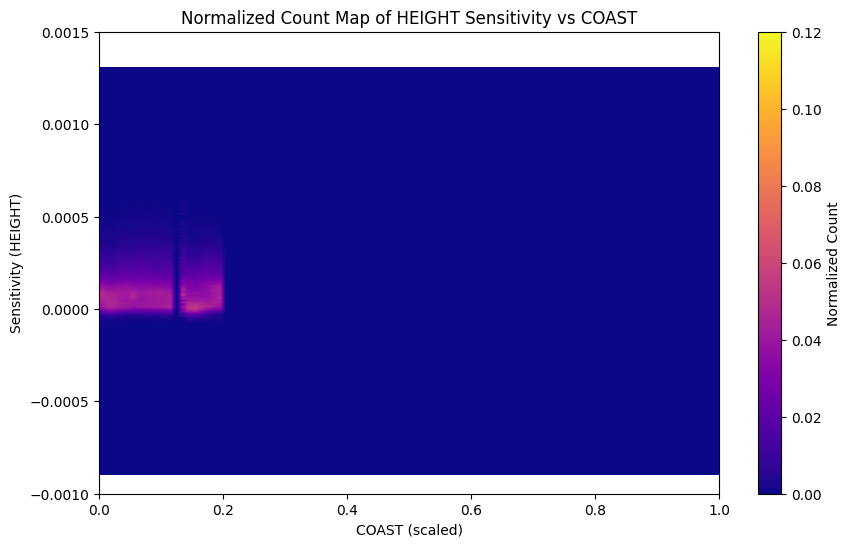

In [10]:
## Height vs COAST ##
# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'COAST'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[1, 'min']
height_max = min_max_df.loc[1, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.00001

height_bins_1 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity across all batches
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins now that we know min/max
sens_bins_1 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators
heatmap_count_1 = np.zeros((len(height_bins_1) - 1, len(sens_bins_1) - 1))
height_bin_counts_1 = np.zeros(len(height_bins_1) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time() 
    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        chunk_counter += 1
        
        
        # Align the batches
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)  # Ensure within [0, 1]

        # 2D histogram accumulation
        hmap, _, _ = np.histogram2d(height_scaled, sensitivities, bins=[height_bins_1, sens_bins_1])
        hcount, _ = np.histogram(height_scaled, bins=height_bins_1)

        # Update accumulators
        heatmap_count_1 += hmap
        height_bin_counts_1 += hcount

        # Calculate time taken for this chunk
        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize
for i in range(len(height_bin_counts_1)):
    if height_bin_counts_1[i] > 0:
        heatmap_count_1[i, :] /= height_bin_counts_1[i]

# Plotting
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_1.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Normalized Count Map of {sensitivity_column} Sensitivity vs {corr_column}')
plt.grid(False)
plt.show()


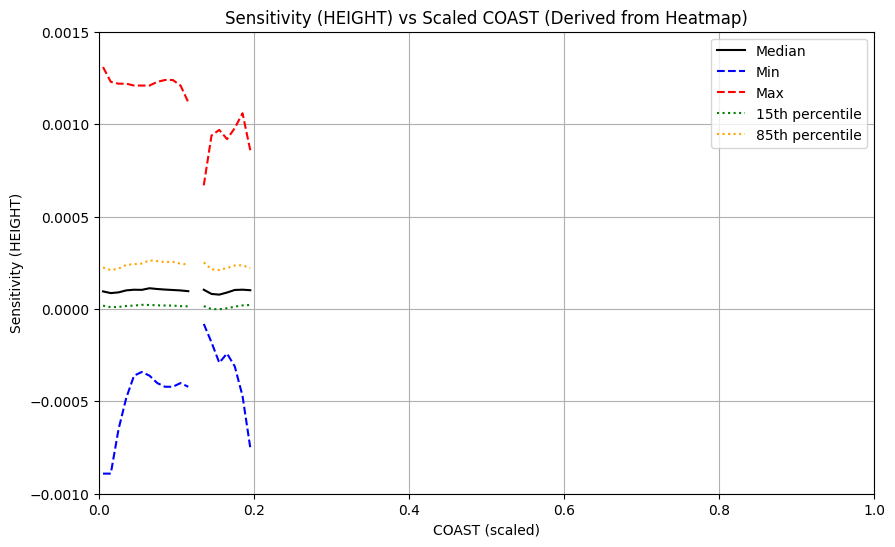

In [11]:
sensitivity_column = "HEIGHT"
corr_column = "COAST"
# Compute bin centers for HEIGHT and sensitivity
bin_centers_height = (height_bins_1[:-1] + height_bins_1[1:]) / 2
bin_centers_sens = (sens_bins_1[:-1] + sens_bins_1[1:]) / 2

# Prepare lists to store computed statistics
median_sens = []
min_sens = []
max_sens = []
p15_sens = []
p85_sens = []

# Compute statistics from the normalized histograms
for i in range(heatmap_count_1.shape[0]):
    counts = heatmap_count_1[i, :]
    
    if counts.sum() == 0:
        median_sens.append(np.nan)
        min_sens.append(np.nan)
        max_sens.append(np.nan)
        p15_sens.append(np.nan)
        p85_sens.append(np.nan)
        continue

    cdf = np.cumsum(counts)
    cdf = cdf / cdf[-1]  # Normalize to [0, 1]
    
    # Get interpolated values at desired percentiles
    median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
    p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
    p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

    # Min/max from non-zero counts
    nonzero_idx = np.where(counts > 0)[0]
    min_sens.append(bin_centers_sens[nonzero_idx[0]])
    max_sens.append(bin_centers_sens[nonzero_idx[-1]])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_sens, label='Median', color='black')
plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

plt.xlabel(f'{corr_column} (scaled)')
plt.xlim(0,1)
plt.ylim(-0.001, 0.0015)
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} (Derived from Heatmap)')
plt.legend()
plt.grid(True)
plt.show()



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


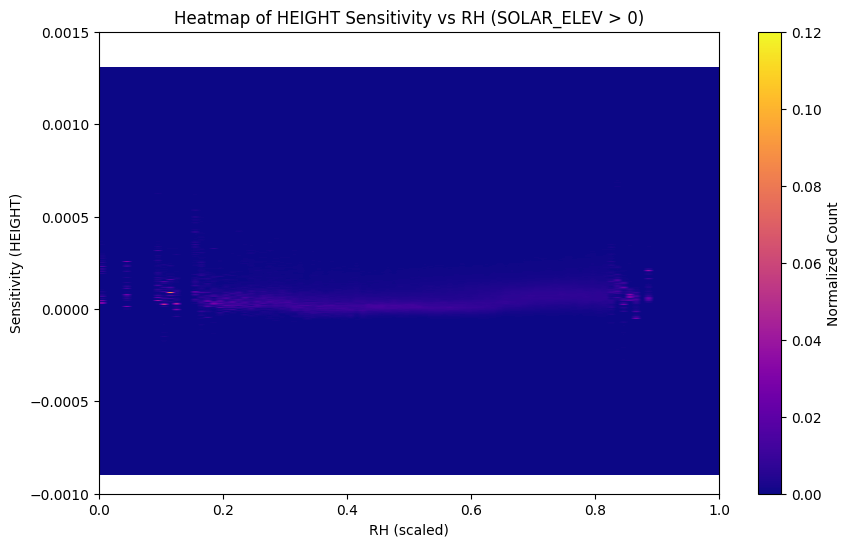

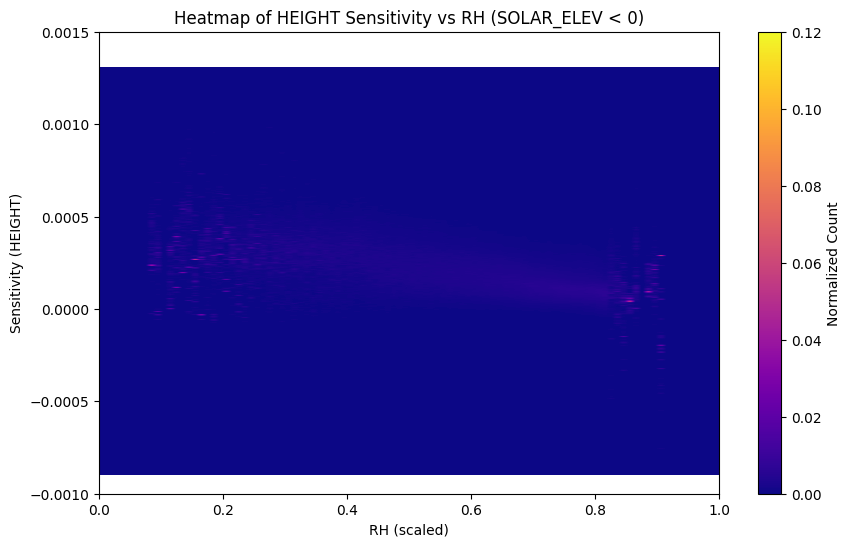

In [5]:
## HEIGHT vs RH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'RH'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[5, 'min']
height_max = min_max_df.loc[5, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


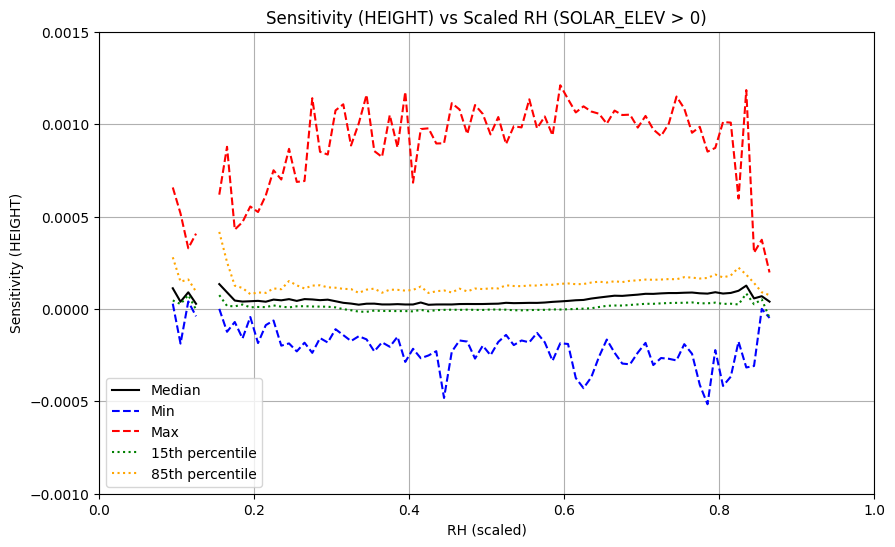

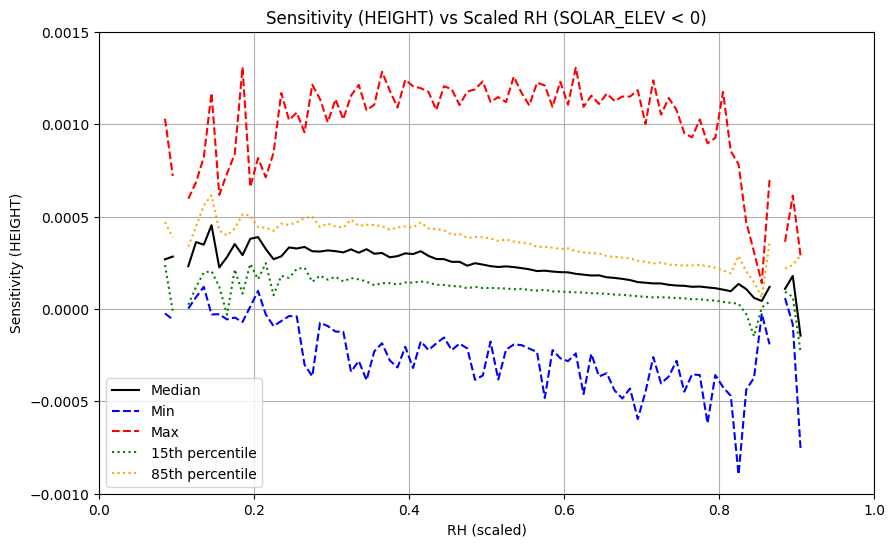

In [6]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


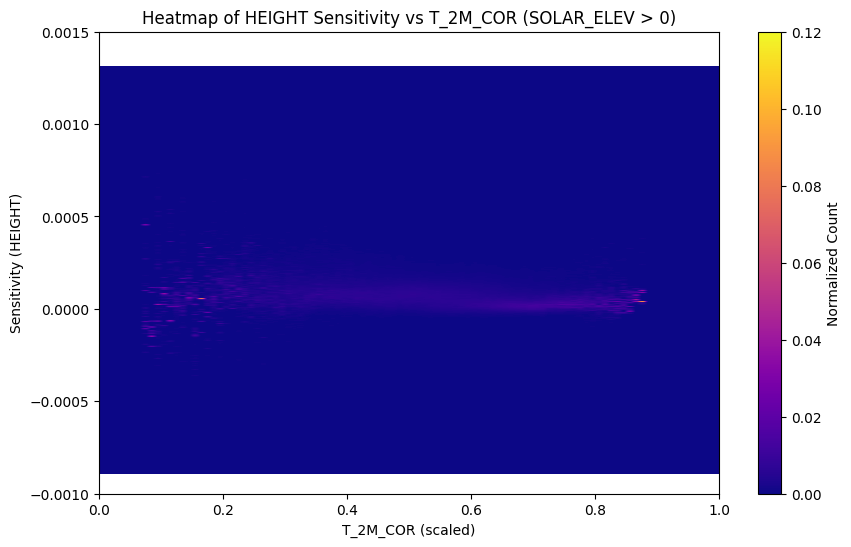

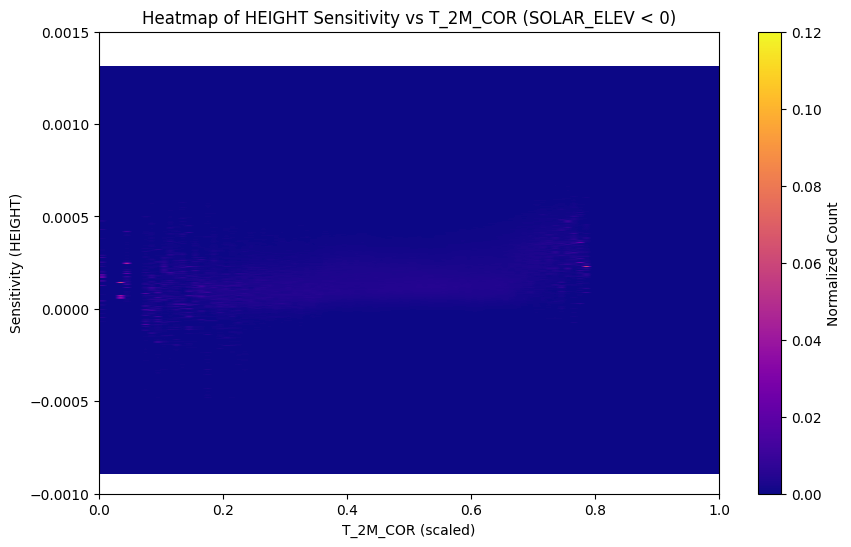

In [14]:
## HEIGHT vs T_2M_COR with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'T_2M_COR'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[9, 'min']
height_max = min_max_df.loc[9, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


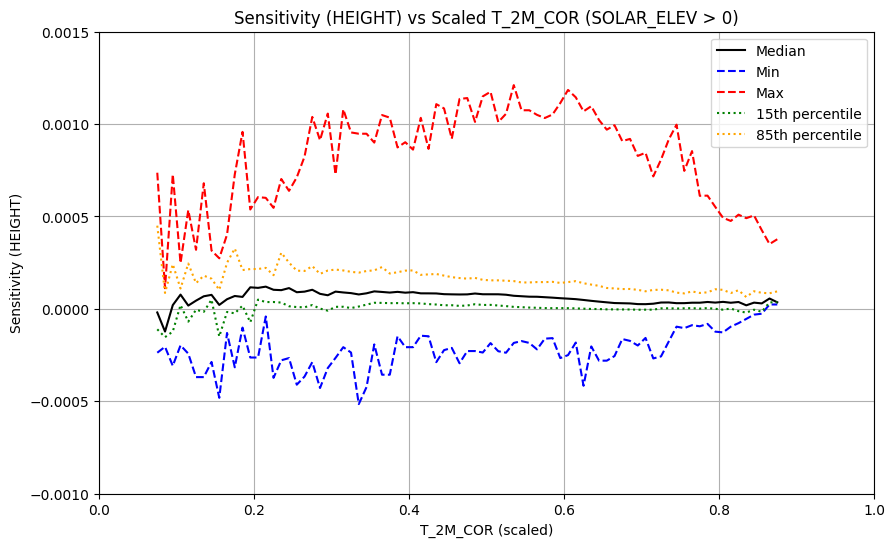

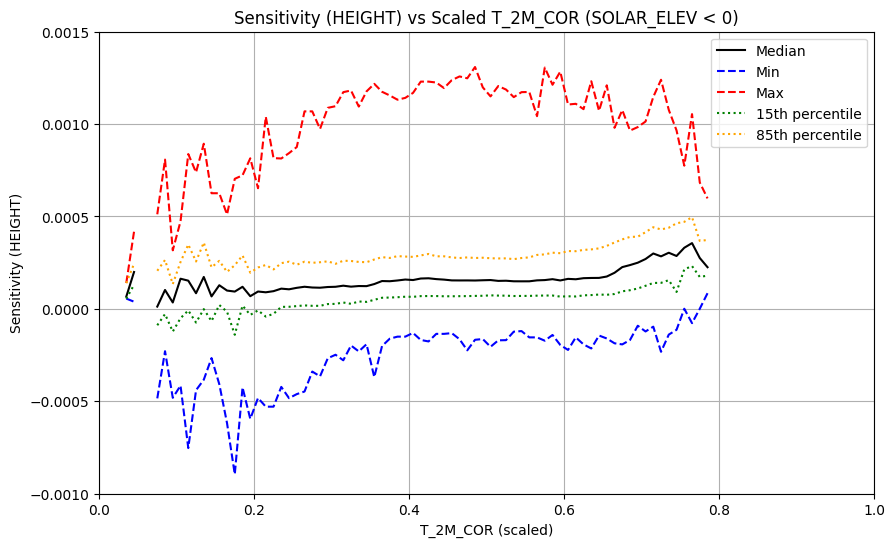

In [15]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


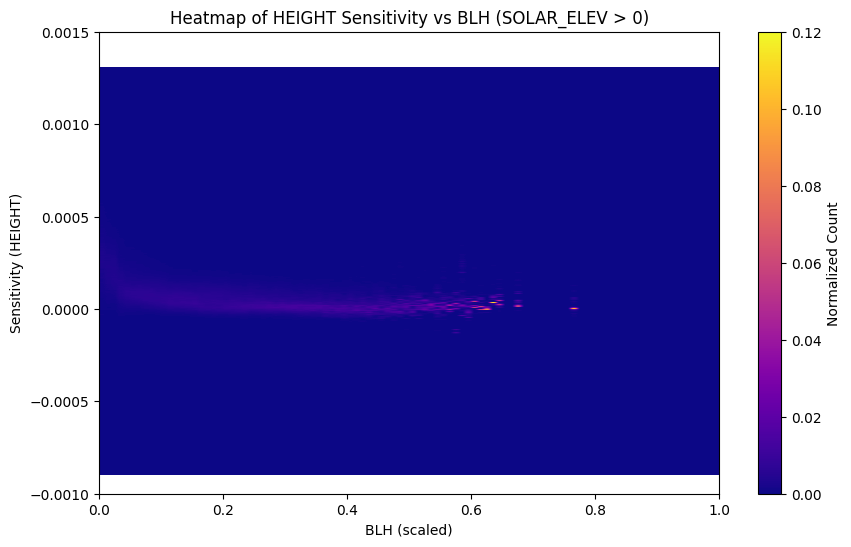

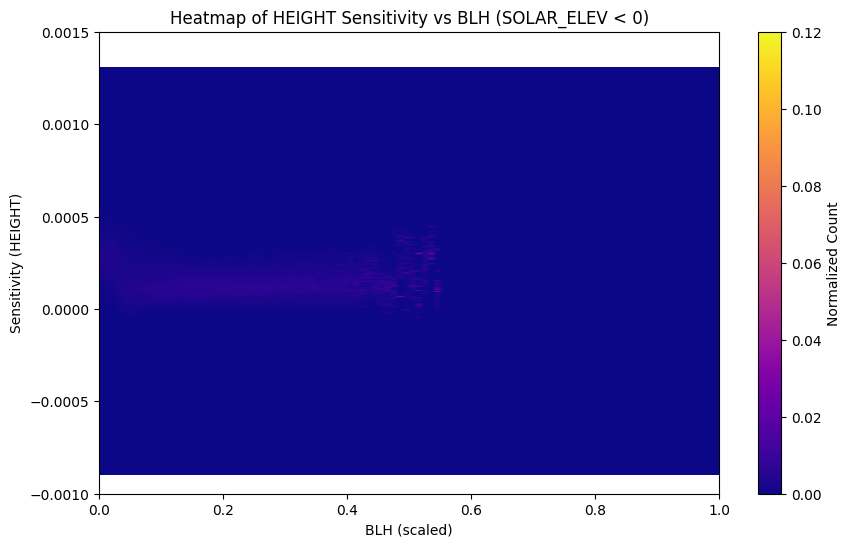

In [16]:
## HEIGHT vs BLH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'BLH'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[11, 'min']
height_max = min_max_df.loc[11, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


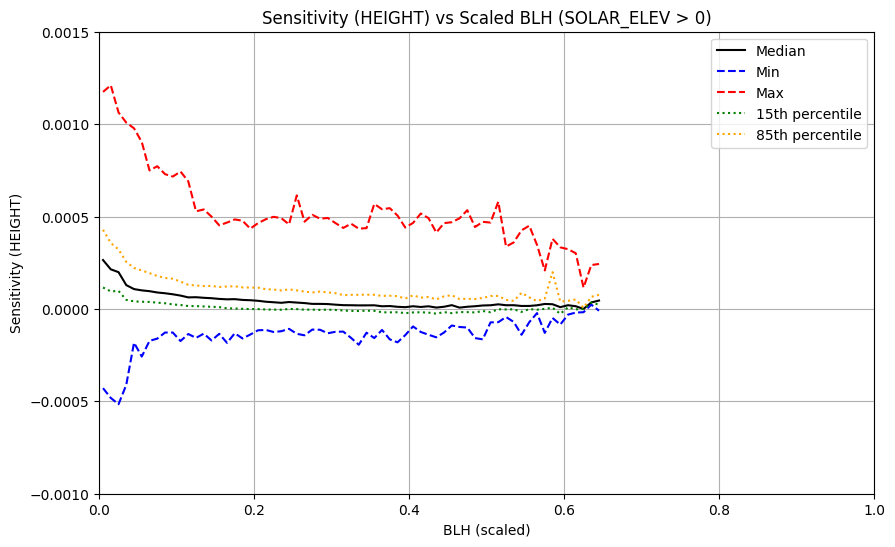

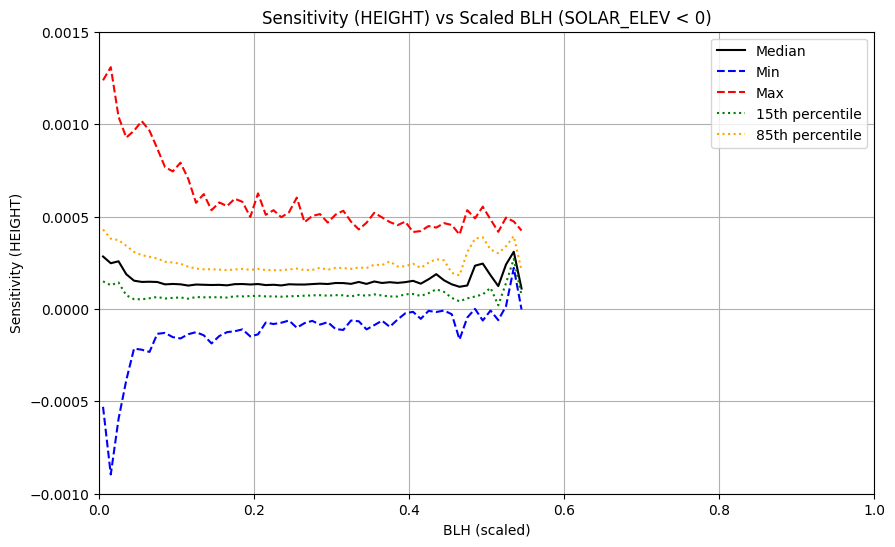

In [17]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


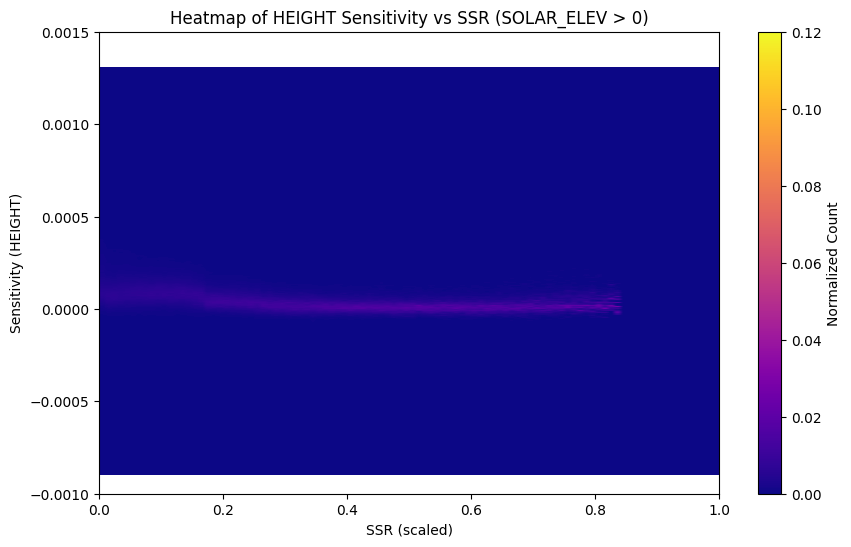

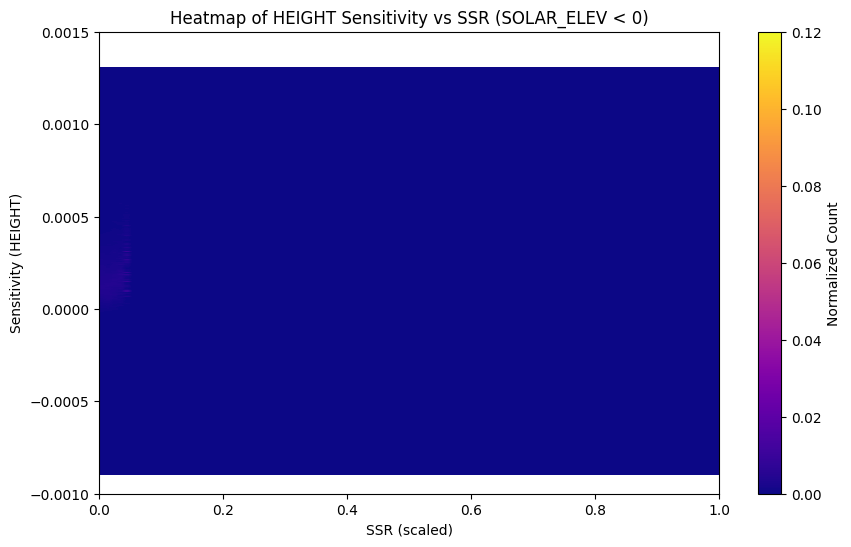

In [18]:
## HEIGHT vs SSR with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'SSR'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[12, 'min']
height_max = min_max_df.loc[12, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


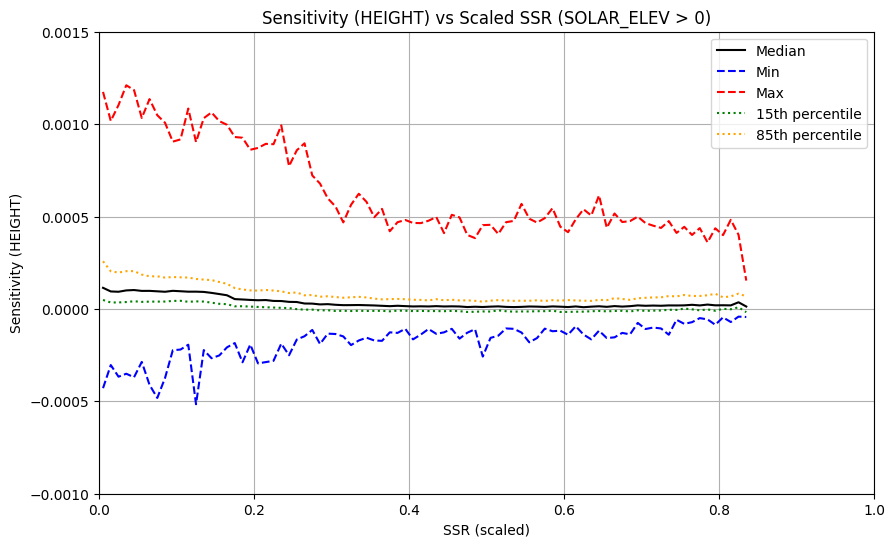

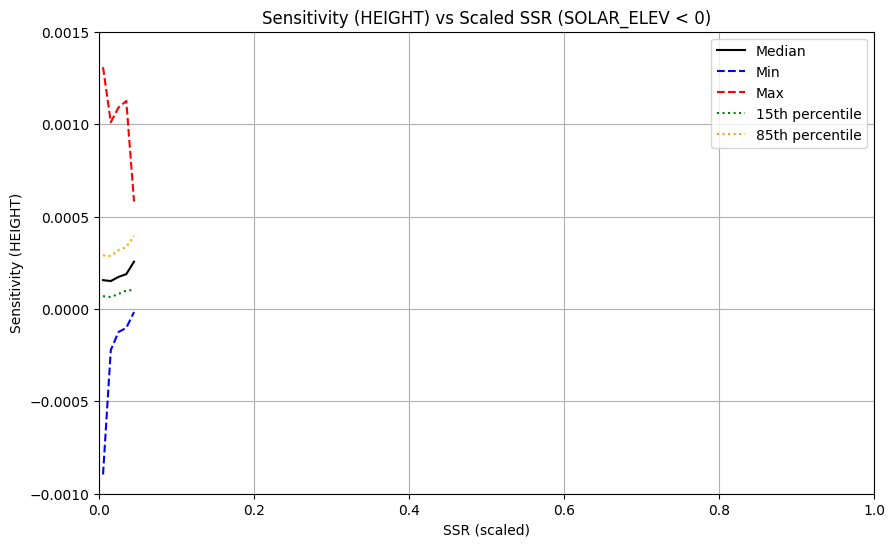

In [19]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


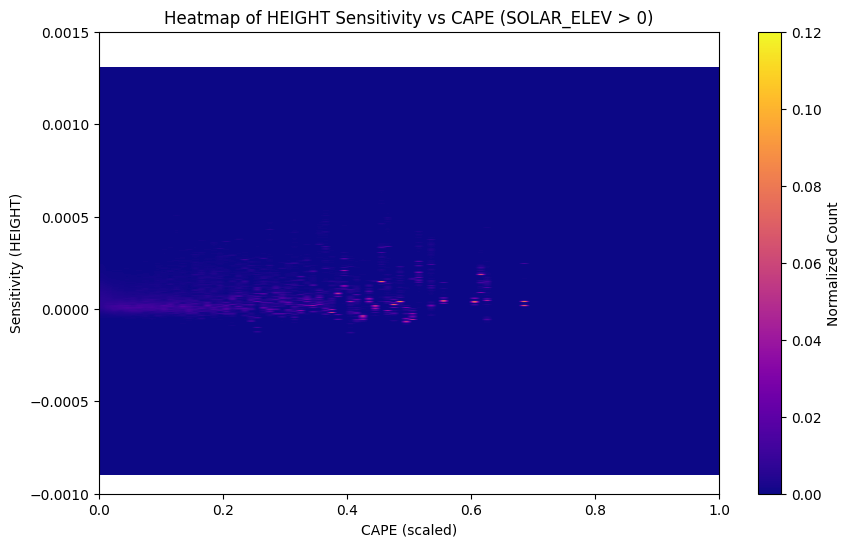

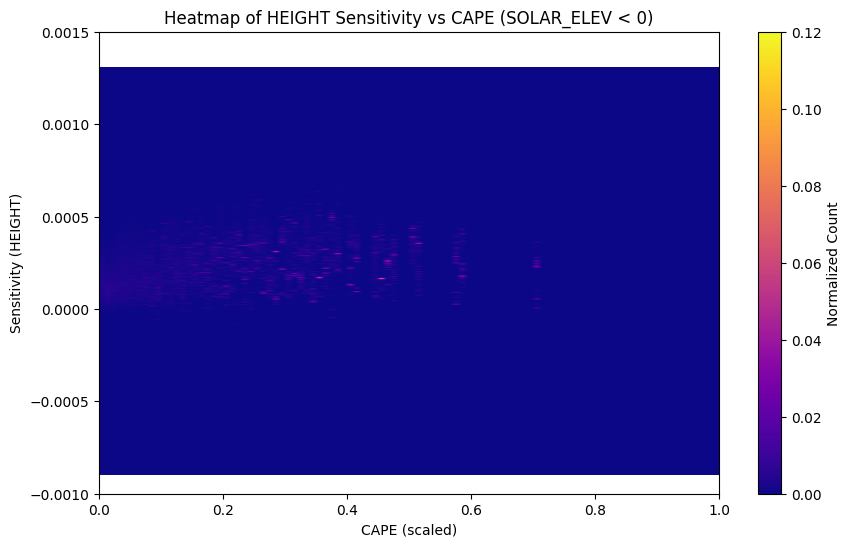

In [20]:
## HEIGHT vs CAPE with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'HEIGHT'
corr_column = 'CAPE'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[15, 'min']
height_max = min_max_df.loc[15, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


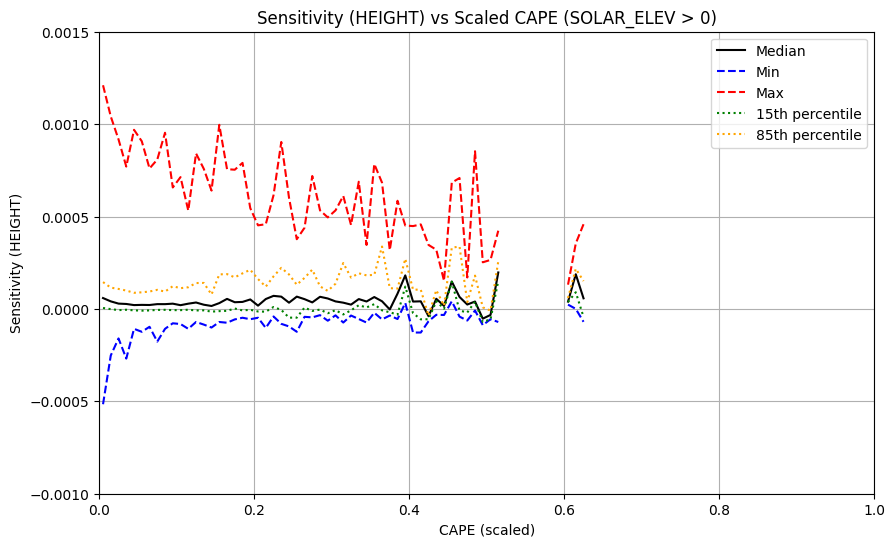

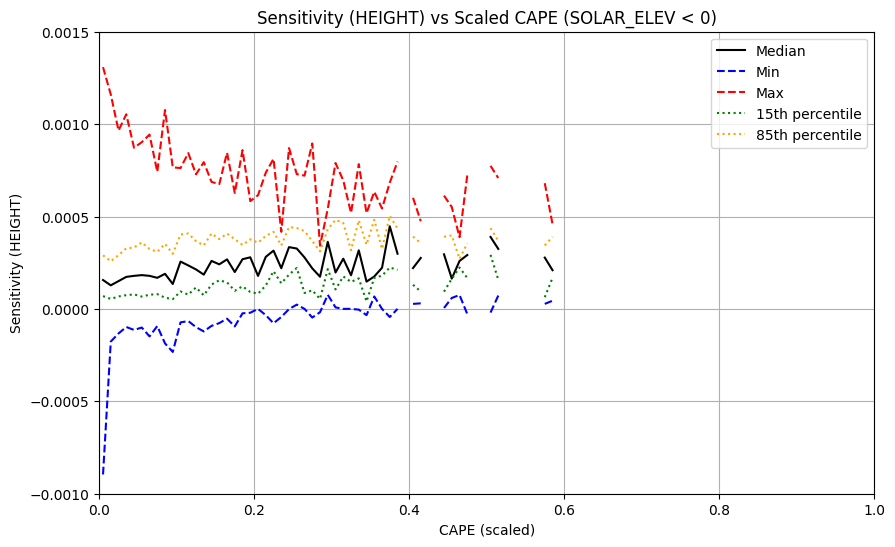

In [21]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 4.23 seconds.
Processed TRAIN chunk 2 in 4.62 seconds.
Processed TRAIN chunk 3 in 4.35 seconds.
Processed TRAIN chunk 4 in 4.41 seconds.
Processed TRAIN chunk 5 in 4.71 seconds.
Processed TRAIN chunk 6 in 4.94 seconds.
Processed TRAIN chunk 7 in 4.94 seconds.
Processed TRAIN chunk 8 in 4.40 seconds.
Processed TRAIN chunk 9 in 4.10 seconds.
Processed TRAIN chunk 10 in 4.16 seconds.
Processed TRAIN chunk 11 in 4.12 seconds.
Processed TRAIN chunk 12 in 3.94 seconds.
Processed TRAIN chunk 13 in 3.98 seconds.
Processed TRAIN chunk 14 in 4.02 seconds.
Processed TRAIN chunk 15 in 4.08 seconds.
Processed TRAIN chunk 16 in 4.26 seconds.
Processed TRAIN chunk 17 in 4.05 seconds.
Processed TRAIN chunk 18 in 4.28 seconds.
Processed TRAIN chunk 19 in 4.21 seconds.
Processed TRAIN chunk 20 in 4.62 seconds.
Processed TRAIN chunk 21 in 4.55 seconds.
Processed TRAIN chunk 22 in 4.47 seconds.
Processed TRAIN chunk 23 in 4.26 seconds.
P

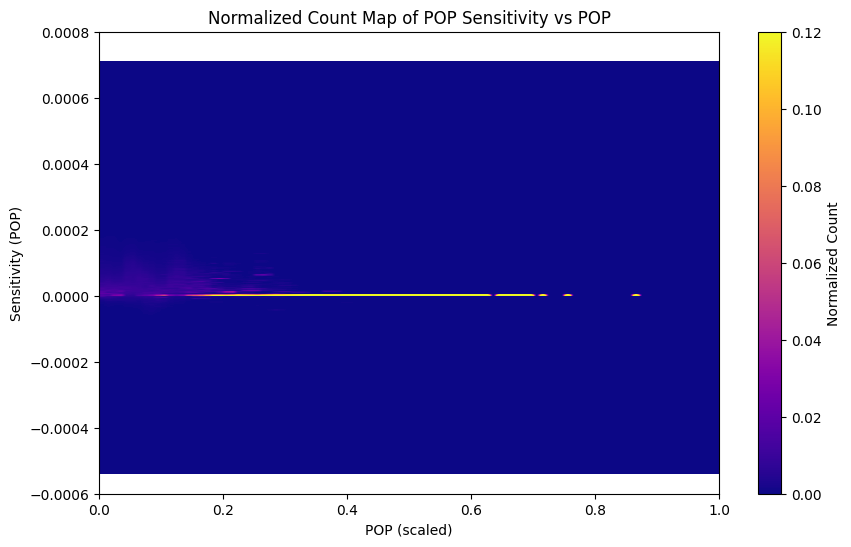

In [58]:
# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[4, 'min']
height_max = min_max_df.loc[4, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity across all batches
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins now that we know min/max
sens_bins_pop = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators
heatmap_count_pop = np.zeros((len(height_bins_pop) - 1, len(sens_bins_pop) - 1))
height_bin_counts_pop = np.zeros(len(height_bins_pop) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['POP'], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time() 
    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        chunk_counter += 1
        
        
        # Align the batches
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk['POP'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)  # Ensure within [0, 1]

        # 2D histogram accumulation
        hmap, _, _ = np.histogram2d(height_scaled, sensitivities, bins=[height_bins_pop, sens_bins_pop])
        hcount, _ = np.histogram(height_scaled, bins=height_bins_pop)

        # Update accumulators
        heatmap_count_pop += hmap
        height_bin_counts_pop += hcount

        # Calculate time taken for this chunk
        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize
for i in range(len(height_bin_counts_pop)):
    if height_bin_counts_pop[i] > 0:
        heatmap_count_pop[i, :] /= height_bin_counts_pop[i]

# Plotting
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_pop.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel('POP (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Normalized Count Map of {sensitivity_column} Sensitivity vs POP')
plt.grid(False)
plt.show()


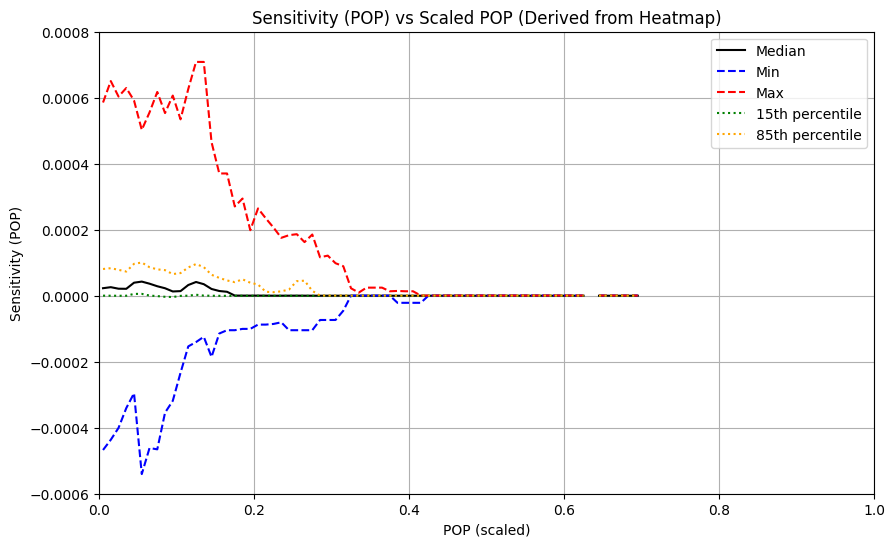

In [59]:
sensitivity_column = "POP"
corr_column = "POP"
# Compute bin centers for HEIGHT and sensitivity
bin_centers_height = (height_bins_pop[:-1] + height_bins_pop[1:]) / 2
bin_centers_sens = (sens_bins_pop[:-1] + sens_bins_pop[1:]) / 2

# Prepare lists to store computed statistics
median_sens = []
min_sens = []
max_sens = []
p15_sens = []
p85_sens = []

# Compute statistics from the normalized histograms
for i in range(heatmap_count_pop.shape[0]):
    counts = heatmap_count_pop[i, :]
    
    if counts.sum() == 0:
        median_sens.append(np.nan)
        min_sens.append(np.nan)
        max_sens.append(np.nan)
        p15_sens.append(np.nan)
        p85_sens.append(np.nan)
        continue

    cdf = np.cumsum(counts)
    cdf = cdf / cdf[-1]  # Normalize to [0, 1]
    
    # Get interpolated values at desired percentiles
    median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
    p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
    p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

    # Min/max from non-zero counts
    nonzero_idx = np.where(counts > 0)[0]
    min_sens.append(bin_centers_sens[nonzero_idx[0]])
    max_sens.append(bin_centers_sens[nonzero_idx[-1]])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_sens, label='Median', color='black')
plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0,1)
plt.ylim(-0.0006, 0.0008)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} (Derived from Heatmap)')
plt.legend()
plt.grid(True)
plt.show()



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 4.03 seconds.
Processed TRAIN chunk 2 in 4.14 seconds.
Processed TRAIN chunk 3 in 3.99 seconds.
Processed TRAIN chunk 4 in 3.94 seconds.
Processed TRAIN chunk 5 in 3.91 seconds.
Processed TRAIN chunk 6 in 3.96 seconds.
Processed TRAIN chunk 7 in 4.08 seconds.
Processed TRAIN chunk 8 in 4.19 seconds.
Processed TRAIN chunk 9 in 4.02 seconds.
Processed TRAIN chunk 10 in 3.98 seconds.
Processed TRAIN chunk 11 in 3.88 seconds.
Processed TRAIN chunk 12 in 3.93 seconds.
Processed TRAIN chunk 13 in 3.95 seconds.
Processed TRAIN chunk 14 in 4.09 seconds.
Processed TRAIN chunk 15 in 4.08 seconds.
Processed TRAIN chunk 16 in 3.98 seconds.
Processed TRAIN chunk 17 in 4.14 seconds.
Processed TRAIN chunk 18 in 4.01 seconds.
Processed TRAIN chunk 19 in 4.00 seconds.
Processed TRAIN chunk 20 in 3.97 seconds.
Processed TRAIN chunk 21 in 3.94 seconds.
Processed TRAIN chunk 22 in 3.97 seconds.
Processed TRAIN chunk 23 in 4.00 seconds.
P

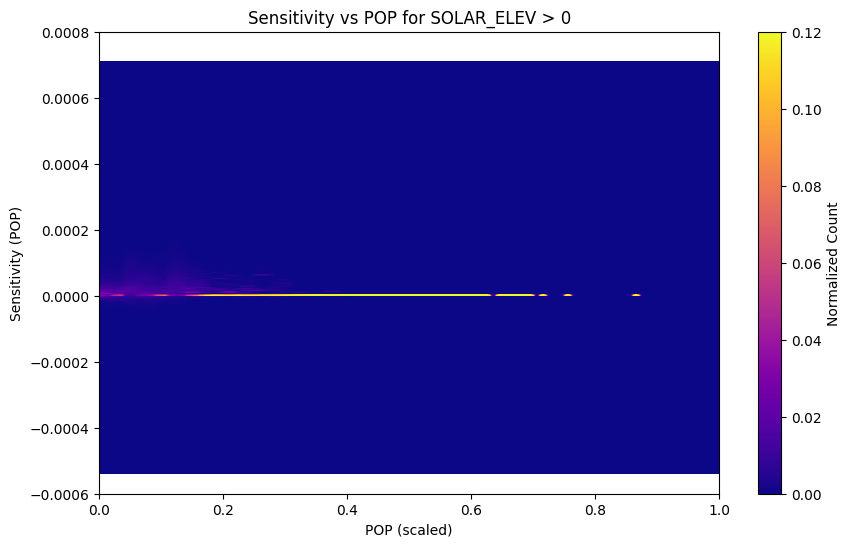

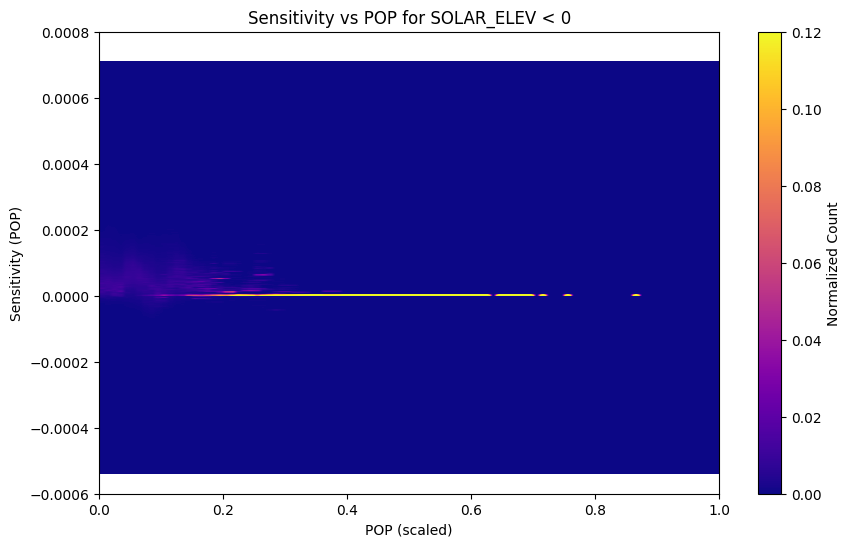

In [60]:
# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[4, 'min']
height_max = min_max_df.loc[4, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity across all batches
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins now that we know min/max
sens_bins_pop = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for two conditions
heatmap_count_pos_pop = np.zeros((len(height_bins_pop) - 1, len(sens_bins_pop) - 1))
height_bin_counts_pos = np.zeros(len(height_bins_pop) - 1)

heatmap_count_neg_pop = np.zeros((len(height_bins_pop) - 1, len(sens_bins_pop) - 1))
height_bin_counts_neg = np.zeros(len(height_bins_pop) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['POP', 'SOLAR_ELEV'], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time()
    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        chunk_counter += 1
        
        # Extract columns
        sensitivities = dds_chunk[sensitivity_column].values
        pops = cities_chunk['POP'].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap_count, height_bin_counts in [
            (mask_pos, heatmap_count_pos_pop, height_bin_counts_pos),
            (mask_neg, heatmap_count_neg_pop, height_bin_counts_neg)
        ]:
            if not np.any(mask):
                continue  # Skip if no data in this condition

            sens_filtered = sensitivities[mask]
            pop_filtered = pops[mask]

            # Scale POP
            pop_scaled = (pop_filtered - height_min) / (height_max - height_min)
            pop_scaled = np.clip(pop_scaled, 0, 1)

            # 2D histogram accumulation
            hmap, _, _ = np.histogram2d(pop_scaled, sens_filtered, bins=[height_bins_pop, sens_bins_pop])
            hcount, _ = np.histogram(pop_scaled, bins=height_bins_pop)

            heatmap_count += hmap
            height_bin_counts += hcount

        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize both heatmaps
def normalize_heatmap(heatmap, bin_counts):
    for i in range(len(bin_counts)):
        if bin_counts[i] > 0:
            heatmap[i, :] /= bin_counts[i]
    return heatmap

heatmap_count_pos_pop = normalize_heatmap(heatmap_count_pos_pop, height_bin_counts_pos)
heatmap_count_neg_pop = normalize_heatmap(heatmap_count_neg_pop, height_bin_counts_neg)

# Plotting for SOLAR_ELEV > 0
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_pos_pop.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel('POP (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs POP for SOLAR_ELEV > 0')
plt.ylim(-0.0006, 0.0008)
plt.grid(False)
plt.show()

# Plotting for SOLAR_ELEV < 0
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_neg_pop.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma',vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel('POP (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs POP for SOLAR_ELEV < 0')
plt.ylim(-0.0006, 0.0008)
plt.grid(False)
plt.show()


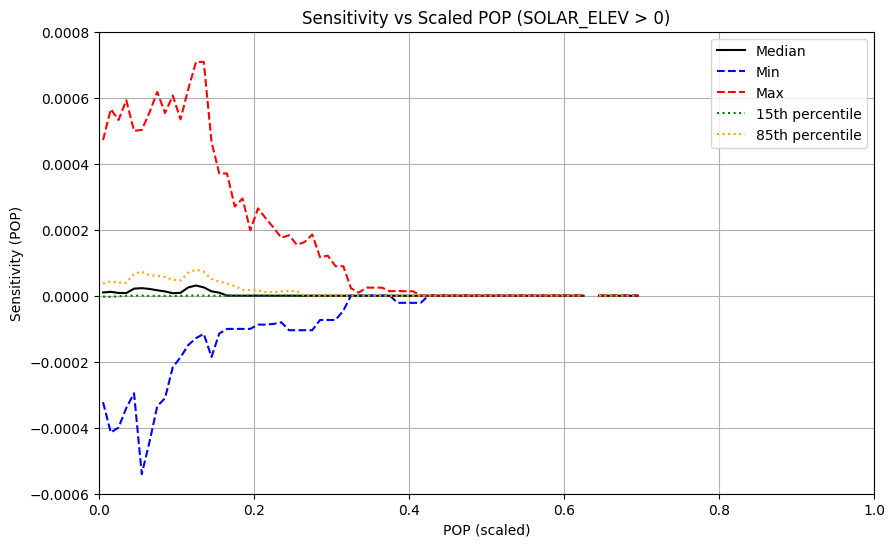

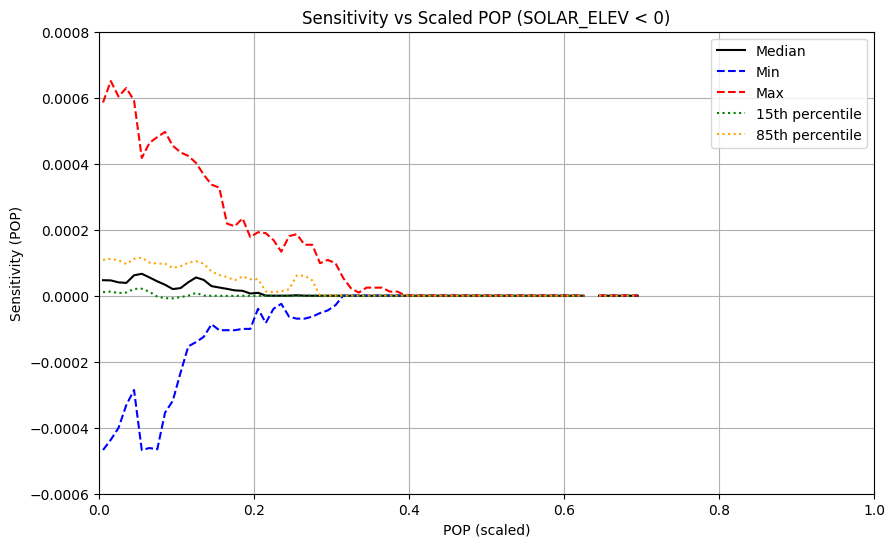

In [61]:
def compute_sensitivity_stats(heatmap, bin_centers_sens):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]
        
        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens


# Compute bin centers
bin_centers_height = (height_bins_pop[:-1] + height_bins_pop[1:]) / 2
bin_centers_sens = (sens_bins_pop[:-1] + sens_bins_pop[1:]) / 2

# Get statistics for SOLAR_ELEV > 0
median_pos, min_pos, max_pos, p15_pos, p85_pos = compute_sensitivity_stats(heatmap_count_pos_pop, bin_centers_sens)

# Get statistics for SOLAR_ELEV < 0
median_neg, min_neg, max_neg, p15_neg, p85_neg = compute_sensitivity_stats(heatmap_count_neg_pop, bin_centers_sens)

# Plot for SOLAR_ELEV > 0
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_pos, label='Median', color='black')
plt.plot(bin_centers_height, min_pos, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_pos, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_pos, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_pos, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0, 1)
plt.ylim(-0.0006, 0.0008)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs Scaled {corr_column} (SOLAR_ELEV > 0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot for SOLAR_ELEV < 0
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_neg, label='Median', color='black')
plt.plot(bin_centers_height, min_neg, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_neg, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_neg, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_neg, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0, 1)
plt.ylim(-0.0006, 0.0008)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs Scaled {corr_column} (SOLAR_ELEV < 0)')
plt.legend()
plt.grid(True)
plt.show()



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


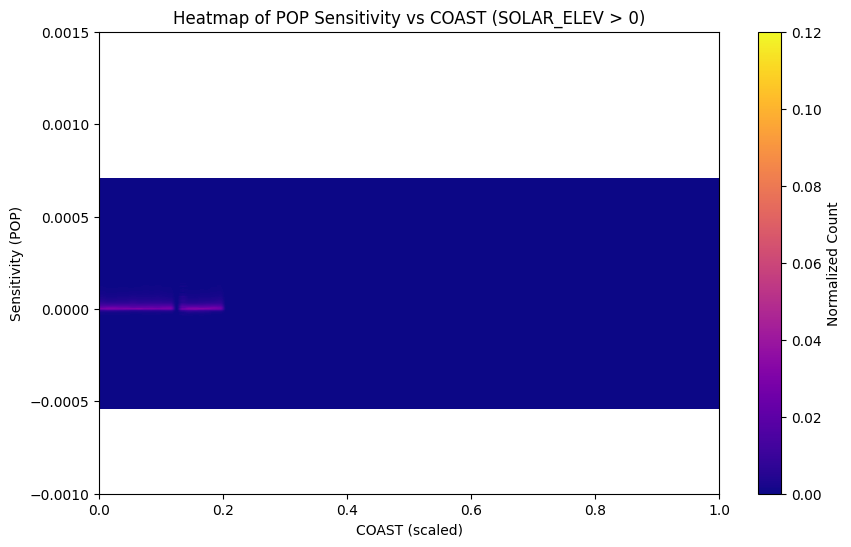

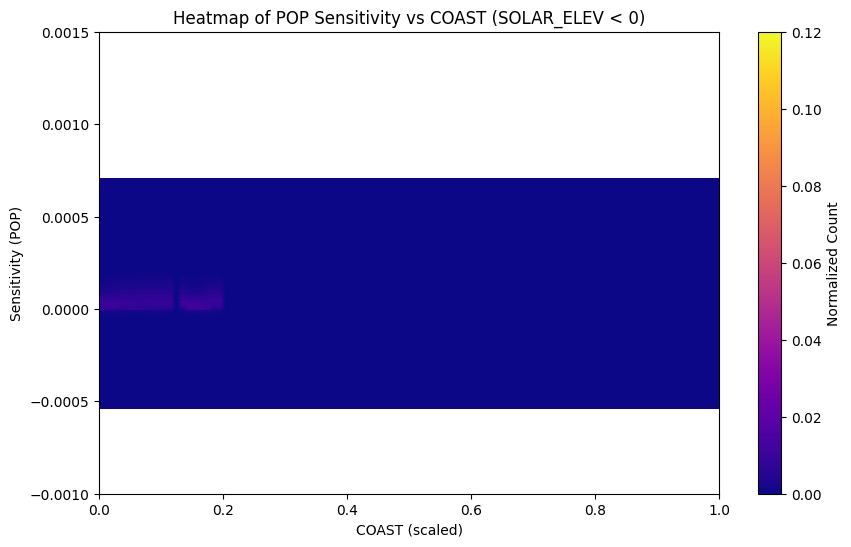

In [ ]:
## POP vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'COAST'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[1, 'min']
height_max = min_max_df.loc[1, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


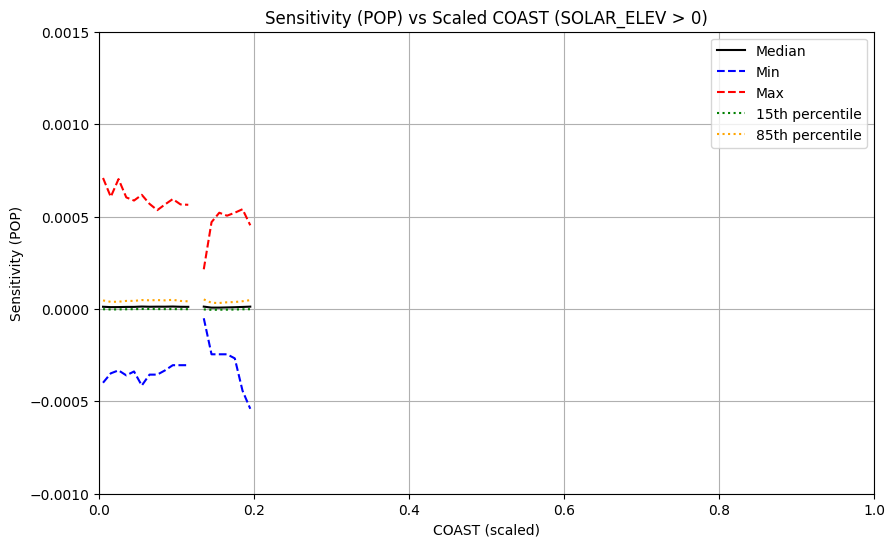

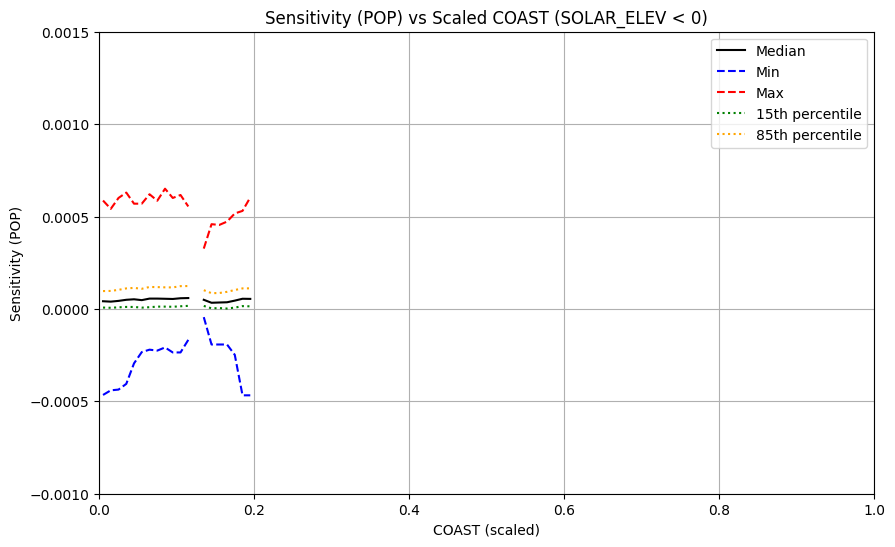

In [27]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


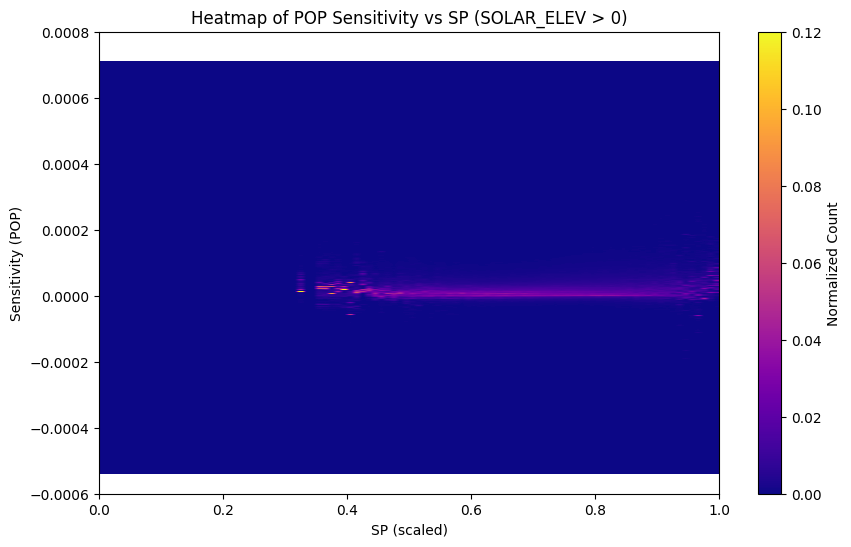

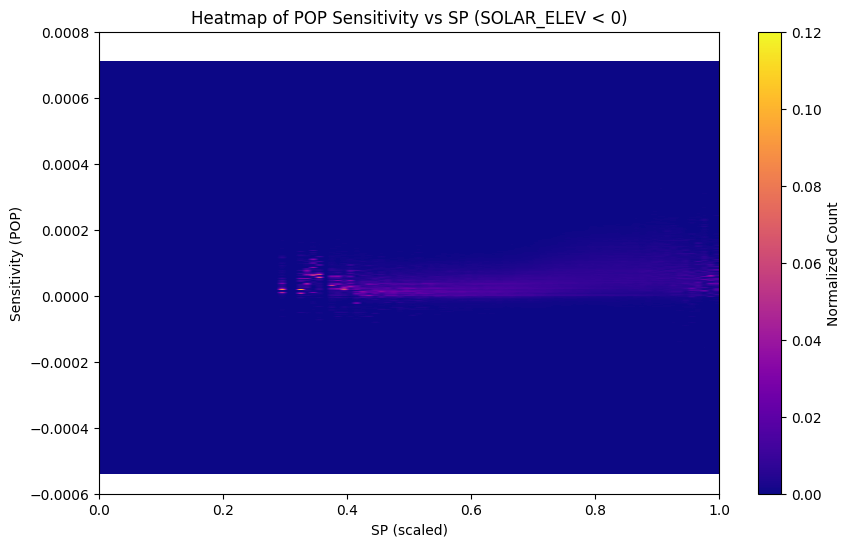

In [62]:
## POP vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'SP'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[6, 'min']
height_max = min_max_df.loc[6, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


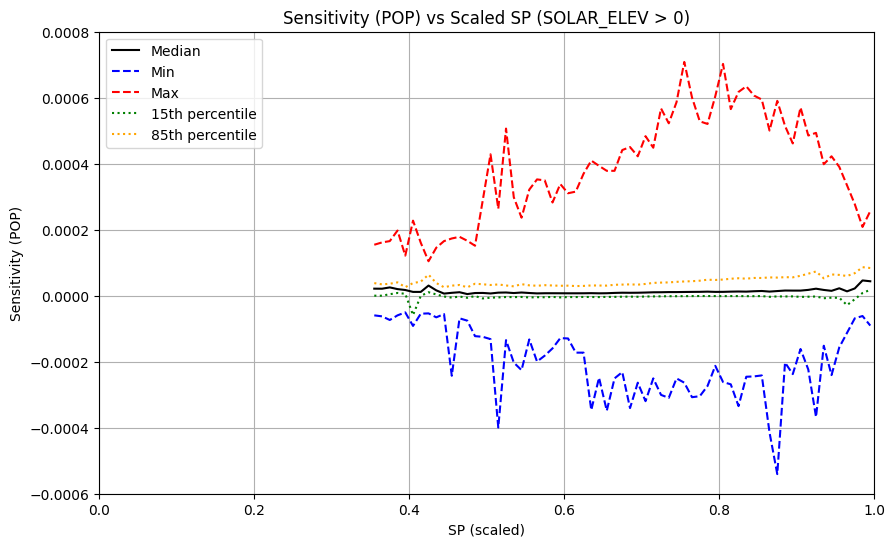

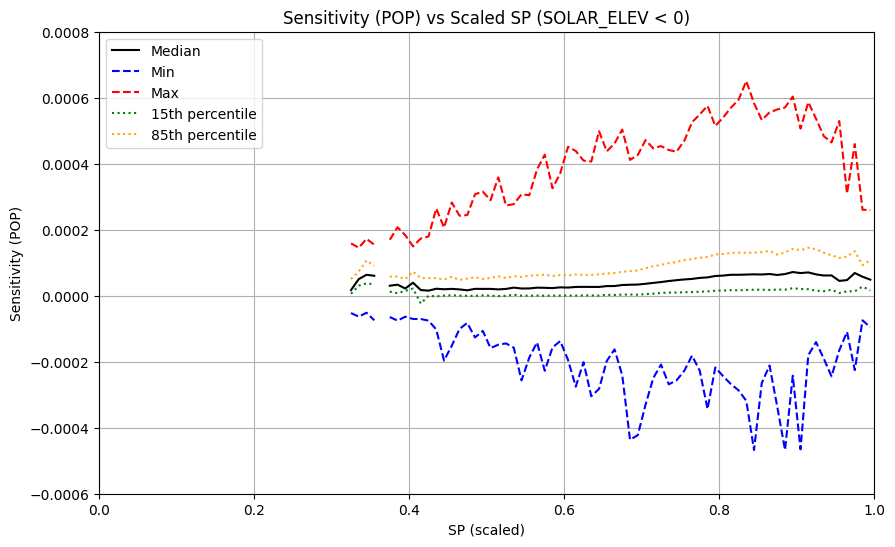

In [63]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


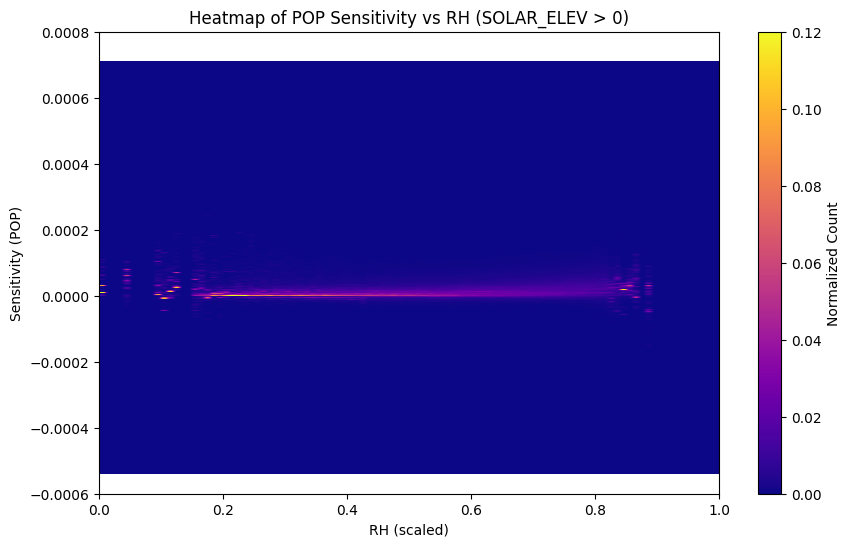

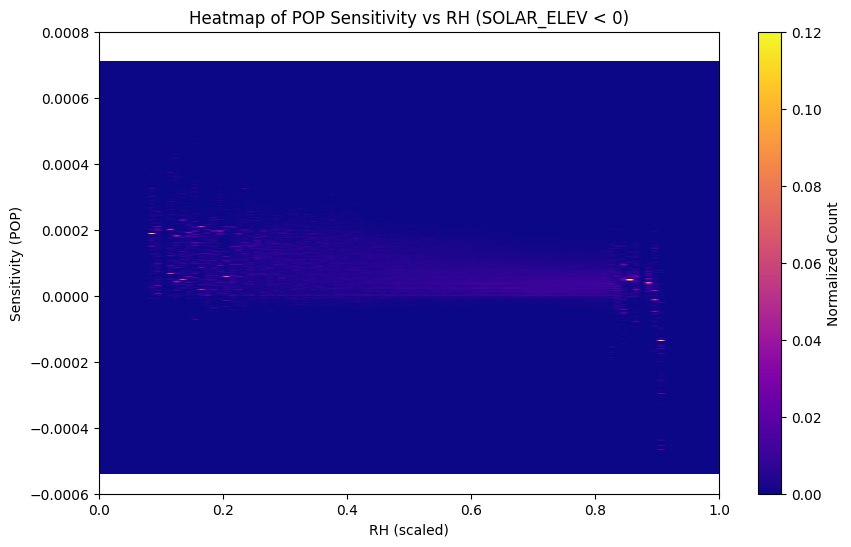

In [64]:
## POP vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'RH'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[5, 'min']
height_max = min_max_df.loc[5, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


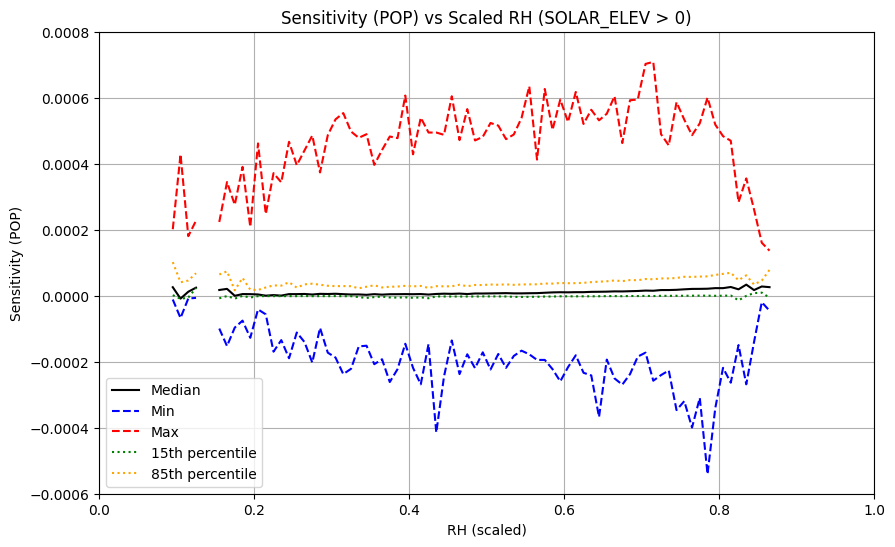

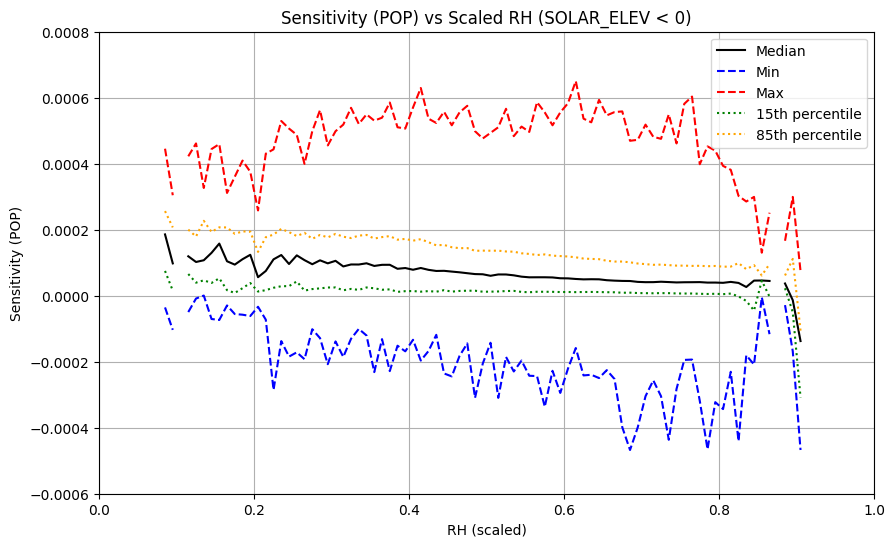

In [65]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


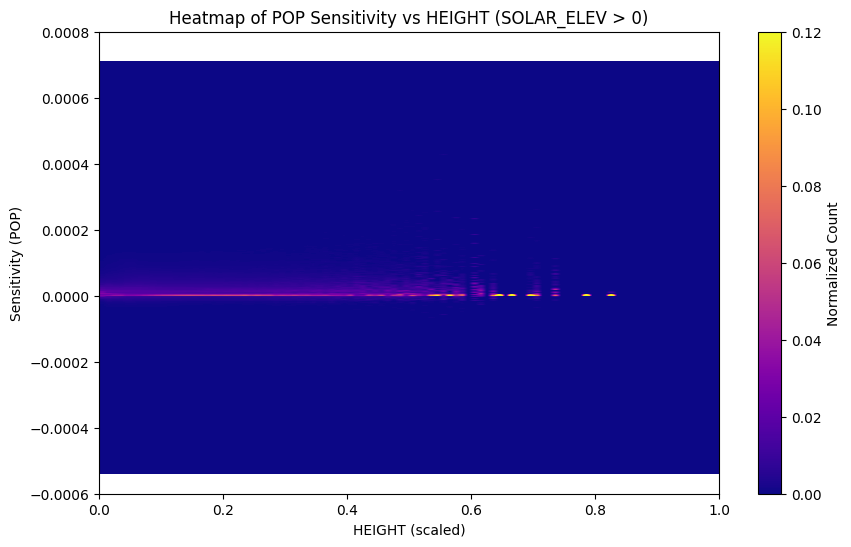

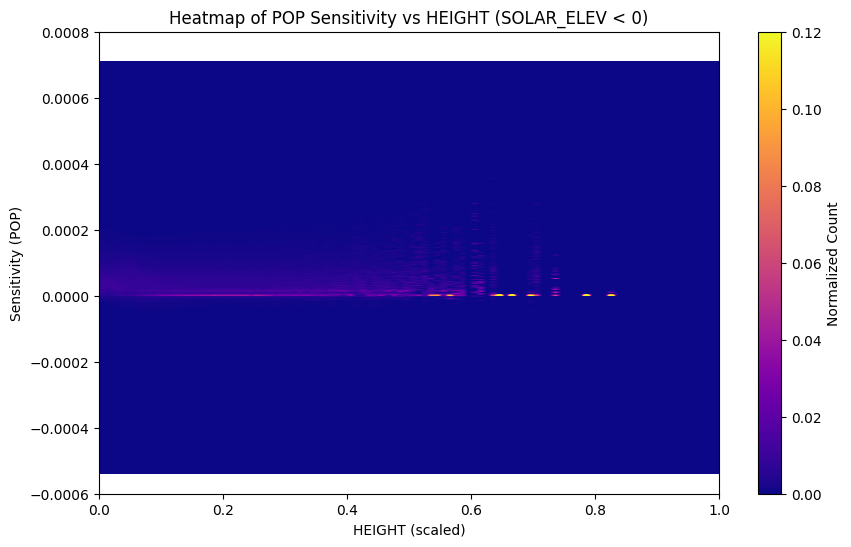

In [3]:
## POP vs HEIGHT with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'HEIGHT'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[0, 'min']
height_max = min_max_df.loc[0, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


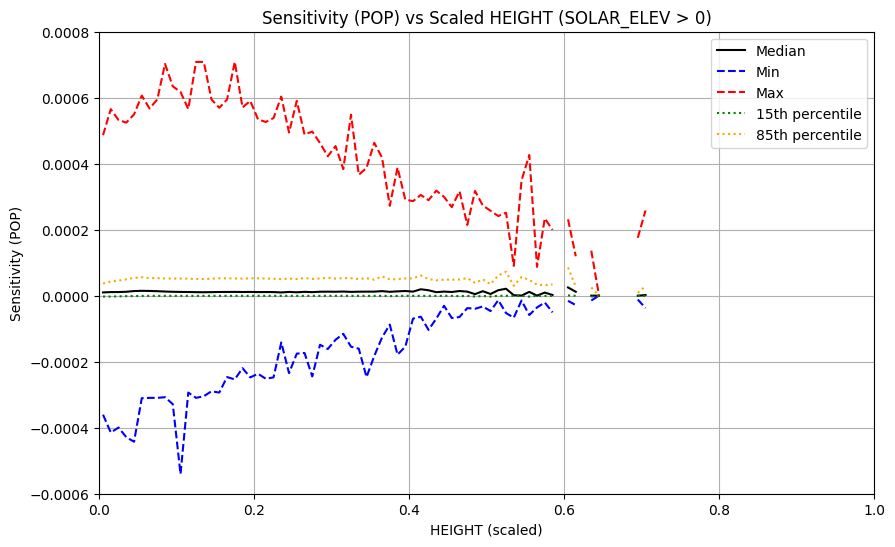

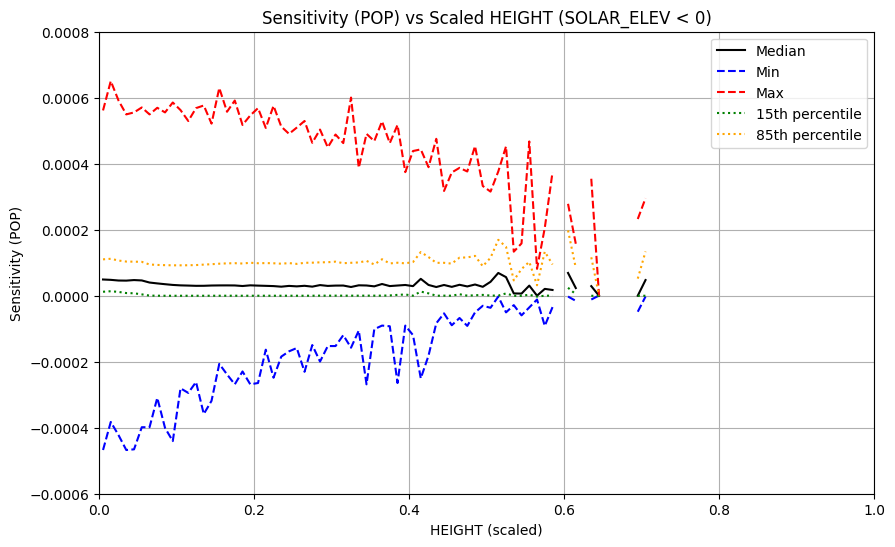

In [4]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


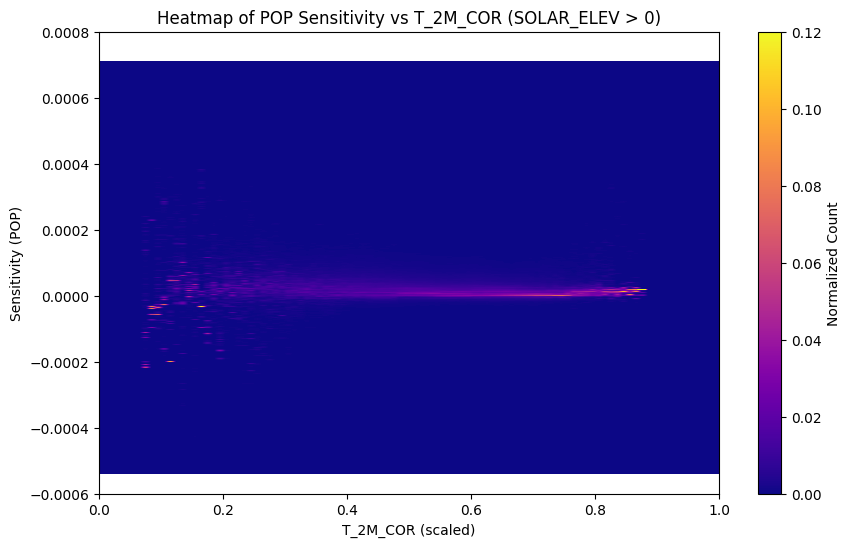

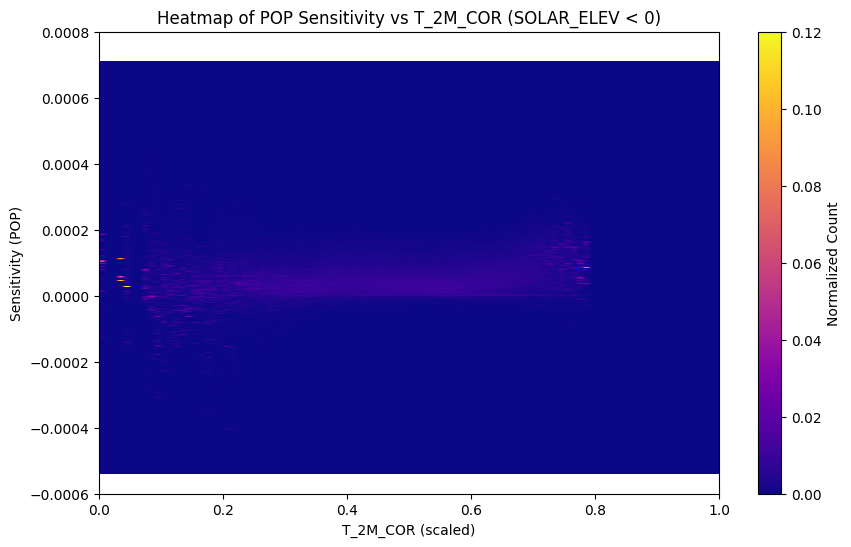

In [66]:
## POP vs T_2M_COR with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'T_2M_COR'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[9, 'min']
height_max = min_max_df.loc[9, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


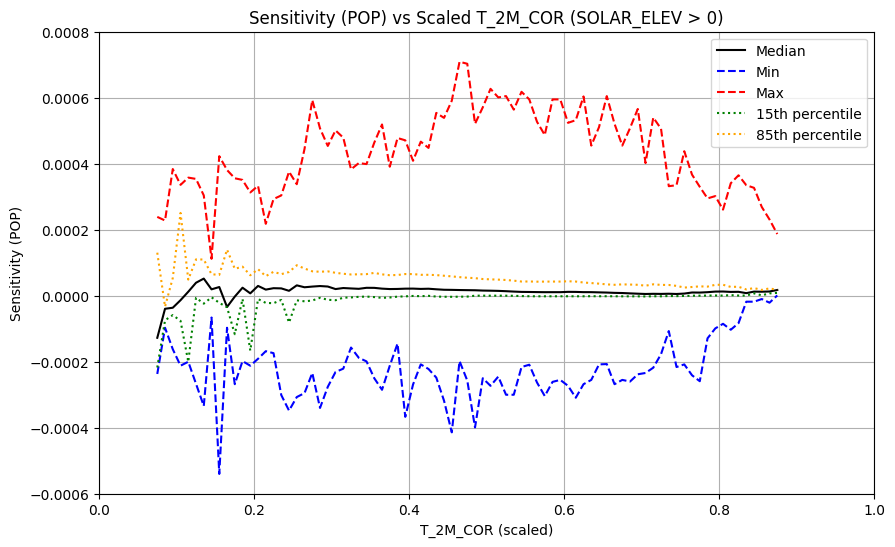

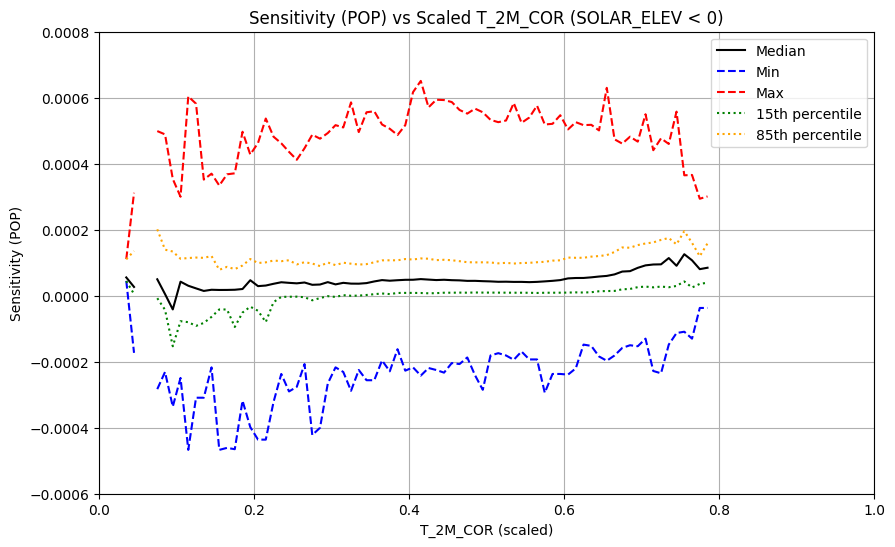

In [67]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


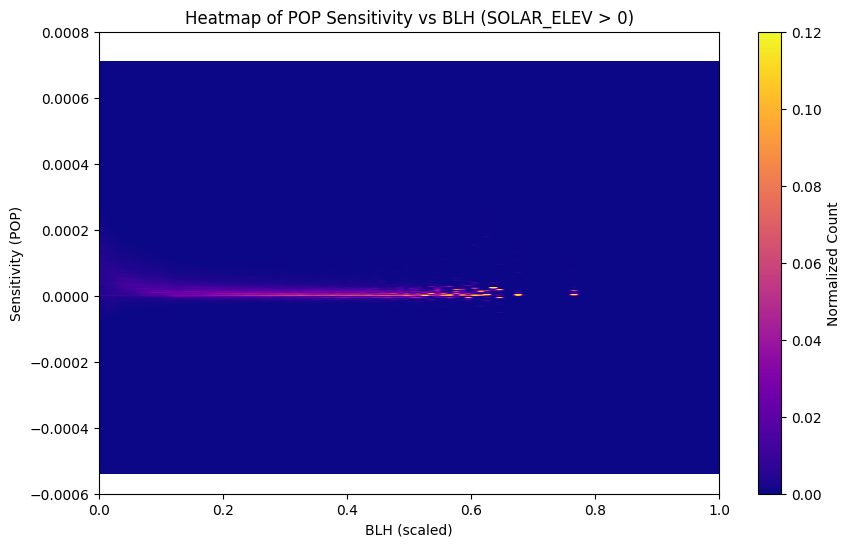

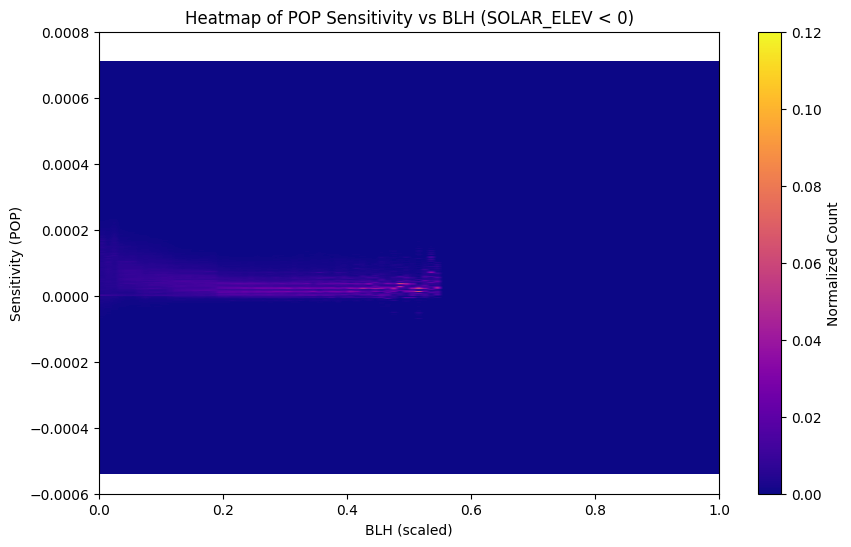

In [68]:
## POP vs BLH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'BLH'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[11, 'min']
height_max = min_max_df.loc[11, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


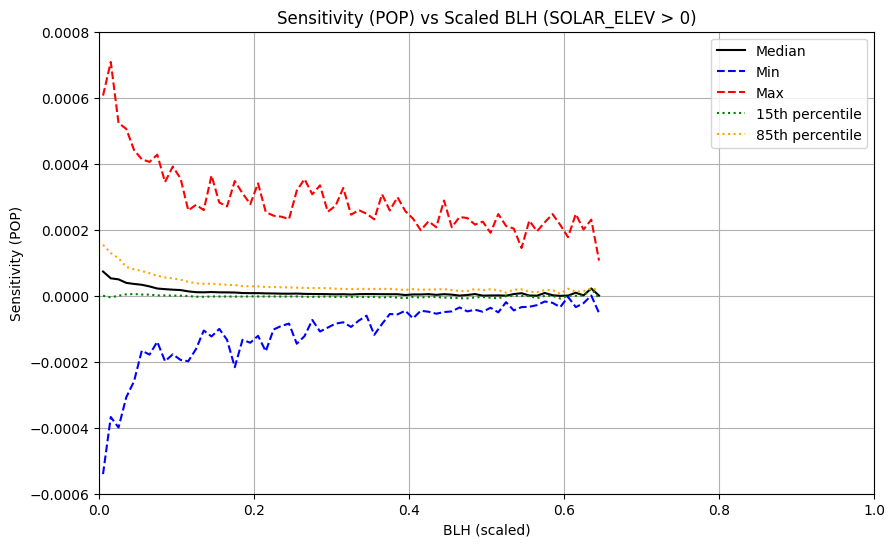

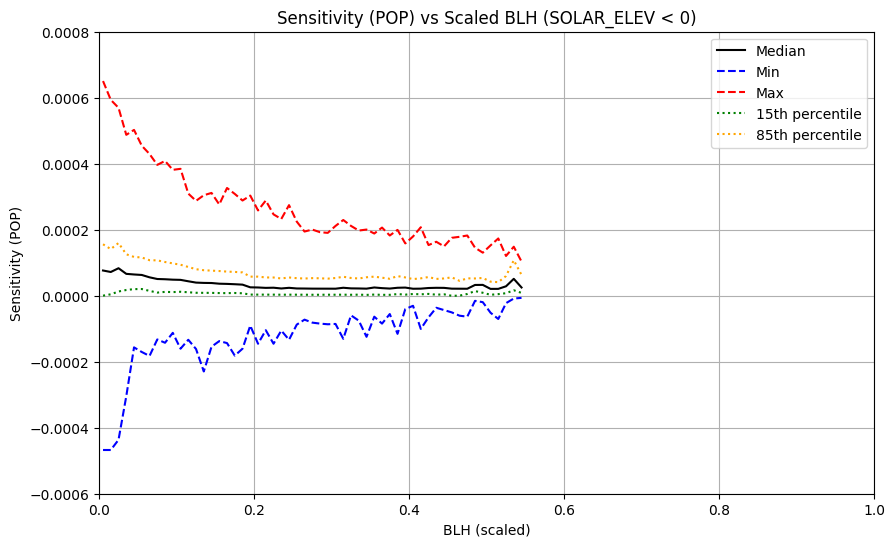

In [69]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


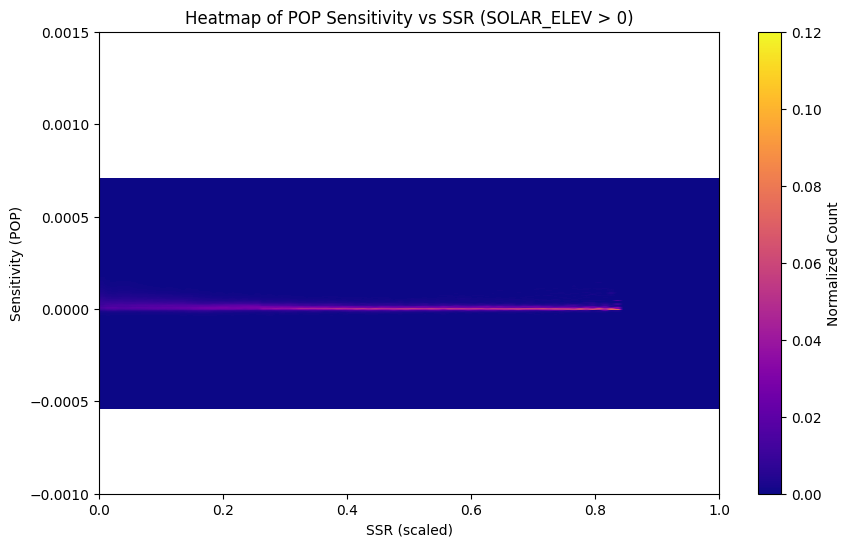

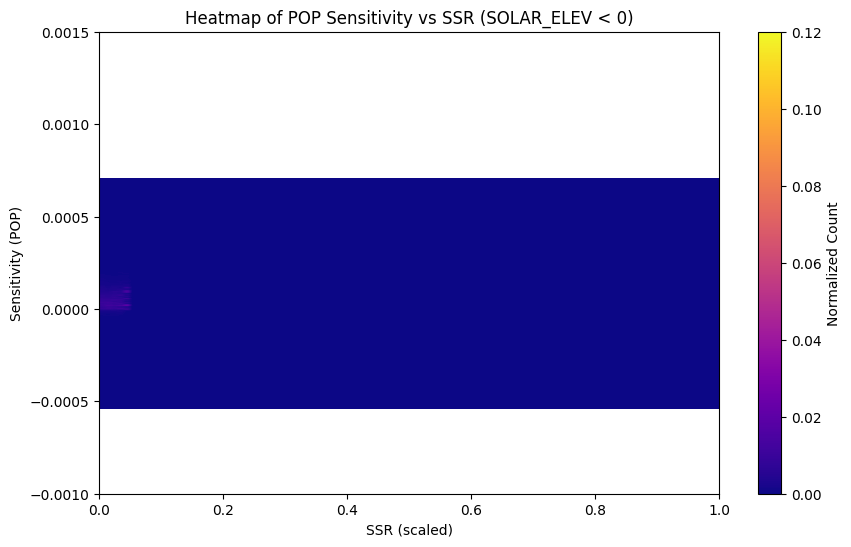

In [36]:
## POP vs SSR with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'SSR'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[12, 'min']
height_max = min_max_df.loc[12, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


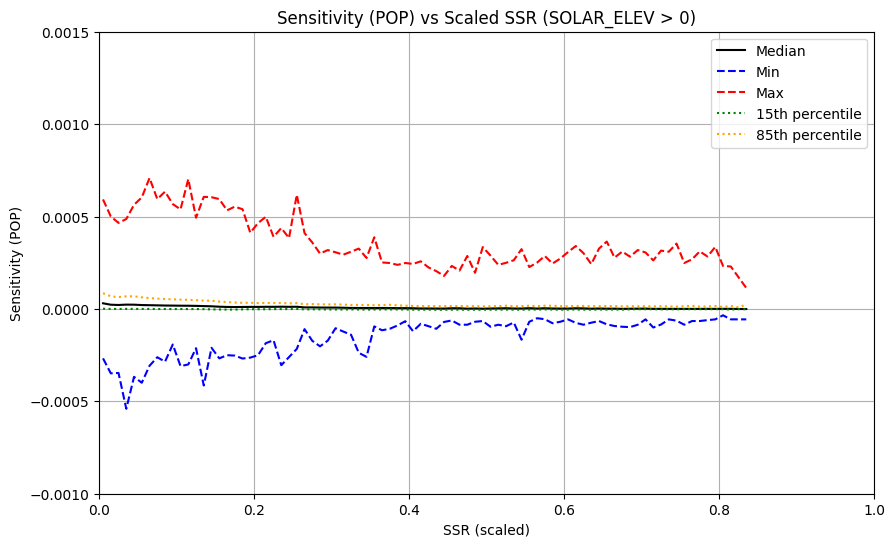

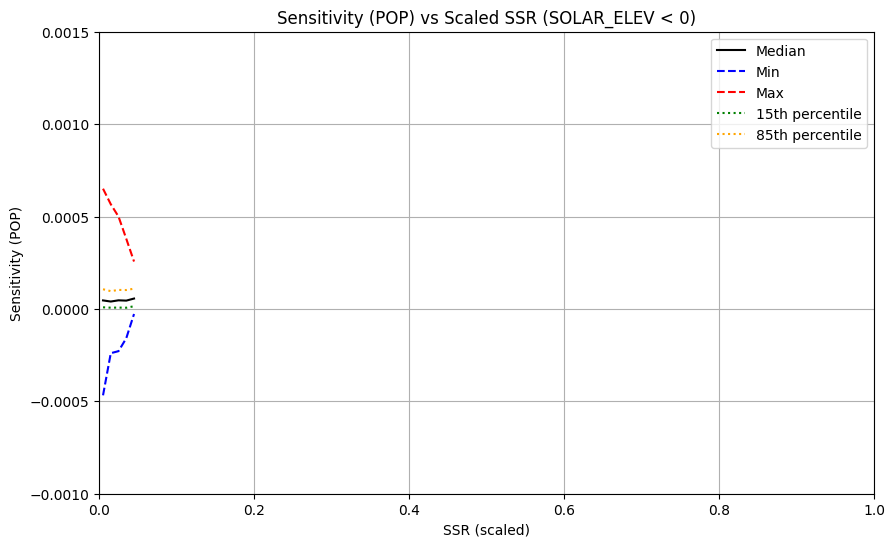

In [37]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


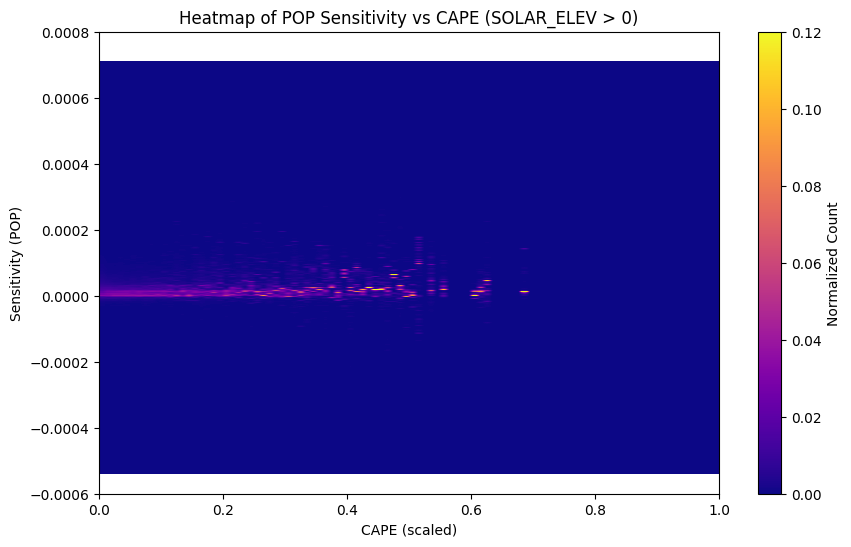

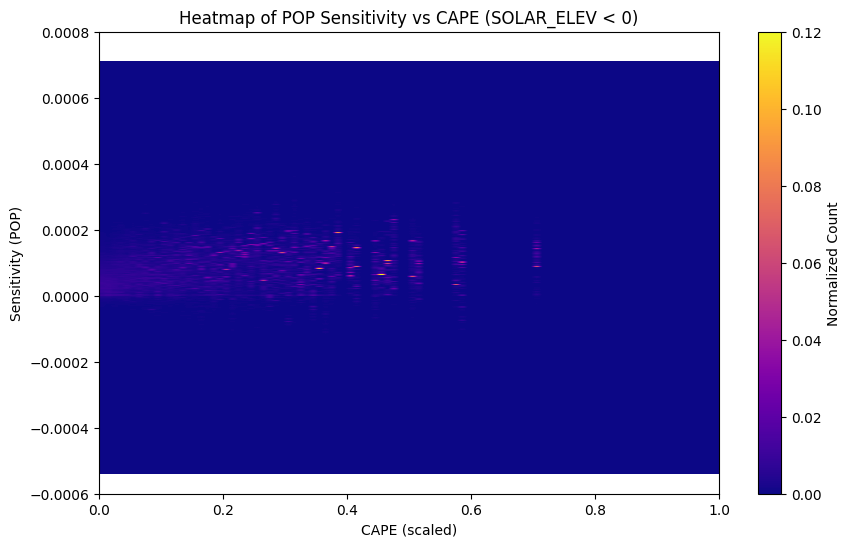

In [70]:
## POP vs CAPE with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'POP'
corr_column = 'CAPE'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[15, 'min']
height_max = min_max_df.loc[15, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0006, 0.0008)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


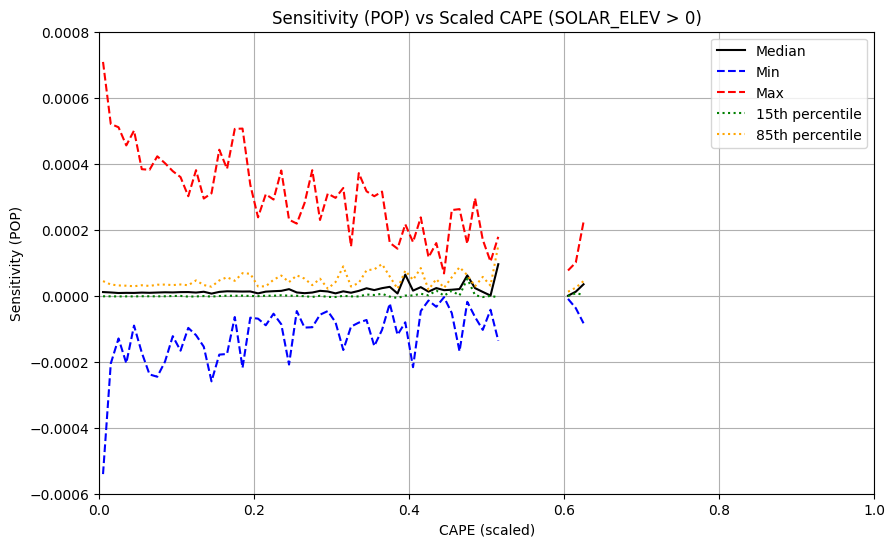

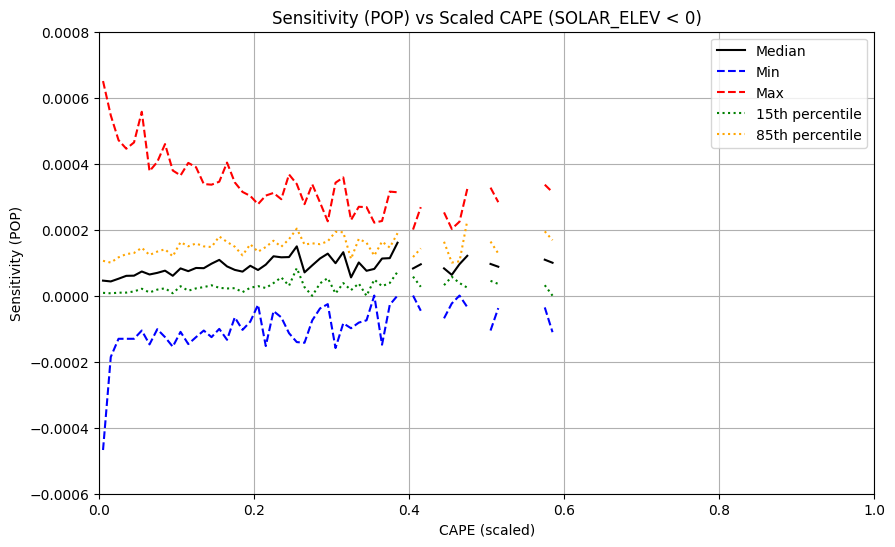

In [71]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0006, 0.0008)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 3.42 seconds.
Processed TRAIN chunk 2 in 3.47 seconds.
Processed TRAIN chunk 3 in 3.47 seconds.
Processed TRAIN chunk 4 in 3.49 seconds.
Processed TRAIN chunk 5 in 3.45 seconds.
Processed TRAIN chunk 6 in 3.43 seconds.
Processed TRAIN chunk 7 in 3.49 seconds.
Processed TRAIN chunk 8 in 3.49 seconds.
Processed TRAIN chunk 9 in 3.57 seconds.
Processed TRAIN chunk 10 in 3.53 seconds.
Processed TRAIN chunk 11 in 3.44 seconds.
Processed TRAIN chunk 12 in 3.46 seconds.
Processed TRAIN chunk 13 in 3.45 seconds.
Processed TRAIN chunk 14 in 3.45 seconds.
Processed TRAIN chunk 15 in 3.51 seconds.
Processed TRAIN chunk 16 in 3.47 seconds.
Processed TRAIN chunk 17 in 3.52 seconds.
Processed TRAIN chunk 18 in 3.46 seconds.
Processed TRAIN chunk 19 in 3.55 seconds.
Processed TRAIN chunk 20 in 3.57 seconds.
Processed TRAIN chunk 21 in 3.42 seconds.
Processed TRAIN chunk 22 in 3.45 seconds.
Processed TRAIN chunk 23 in 3.53 seconds.
P

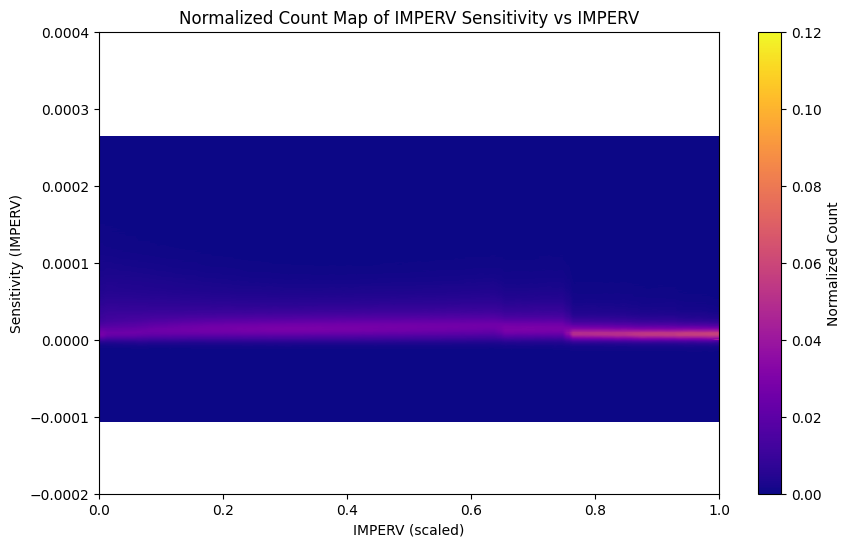

In [72]:
# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[2, 'min']
height_max = min_max_df.loc[2, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_imperv = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity across all batches
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins now that we know min/max
sens_bins_imperv = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators
heatmap_count_imperv = np.zeros((len(height_bins_imperv) - 1, len(sens_bins_imperv) - 1))
height_bin_counts_imperv = np.zeros(len(height_bins_imperv) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['IMPERV'], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time() 
    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        chunk_counter += 1
        
        
        # Align the batches
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk['IMPERV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)  # Ensure within [0, 1]

        # 2D histogram accumulation
        hmap, _, _ = np.histogram2d(height_scaled, sensitivities, bins=[height_bins_imperv, sens_bins_imperv])
        hcount, _ = np.histogram(height_scaled, bins=height_bins_imperv)

        # Update accumulators
        heatmap_count_imperv += hmap
        height_bin_counts_imperv += hcount

        # Calculate time taken for this chunk
        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize
for i in range(len(height_bin_counts_imperv)):
    if height_bin_counts_imperv[i] > 0:
        heatmap_count_imperv[i, :] /= height_bin_counts_imperv[i]

# Plotting
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_imperv.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel('IMPERV (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Normalized Count Map of {sensitivity_column} Sensitivity vs IMPERV')
plt.grid(False)
plt.show()


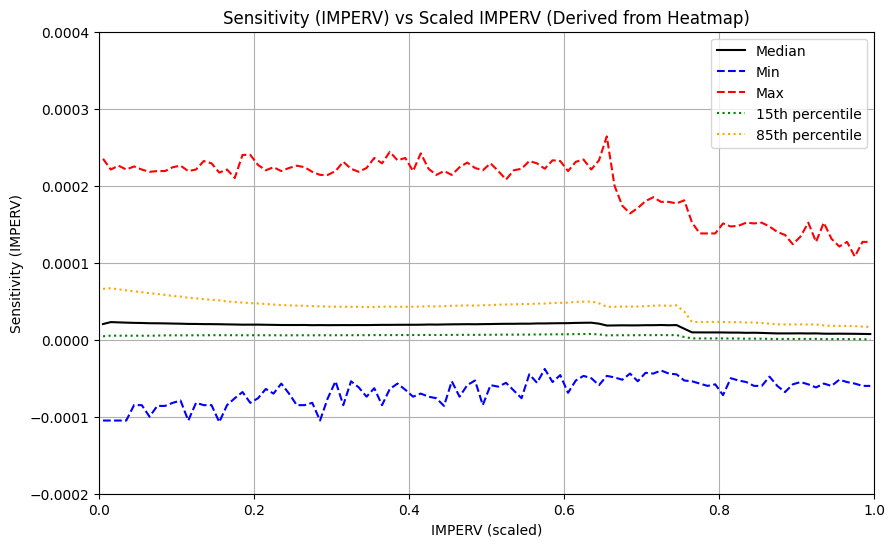

In [73]:
sensitivity_column = "IMPERV"
corr_column = "IMPERV"
# Compute bin centers for HEIGHT and sensitivity
bin_centers_height = (height_bins_imperv[:-1] + height_bins_imperv[1:]) / 2
bin_centers_sens = (sens_bins_imperv[:-1] + sens_bins_imperv[1:]) / 2

# Prepare lists to store computed statistics
median_sens = []
min_sens = []
max_sens = []
p15_sens = []
p85_sens = []

# Compute statistics from the normalized histograms
for i in range(heatmap_count_imperv.shape[0]):
    counts = heatmap_count_imperv[i, :]
    
    if counts.sum() == 0:
        median_sens.append(np.nan)
        min_sens.append(np.nan)
        max_sens.append(np.nan)
        p15_sens.append(np.nan)
        p85_sens.append(np.nan)
        continue

    cdf = np.cumsum(counts)
    cdf = cdf / cdf[-1]  # Normalize to [0, 1]
    
    # Get interpolated values at desired percentiles
    median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
    p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
    p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

    # Min/max from non-zero counts
    nonzero_idx = np.where(counts > 0)[0]
    min_sens.append(bin_centers_sens[nonzero_idx[0]])
    max_sens.append(bin_centers_sens[nonzero_idx[-1]])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_sens, label='Median', color='black')
plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0,1)
plt.ylim(-0.0002, 0.0004)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} (Derived from Heatmap)')
plt.legend()
plt.grid(True)
plt.show()



Starting processing for TRAIN dataset...
Processed TRAIN chunk 1 in 3.77 seconds.
Processed TRAIN chunk 2 in 3.77 seconds.
Processed TRAIN chunk 3 in 3.84 seconds.
Processed TRAIN chunk 4 in 3.68 seconds.
Processed TRAIN chunk 5 in 3.76 seconds.
Processed TRAIN chunk 6 in 3.81 seconds.
Processed TRAIN chunk 7 in 3.76 seconds.
Processed TRAIN chunk 8 in 3.71 seconds.
Processed TRAIN chunk 9 in 3.70 seconds.
Processed TRAIN chunk 10 in 3.74 seconds.
Processed TRAIN chunk 11 in 3.82 seconds.
Processed TRAIN chunk 12 in 3.67 seconds.
Processed TRAIN chunk 13 in 3.68 seconds.
Processed TRAIN chunk 14 in 3.72 seconds.
Processed TRAIN chunk 15 in 3.68 seconds.
Processed TRAIN chunk 16 in 3.69 seconds.
Processed TRAIN chunk 17 in 3.70 seconds.
Processed TRAIN chunk 18 in 3.70 seconds.
Processed TRAIN chunk 19 in 3.74 seconds.
Processed TRAIN chunk 20 in 3.85 seconds.
Processed TRAIN chunk 21 in 3.82 seconds.
Processed TRAIN chunk 22 in 3.80 seconds.
Processed TRAIN chunk 23 in 3.69 seconds.
P

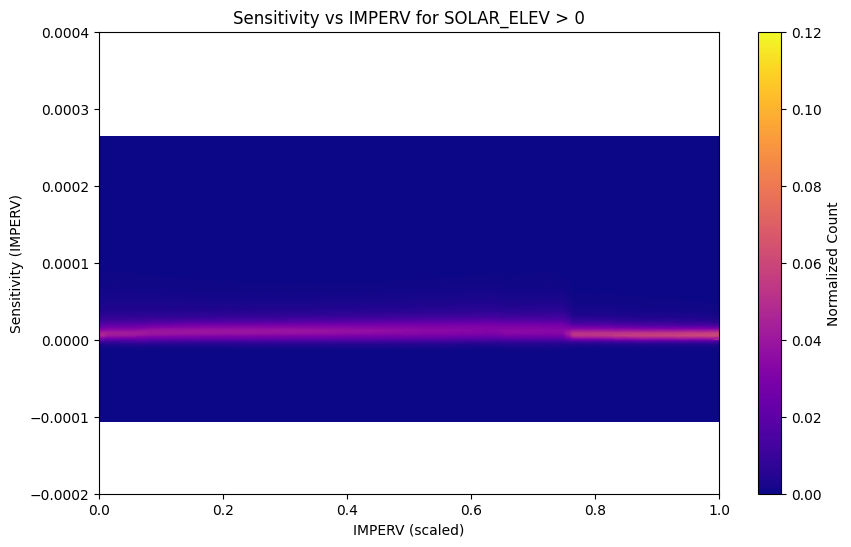

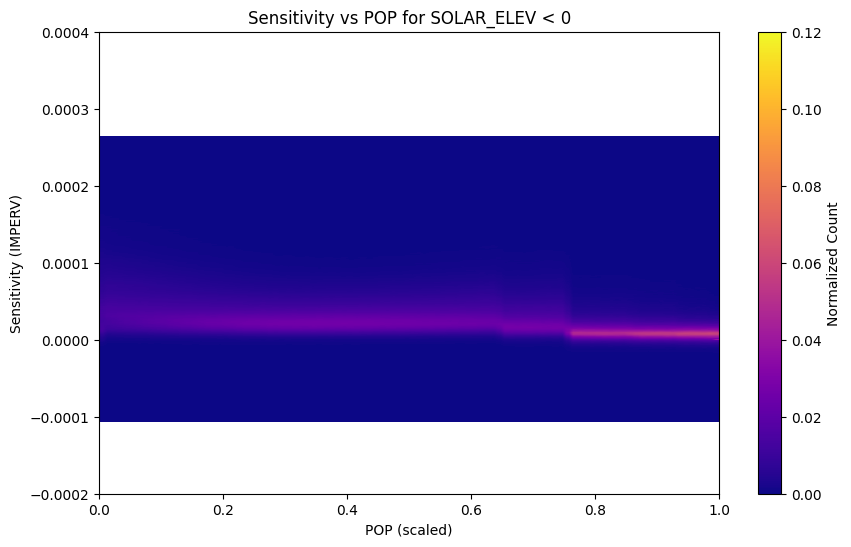

In [74]:
# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[2, 'min']
height_max = min_max_df.loc[2, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity across all batches
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins now that we know min/max
sens_bins_pop = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for two conditions
heatmap_count_pos_pop = np.zeros((len(height_bins_pop) - 1, len(sens_bins_pop) - 1))
height_bin_counts_pos = np.zeros(len(height_bins_pop) - 1)

heatmap_count_neg_pop = np.zeros((len(height_bins_pop) - 1, len(sens_bins_pop) - 1))
height_bin_counts_neg = np.zeros(len(height_bins_pop) - 1)

# Process all datasets in chunks
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nStarting processing for {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=['IMPERV', 'SOLAR_ELEV'], chunksize=batch_size)

    chunk_counter = 0
    start_time = time.time()
    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        chunk_counter += 1
        
        # Extract columns
        sensitivities = dds_chunk[sensitivity_column].values
        pops = cities_chunk['IMPERV'].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap_count, height_bin_counts in [
            (mask_pos, heatmap_count_pos_pop, height_bin_counts_pos),
            (mask_neg, heatmap_count_neg_pop, height_bin_counts_neg)
        ]:
            if not np.any(mask):
                continue  # Skip if no data in this condition

            sens_filtered = sensitivities[mask]
            pop_filtered = pops[mask]

            # Scale POP
            pop_scaled = (pop_filtered - height_min) / (height_max - height_min)
            pop_scaled = np.clip(pop_scaled, 0, 1)

            # 2D histogram accumulation
            hmap, _, _ = np.histogram2d(pop_scaled, sens_filtered, bins=[height_bins_pop, sens_bins_pop])
            hcount, _ = np.histogram(pop_scaled, bins=height_bins_pop)

            heatmap_count += hmap
            height_bin_counts += hcount

        chunk_time = time.time() - start_time
        print(f"Processed {part} chunk {chunk_counter} in {chunk_time:.2f} seconds.")
        start_time = time.time()

# Normalize both heatmaps
def normalize_heatmap(heatmap, bin_counts):
    for i in range(len(bin_counts)):
        if bin_counts[i] > 0:
            heatmap[i, :] /= bin_counts[i]
    return heatmap

heatmap_count_pos_pop = normalize_heatmap(heatmap_count_pos_pop, height_bin_counts_pos)
heatmap_count_neg_pop = normalize_heatmap(heatmap_count_neg_pop, height_bin_counts_neg)

# Plotting for SOLAR_ELEV > 0
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_pos_pop.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel('IMPERV (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs IMPERV for SOLAR_ELEV > 0')
plt.ylim(-0.0002, 0.0004)
plt.grid(False)
plt.show()

# Plotting for SOLAR_ELEV < 0
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_count_neg_pop.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel('POP (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs POP for SOLAR_ELEV < 0')
plt.ylim(-0.0002, 0.0004)
plt.grid(False)
plt.show()


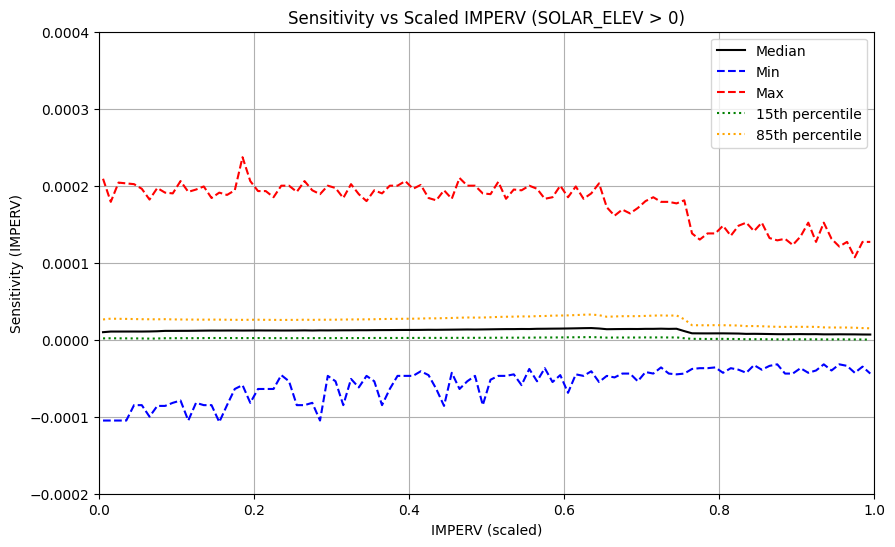

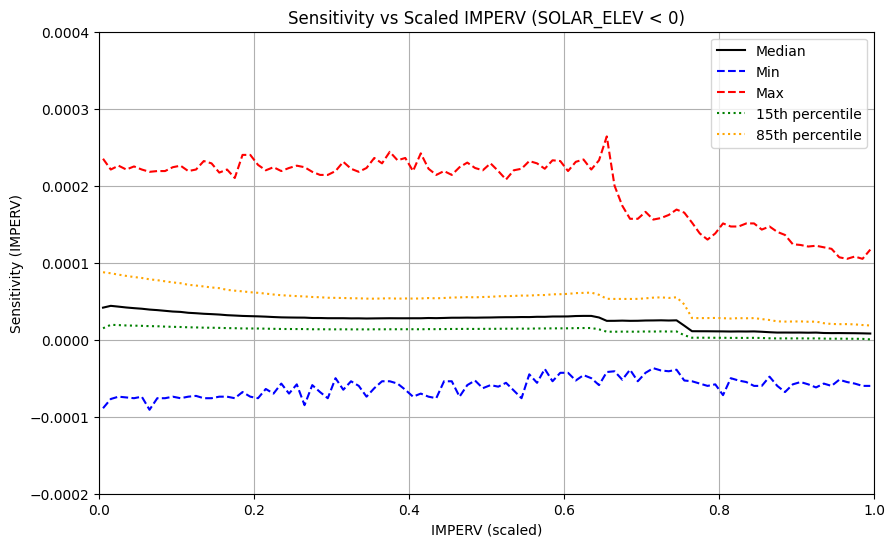

In [75]:
corr_column = "IMPERV"
def compute_sensitivity_stats(heatmap, bin_centers_sens):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]
        
        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens


# Compute bin centers
bin_centers_height = (height_bins_pop[:-1] + height_bins_pop[1:]) / 2
bin_centers_sens = (sens_bins_pop[:-1] + sens_bins_pop[1:]) / 2

# Get statistics for SOLAR_ELEV > 0
median_pos, min_pos, max_pos, p15_pos, p85_pos = compute_sensitivity_stats(heatmap_count_pos_pop, bin_centers_sens)

# Get statistics for SOLAR_ELEV < 0
median_neg, min_neg, max_neg, p15_neg, p85_neg = compute_sensitivity_stats(heatmap_count_neg_pop, bin_centers_sens)

# Plot for SOLAR_ELEV > 0
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_pos, label='Median', color='black')
plt.plot(bin_centers_height, min_pos, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_pos, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_pos, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_pos, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0, 1)
plt.ylim(-0.0002, 0.0004)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs Scaled {corr_column} (SOLAR_ELEV > 0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot for SOLAR_ELEV < 0
plt.figure(figsize=(10, 6))
plt.plot(bin_centers_height, median_neg, label='Median', color='black')
plt.plot(bin_centers_height, min_neg, label='Min', linestyle='--', color='blue')
plt.plot(bin_centers_height, max_neg, label='Max', linestyle='--', color='red')
plt.plot(bin_centers_height, p15_neg, label='15th percentile', linestyle=':', color='green')
plt.plot(bin_centers_height, p85_neg, label='85th percentile', linestyle=':', color='orange')

plt.xlim(0, 1)
plt.ylim(-0.0002, 0.0004)
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.title(f'Sensitivity vs Scaled {corr_column} (SOLAR_ELEV < 0)')
plt.legend()
plt.grid(True)
plt.show()



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


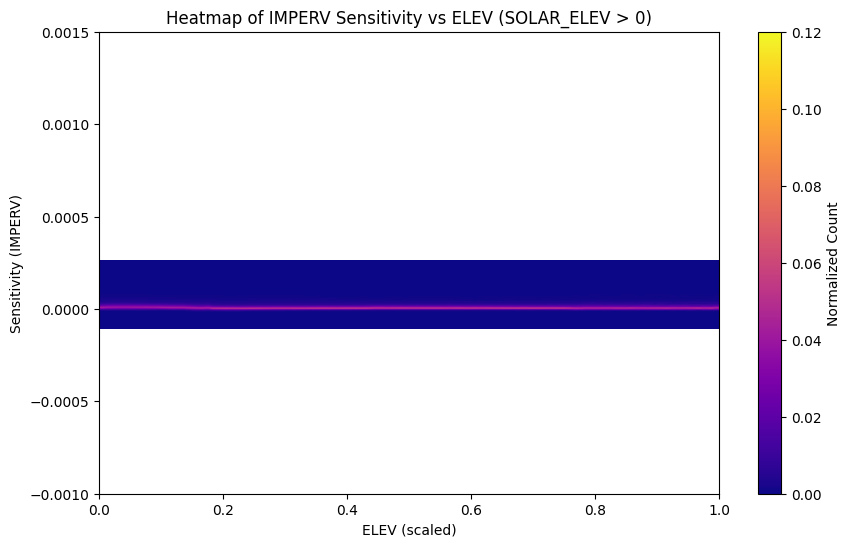

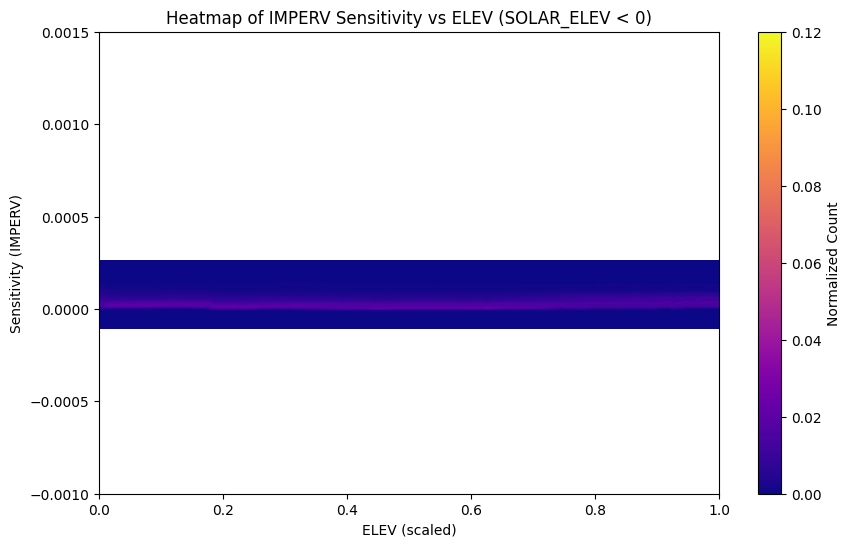

In [3]:
## IMPERV vs COAST with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'ELEV'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[1, 'min']
height_max = min_max_df.loc[1, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


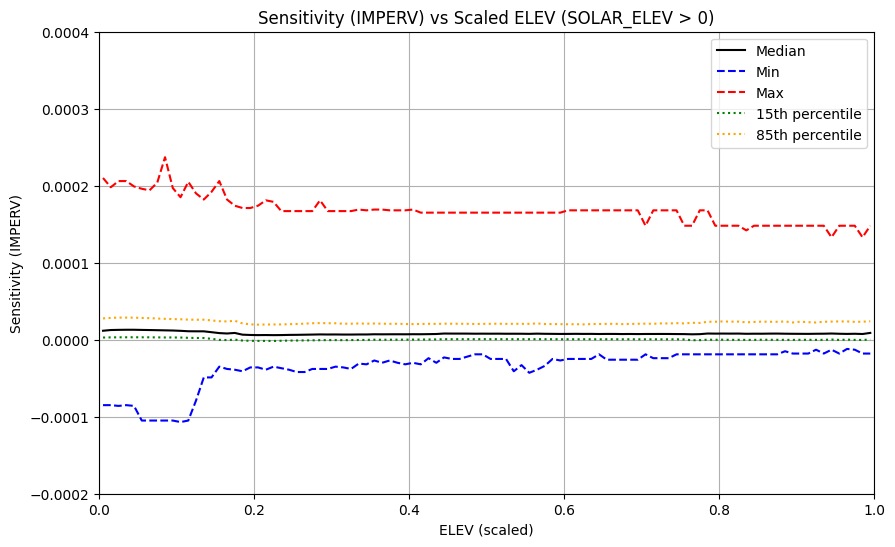

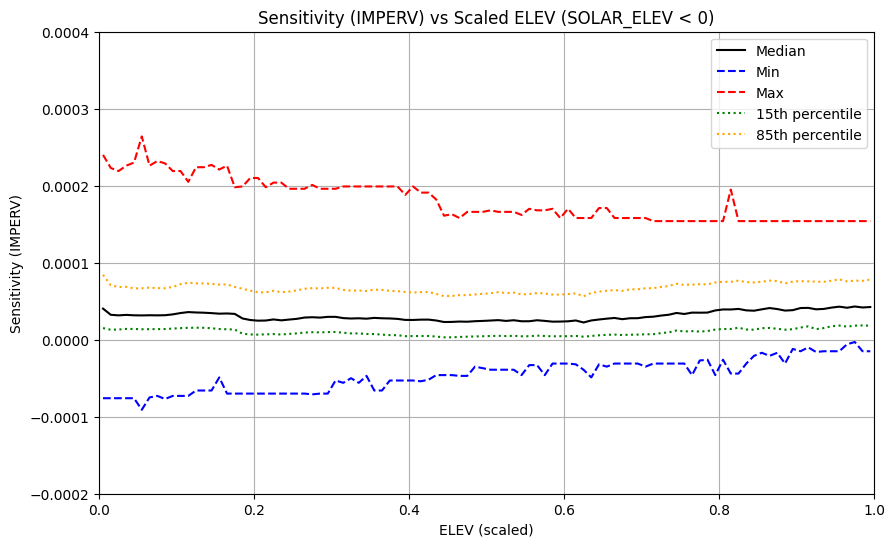

In [5]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


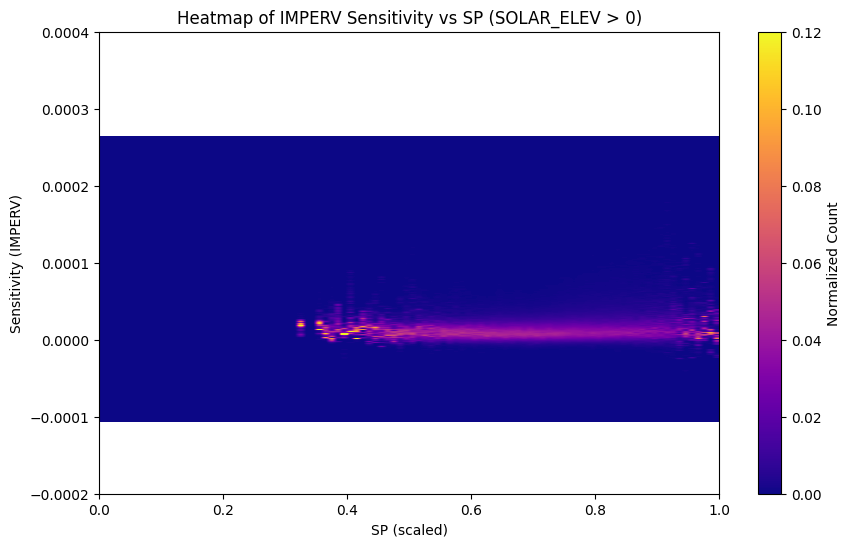

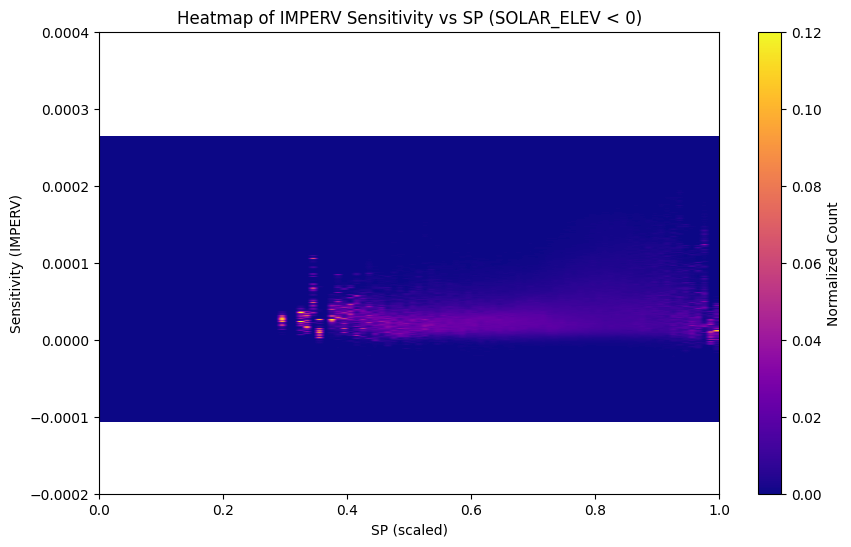

In [7]:
## IMPERV vs SP with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'SP'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[6, 'min']
height_max = min_max_df.loc[6, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


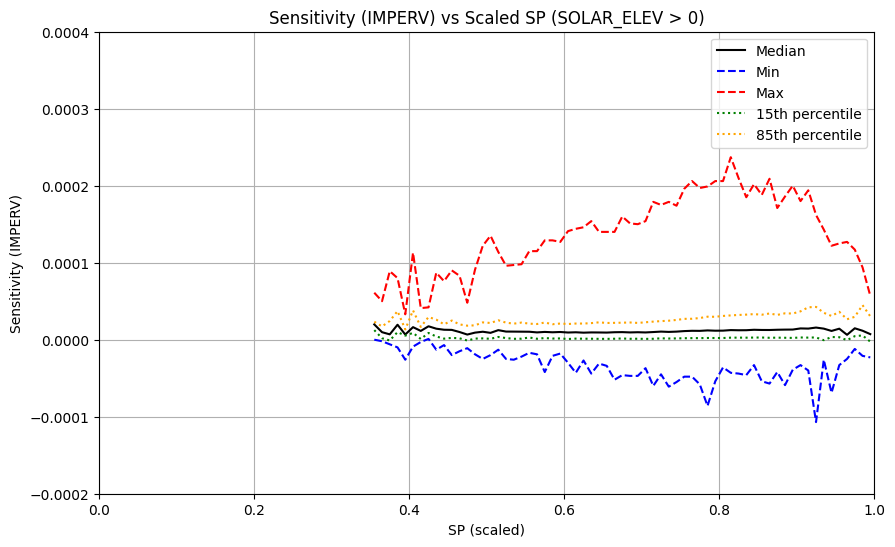

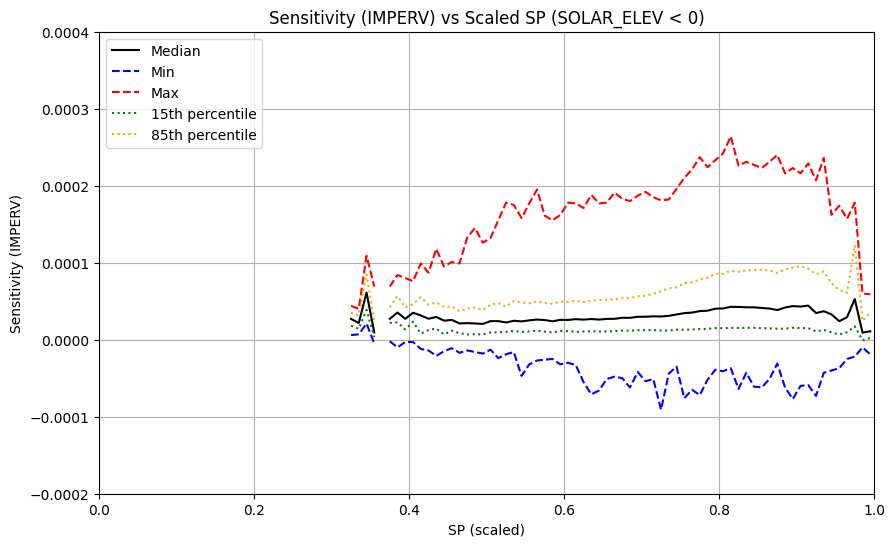

In [8]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


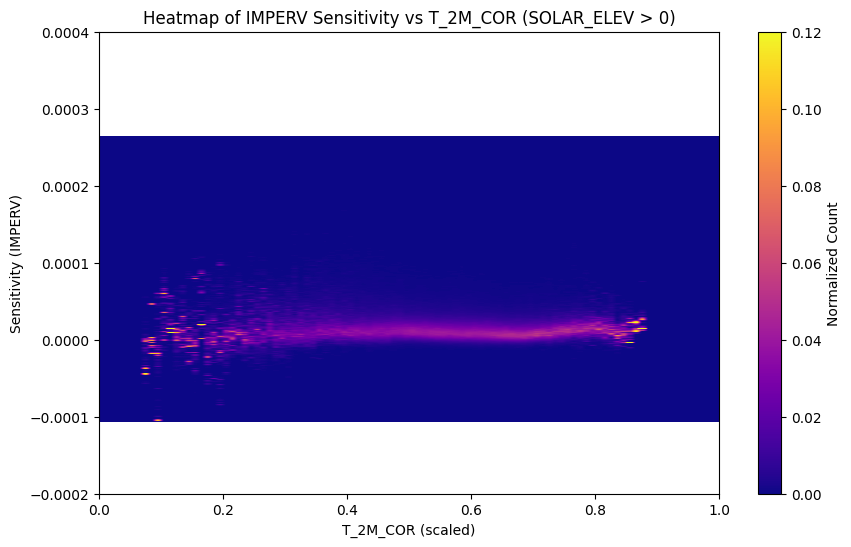

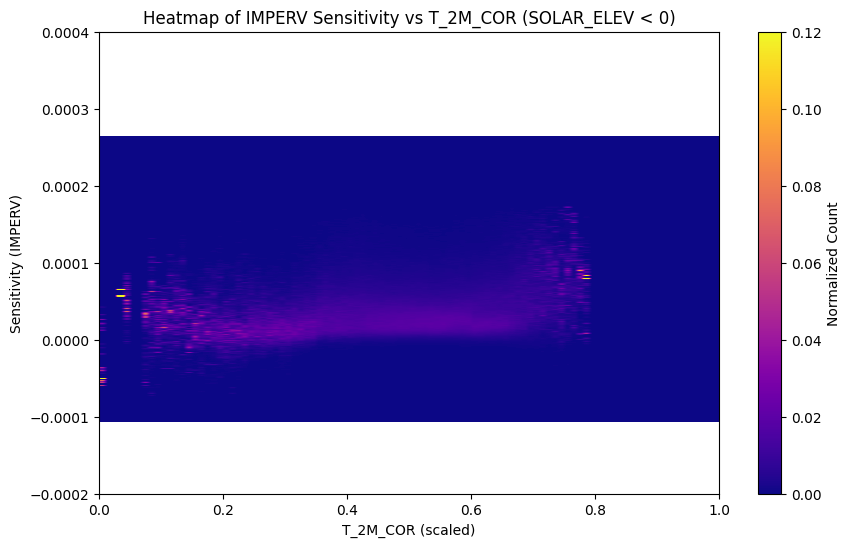

In [78]:
## IMPERV vs T_2M_COR with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'T_2M_COR'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[9, 'min']
height_max = min_max_df.loc[9, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


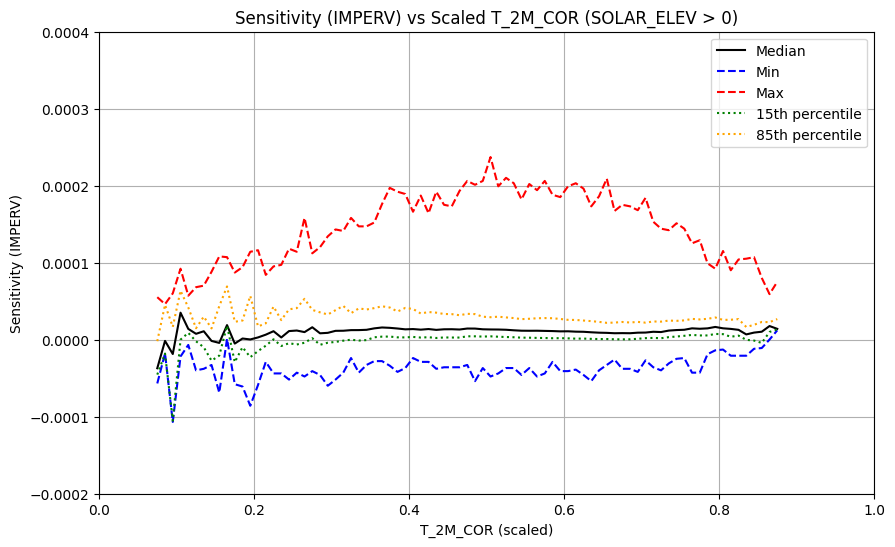

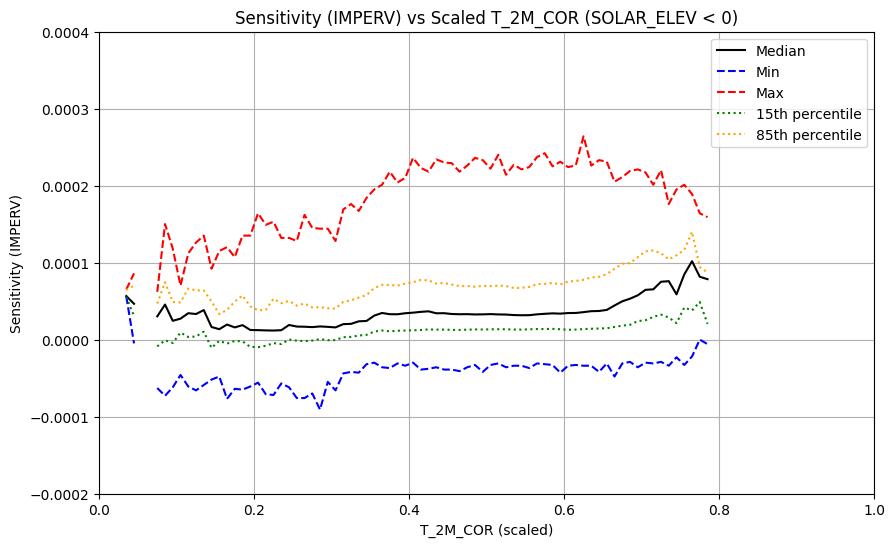

In [79]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


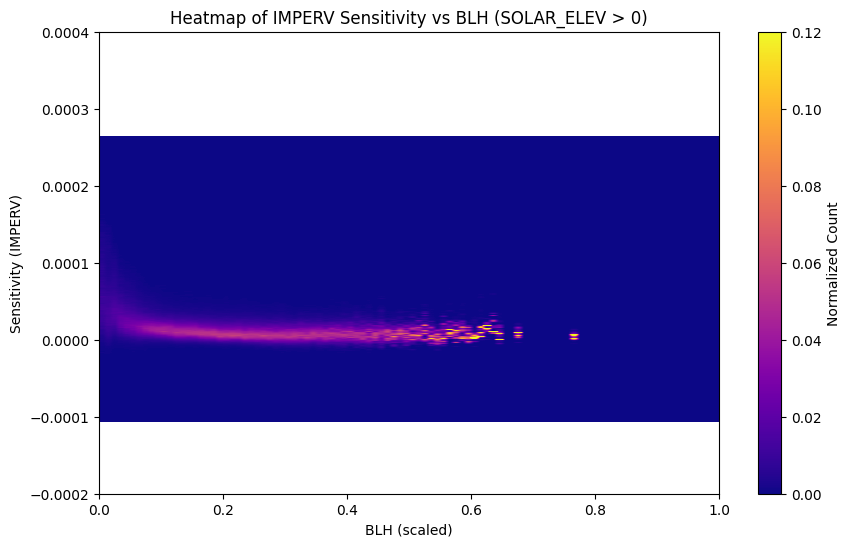

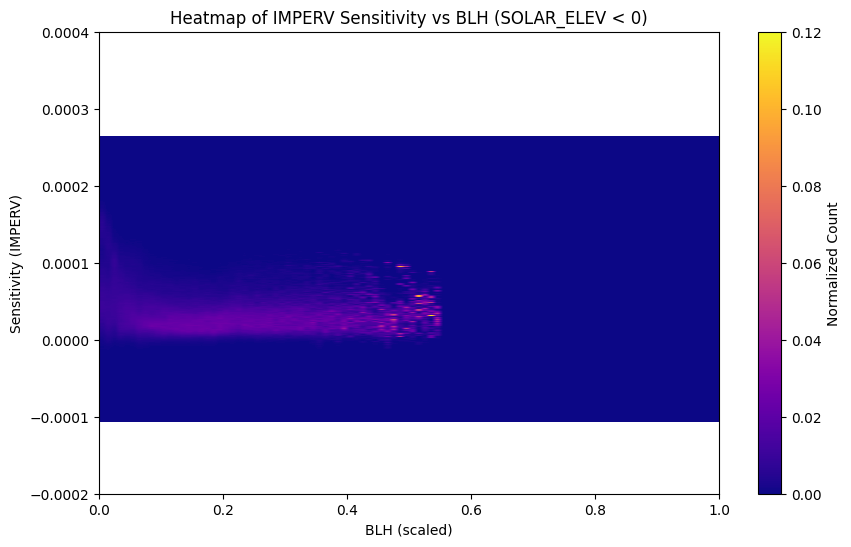

In [80]:
## IMPERV vs BLH with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'BLH'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[11, 'min']
height_max = min_max_df.loc[11, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


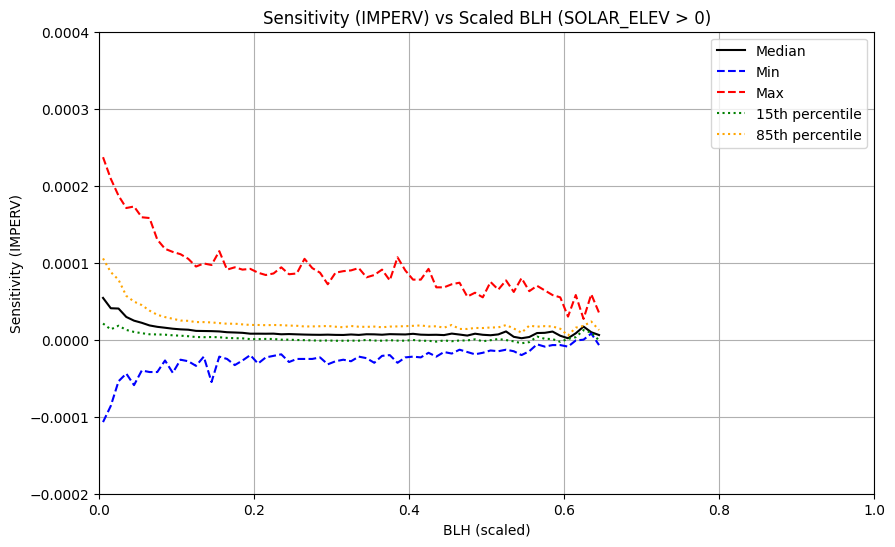

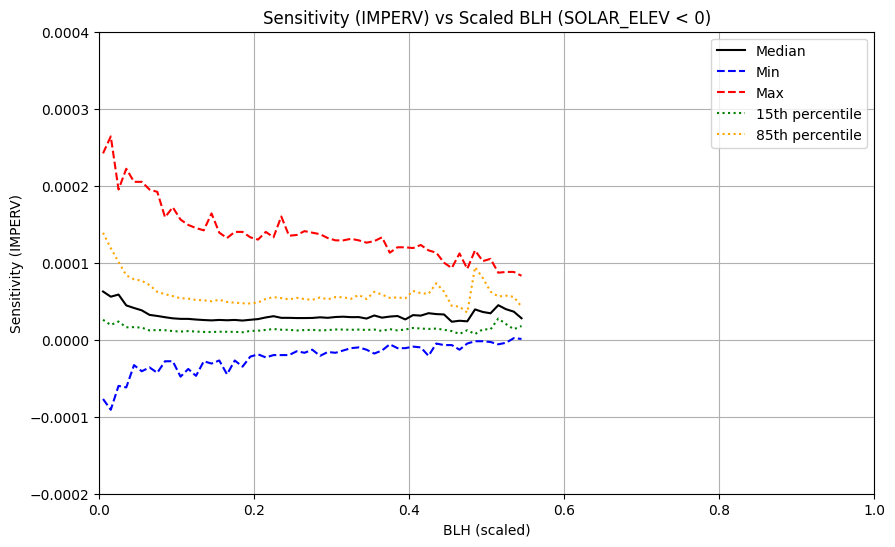

In [81]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


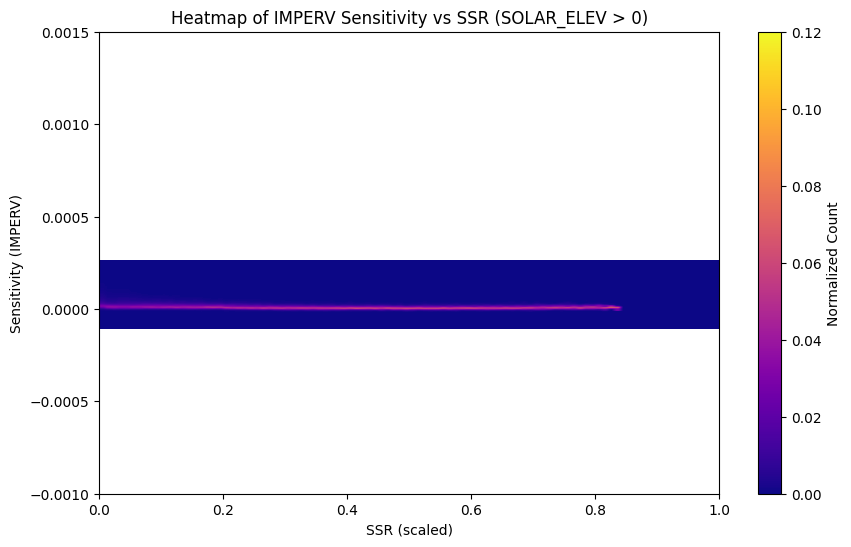

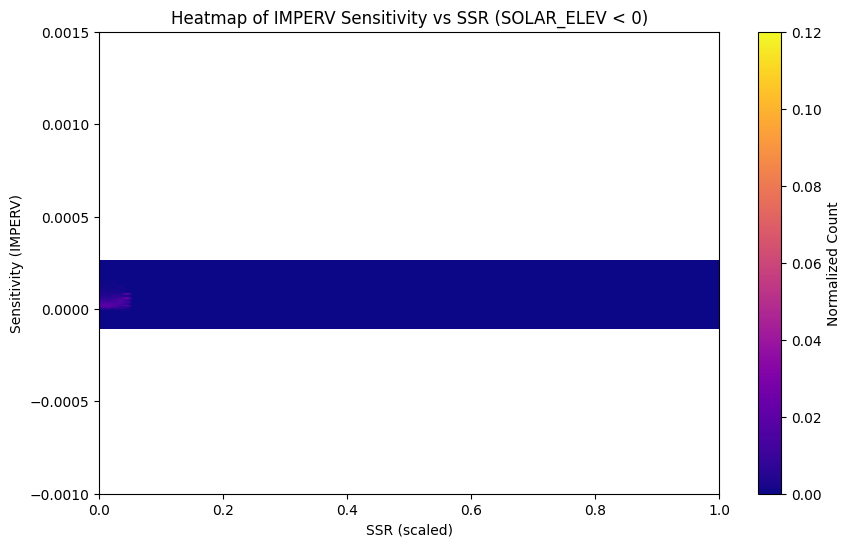

In [52]:
## IMPERV vs SSR with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'SSR'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[12, 'min']
height_max = min_max_df.loc[12, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.001, 0.0015)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


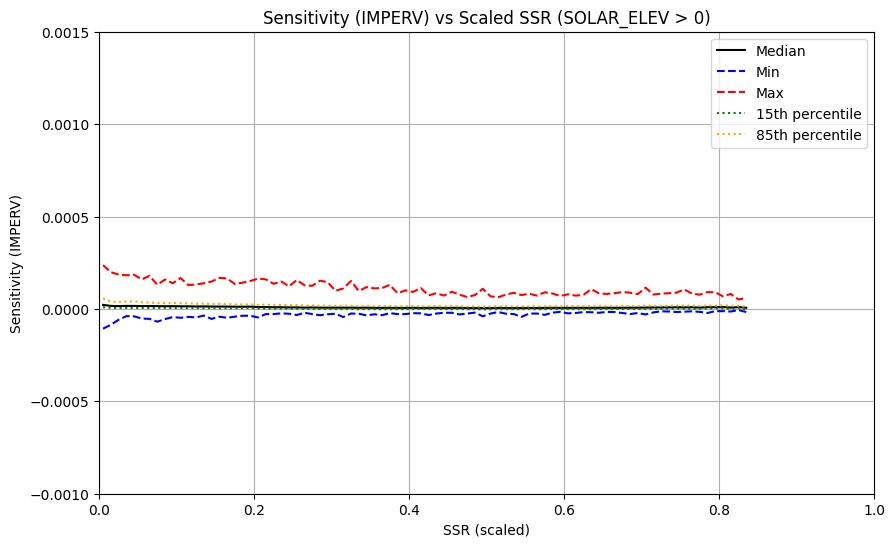

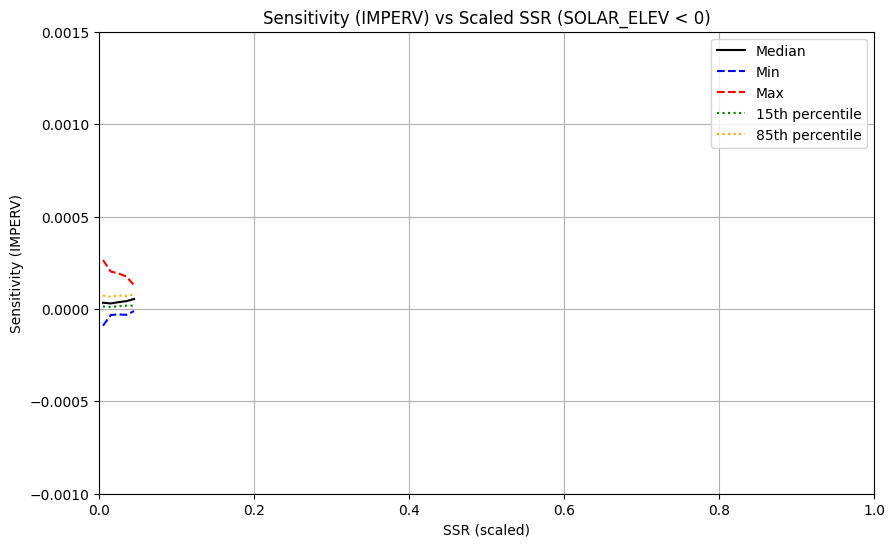

In [53]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.001, 0.0015)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')



Processing TRAIN dataset...

Processing VALIDATION dataset...

Processing TEST dataset...


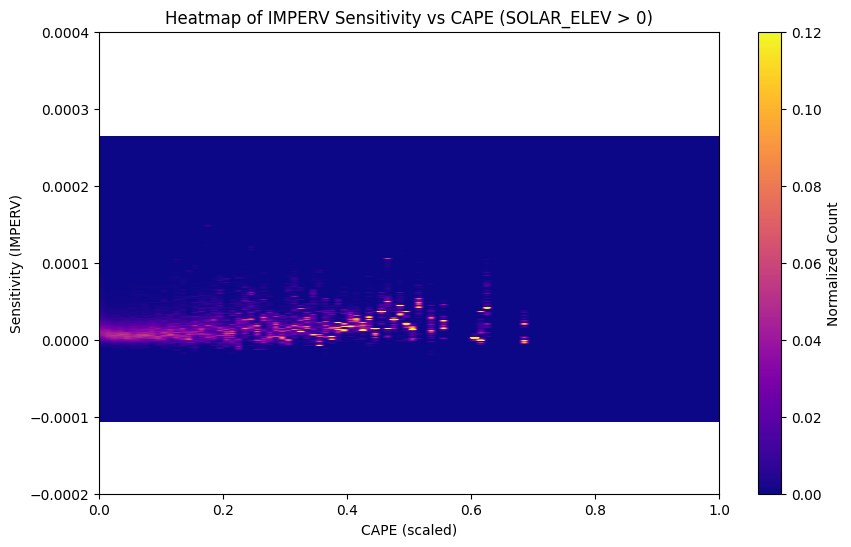

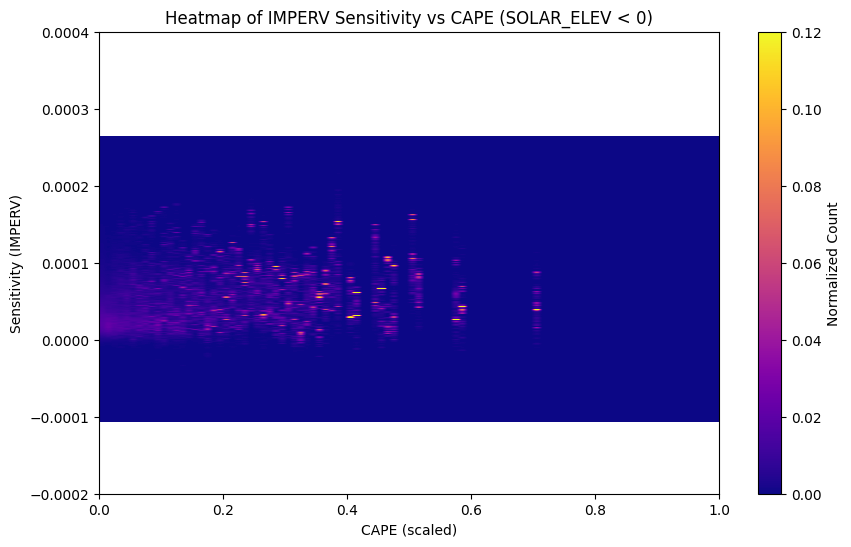

In [82]:
## IMPERV vs CAPE with SOLAR_ELEV split ##

# Settings
data_parts = ['TRAIN', 'VALIDATION', 'TEST']
batch_size = 1_000_000
sensitivity_column = 'IMPERV'
corr_column = 'CAPE'

min_max_file = r"data/total_min_max.csv"
min_max_df = pd.read_csv(min_max_file, sep=';')

# Precomputed min/max values for scaling
height_min = min_max_df.loc[15, 'min']
height_max = min_max_df.loc[15, 'Max']

# Define binning
height_bin_size = 0.01
sens_bin_size = 0.000001

height_bins_pop_0 = np.arange(0, 1 + height_bin_size, height_bin_size)
sens_min = float('inf')
sens_max = float('-inf')

# First pass to determine min/max sensitivity
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    for chunk in pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size):
        sens_min = min(sens_min, chunk[sensitivity_column].min())
        sens_max = max(sens_max, chunk[sensitivity_column].max())

# Define sensitivity bins
sens_bins_pop_0 = np.arange(sens_min, sens_max + sens_bin_size, sens_bin_size)

# Prepare accumulators for both conditions
heatmap_pos = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_pos_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

heatmap_neg = np.zeros((len(height_bins_pop_0) - 1, len(sens_bins_pop_0) - 1))
height_counts_neg_pop_0 = np.zeros(len(height_bins_pop_0) - 1)

# Process datasets
for part in data_parts:
    dds_file = f'results/DDSI_CL3_{part}.csv'
    cities_file = f'data/CLUSTER3_{part}_cleaned_cities.csv'

    print(f"\nProcessing {part} dataset...")

    dds_iter = pd.read_csv(dds_file, usecols=[sensitivity_column], chunksize=batch_size)
    cities_iter = pd.read_csv(cities_file, usecols=[corr_column, 'SOLAR_ELEV'], chunksize=batch_size)

    for dds_chunk, cities_chunk in zip(dds_iter, cities_iter):
        # Align data
        sensitivities = dds_chunk[sensitivity_column].values
        heights = cities_chunk[corr_column].values
        solar_elev = cities_chunk['SOLAR_ELEV'].values

        # Scale HEIGHT
        height_scaled = (heights - height_min) / (height_max - height_min)
        height_scaled = np.clip(height_scaled, 0, 1)

        # Apply masks
        mask_pos = solar_elev > 0
        mask_neg = solar_elev < 0

        for mask, heatmap, count_acc in [
            (mask_pos, heatmap_pos, height_counts_pos_pop_0),
            (mask_neg, heatmap_neg, height_counts_neg_pop_0),
        ]:
            h = height_scaled[mask]
            s = sensitivities[mask]
            hmap, _, _ = np.histogram2d(h, s, bins=[height_bins_pop_0, sens_bins_pop_0])
            hcount, _ = np.histogram(h, bins=height_bins_pop_0)

            heatmap += hmap
            count_acc += hcount

# Normalize
for i in range(len(height_counts_pos_pop_0)):
    if height_counts_pos_pop_0[i] > 0:
        heatmap_pos[i, :] /= height_counts_pos_pop_0[i]

for i in range(len(height_counts_neg_pop_0)):
    if height_counts_neg_pop_0[i] > 0:
        heatmap_neg[i, :] /= height_counts_neg_pop_0[i]

# Plot POSITIVE (daytime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_pos.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV > 0)')
plt.grid(False)
plt.show()

# Plot NEGATIVE (nighttime) heatmap
plt.figure(figsize=(10, 6))
plt.imshow(heatmap_neg.T, origin='lower',
           extent=[0, 1, sens_min, sens_max], aspect='auto', cmap='plasma', vmax=0.12)
plt.colorbar(label='Normalized Count')
plt.xlabel(f'{corr_column} (scaled)')
plt.ylabel(f'Sensitivity ({sensitivity_column})')
plt.ylim(-0.0002, 0.0004)
plt.title(f'Heatmap of {sensitivity_column} Sensitivity vs {corr_column} (SOLAR_ELEV < 0)')
plt.grid(False)
plt.show()


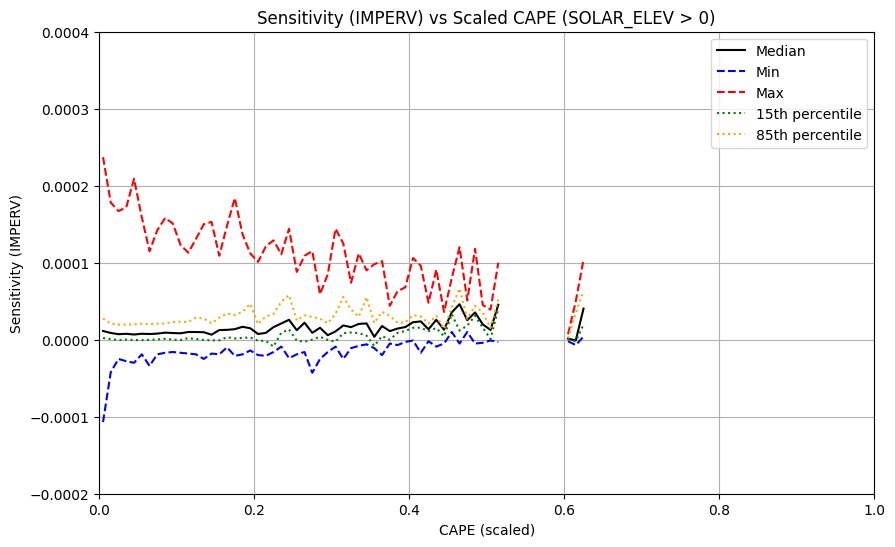

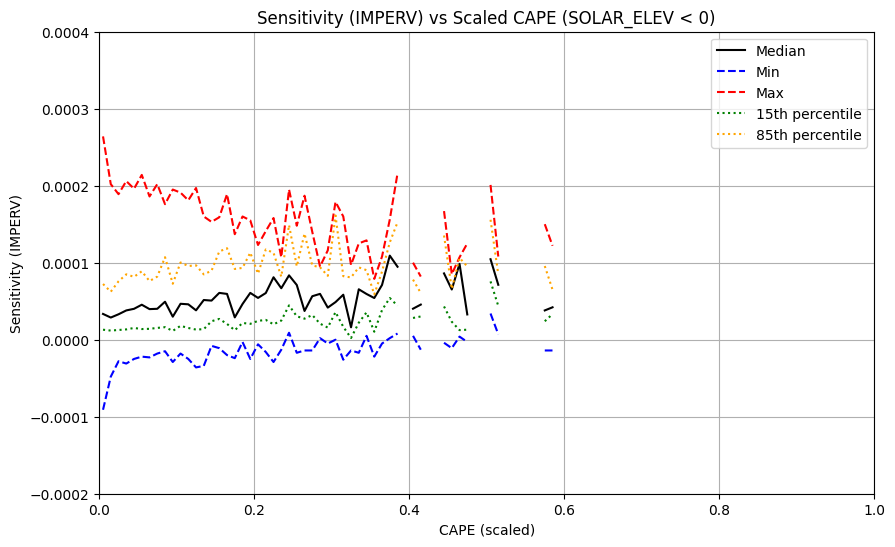

In [83]:
# Assumes: heatmap_counts_pos, heatmap_counts_neg, sens_bins, height_bins, sensitivity_column, corr_column are defined

# Compute bin centers
bin_centers_height = (height_bins_pop_0[:-1] + height_bins_pop_0[1:]) / 2
bin_centers_sens = (sens_bins_pop_0[:-1] + sens_bins_pop_0[1:]) / 2

def compute_statistics(heatmap):
    median_sens = []
    min_sens = []
    max_sens = []
    p15_sens = []
    p85_sens = []

    for i in range(heatmap.shape[0]):
        counts = heatmap[i, :]

        if counts.sum() == 0:
            median_sens.append(np.nan)
            min_sens.append(np.nan)
            max_sens.append(np.nan)
            p15_sens.append(np.nan)
            p85_sens.append(np.nan)
            continue

        cdf = np.cumsum(counts)
        cdf = cdf / cdf[-1]  # Normalize to [0, 1]

        median_sens.append(np.interp(0.5, cdf, bin_centers_sens))
        p15_sens.append(np.interp(0.15, cdf, bin_centers_sens))
        p85_sens.append(np.interp(0.85, cdf, bin_centers_sens))

        nonzero_idx = np.where(counts > 0)[0]
        min_sens.append(bin_centers_sens[nonzero_idx[0]])
        max_sens.append(bin_centers_sens[nonzero_idx[-1]])

    return median_sens, min_sens, max_sens, p15_sens, p85_sens

# Compute stats for both conditions
stats_pos = compute_statistics(heatmap_pos)
stats_neg = compute_statistics(heatmap_neg)

# Helper function to plot results
def plot_stats(bin_centers_height, stats, title_suffix):
    median_sens, min_sens, max_sens, p15_sens, p85_sens = stats

    plt.figure(figsize=(10, 6))
    plt.plot(bin_centers_height, median_sens, label='Median', color='black')
    plt.plot(bin_centers_height, min_sens, label='Min', linestyle='--', color='blue')
    plt.plot(bin_centers_height, max_sens, label='Max', linestyle='--', color='red')
    plt.plot(bin_centers_height, p15_sens, label='15th percentile', linestyle=':', color='green')
    plt.plot(bin_centers_height, p85_sens, label='85th percentile', linestyle=':', color='orange')

    plt.xlabel(f'{corr_column} (scaled)')
    plt.ylabel(f'Sensitivity ({sensitivity_column})')
    plt.xlim(0, 1)
    plt.ylim(-0.0002, 0.0004)
    plt.title(f'Sensitivity ({sensitivity_column}) vs Scaled {corr_column} ({title_suffix})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot both figures
plot_stats(bin_centers_height, stats_pos, 'SOLAR_ELEV > 0')
plot_stats(bin_centers_height, stats_neg, 'SOLAR_ELEV < 0')
